Predict  the monthly "Sales Volume (Unit)" for each of the next 3 months for Unit Heater Tip, Unit Heater Top, Unit heater Ultra

In [260]:
import warnings
warnings.filterwarnings("ignore")

import numpy as np
import pandas as pd

import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.preprocessing import LabelEncoder, OneHotEncoder
from sklearn.linear_model import LinearRegression
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import BaggingRegressor,RandomForestRegressor, GradientBoostingRegressor, AdaBoostRegressor, StackingRegressor
from xgboost import XGBRegressor
from sklearn import metrics
from sklearn.model_selection import GridSearchCV, train_test_split

## Reading the dataset

In [263]:
#Loading dataset
data =  pd.read_excel(r'C:\Users\yasmi\OneDrive\Documents\Data science courses\Data for Forecasting.xlsx')
data.head()


,Sales Order date,Date of creation of customer order in SAP,Sales Volume (Unit),Net Sales (EURO),Invoice Date,Sales document number,Product Group,Product Name,Costumer Number,Sold to Costumer,City_buyer,Country_buyer,Ship to Party,City_delivery,Country_delivery
0,2019-11-13,2019-11-13,6,9319.61,2020-01-02 00:00:00,20335046,1153,Lufterhitzer TOP,1013803,WILHELM JANSEN - EISENJANSEN,Geilenkirchen,Germany,WILHELM JANSEN - EISENJANSEN,Geilenkirchen,Germany
1,2019-11-19,2019-11-20,8,9432.25,02.01.2020,20335706,1153,Lufterhitzer TOP,1013372,SÃ„CHSISCHE HAUSTECHNIK EDKI KG,Hartenstein,Germany,SÃ„CHSISCHE HAUSTECHNIK EDKI KG,Hartenstein,Germany
2,2019-11-27,2019-11-27,4,4202.38,02.01.2020,20336430,1153,Lufterhitzer TOP,1013235,RICHTER + FRENZEL,KÃ¶ln,Germany,MIEBACH HAUSTECHNIK GMBH,Overath,Germany
3,2019-11-28,2019-11-28,3,2250.26,02.01.2020,20336544,1153,Lufterhitzer TOP,1013330,CORDES & GRAEFE BREMEN KG,Stuhr,Germany,CORDES & GRAEFE BREMEN KG,Stuhr,Germany
4,2019-12-05,2019-12-06,1,1525.12,02.01.2020,20337215,1153,Lufterhitzer TOP,1013136,WIEDEMANN INDUSTRIE UND HAUSTECHNIK,Burg,Germany,WIEDEMANN INDUSTRIE UND HAUSTECHNIK,Burg,Germany


## Overview of the dataset

### View the first 5 rows of the dataset

In [266]:
data.head()

,Sales Order date,Date of creation of customer order in SAP,Sales Volume (Unit),Net Sales (EURO),Invoice Date,Sales document number,Product Group,Product Name,Costumer Number,Sold to Costumer,City_buyer,Country_buyer,Ship to Party,City_delivery,Country_delivery
0,2019-11-13,2019-11-13,6,9319.61,2020-01-02 00:00:00,20335046,1153,Lufterhitzer TOP,1013803,WILHELM JANSEN - EISENJANSEN,Geilenkirchen,Germany,WILHELM JANSEN - EISENJANSEN,Geilenkirchen,Germany
1,2019-11-19,2019-11-20,8,9432.25,02.01.2020,20335706,1153,Lufterhitzer TOP,1013372,SÃ„CHSISCHE HAUSTECHNIK EDKI KG,Hartenstein,Germany,SÃ„CHSISCHE HAUSTECHNIK EDKI KG,Hartenstein,Germany
2,2019-11-27,2019-11-27,4,4202.38,02.01.2020,20336430,1153,Lufterhitzer TOP,1013235,RICHTER + FRENZEL,KÃ¶ln,Germany,MIEBACH HAUSTECHNIK GMBH,Overath,Germany
3,2019-11-28,2019-11-28,3,2250.26,02.01.2020,20336544,1153,Lufterhitzer TOP,1013330,CORDES & GRAEFE BREMEN KG,Stuhr,Germany,CORDES & GRAEFE BREMEN KG,Stuhr,Germany
4,2019-12-05,2019-12-06,1,1525.12,02.01.2020,20337215,1153,Lufterhitzer TOP,1013136,WIEDEMANN INDUSTRIE UND HAUSTECHNIK,Burg,Germany,WIEDEMANN INDUSTRIE UND HAUSTECHNIK,Burg,Germany


### Check data types and number of non-null values for each column

In [268]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18845 entries, 0 to 18844
Data columns (total 15 columns):
 #   Column                                     Non-Null Count  Dtype         
---  ------                                     --------------  -----         
 0   Sales Order date                           18845 non-null  datetime64[ns]
 1   Date of creation of customer order in SAP  18845 non-null  datetime64[ns]
 2   Sales Volume (Unit)                        18845 non-null  int64         
 3   Net Sales (EURO)                           18845 non-null  float64       
 4   Invoice Date                               18845 non-null  object        
 5   Sales document number                      18845 non-null  int64         
 6   Product Group                              18845 non-null  int64         
 7   Product Name                               18845 non-null  object        
 8   Costumer Number                            18845 non-null  int64         
 9   Sold to Costumer 

In [269]:
data.isna().sum()

Sales Order date                             0
Date of creation of customer order in SAP    0
Sales Volume (Unit)                          0
Net Sales (EURO)                             0
Invoice Date                                 0
Sales document number                        0
Product Group                                0
Product Name                                 0
Costumer Number                              0
Sold to Costumer                             0
City_buyer                                   0
Country_buyer                                0
Ship to Party                                0
City_delivery                                0
Country_delivery                             0
dtype: int64

- There are no missing values in the data.

In [271]:
data['Sales Order date']= pd.to_datetime(data['Sales Order date'])
data['Sales Order date']

0       2019-11-13
1       2019-11-19
2       2019-11-27
3       2019-11-28
4       2019-12-05
           ...    
18840   2024-12-06
18841   2024-12-10
18842   2024-12-10
18843   2024-11-22
18844   2024-05-06
Name: Sales Order date, Length: 18845, dtype: datetime64[ns]

In [272]:
data['Date of creation of customer order in SAP']= pd.to_datetime(data['Date of creation of customer order in SAP'])
data['Date of creation of customer order in SAP']

0       2019-11-13
1       2019-11-20
2       2019-11-27
3       2019-11-28
4       2019-12-06
           ...    
18840   2024-12-09
18841   2024-12-10
18842   2024-12-11
18843   2024-11-25
18844   2024-05-06
Name: Date of creation of customer order in SAP, Length: 18845, dtype: datetime64[ns]

<Axes: xlabel='Sales Order date', ylabel='Sales Volume (Unit)'>

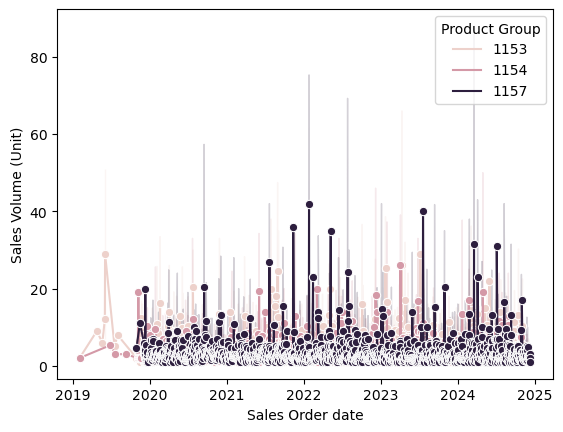

In [22]:
sns.lineplot(data=data, x='Sales Order date', y='Sales Volume (Unit)', hue='Product Group', marker='o')

<Axes: xlabel='Product Name', ylabel='Sales Volume (Unit)'>

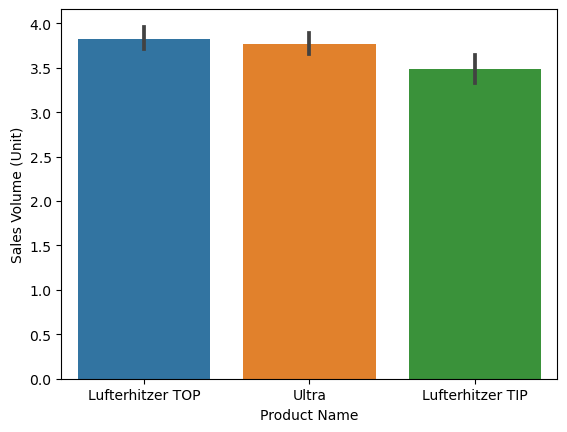

In [279]:
sns.barplot(data = data, x= 'Product Name', y = 'Sales Volume (Unit)')

<Axes: xlabel='Product Name', ylabel='Net Sales (EURO)'>

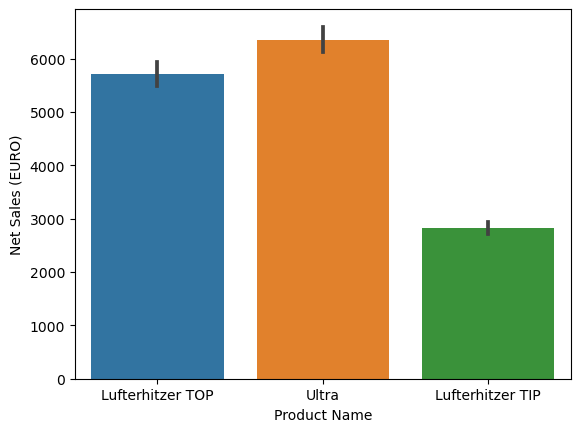

In [281]:
sns.barplot(data = data, x= 'Product Name', y = 'Net Sales (EURO)')

<Axes: xlabel='Sales Volume (Unit)', ylabel='Country_buyer'>

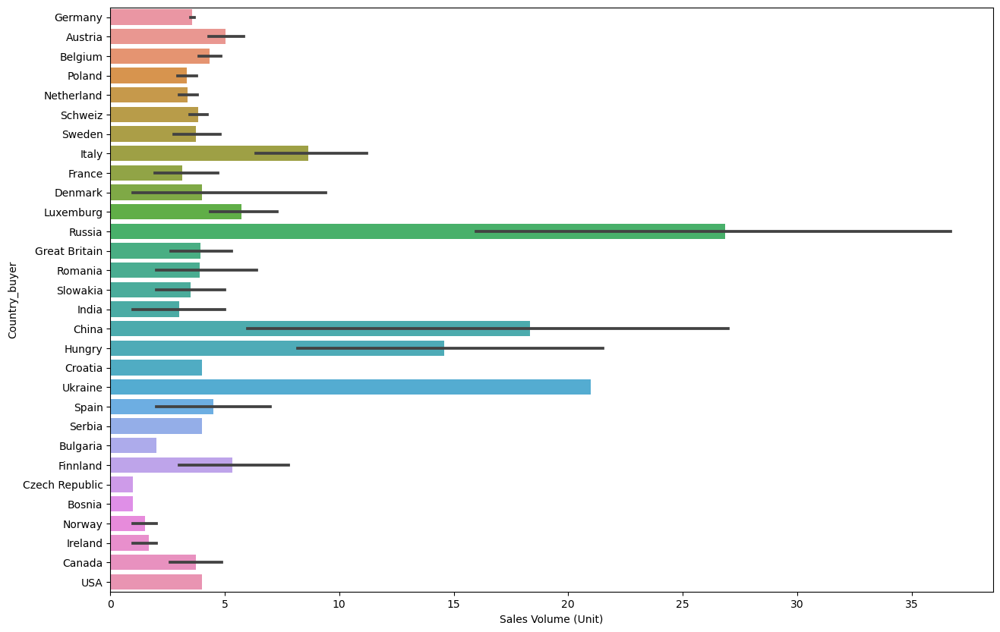

In [283]:
#  Examining the average price trends across regions.
plt.figure(figsize = [15, 10])
sns.barplot(data = data, x = 'Sales Volume (Unit)', y = 'Country_buyer')

In [285]:
categorical_col = [] #Initializes an empty list to store the names of columns that are identified as categorical.
for column in data.columns: #Iterates through each column in the DataFrame.
    #if data[column].dtype==object and 
    if len(data[column].unique()) <= 15:#Checks if the column's data type is 'object' (typically indicating a categorical variable) and if the number of unique values in that column is 30 or less.
        categorical_col.append(column) # If the conditions in the if statement are met, it appends the column name to the categorical_clist.
        print(f"{column} : {data[column].unique()}") #Prints the name of the column and its unique values.
        print("====================================") # Prints a separator line for clarity.

Product Group : [1153 1154 1157]
Product Name : ['Lufterhitzer TOP' 'Ultra' 'Lufterhitzer TIP']


In [287]:
categorical_col

['Product Group', 'Product Name']

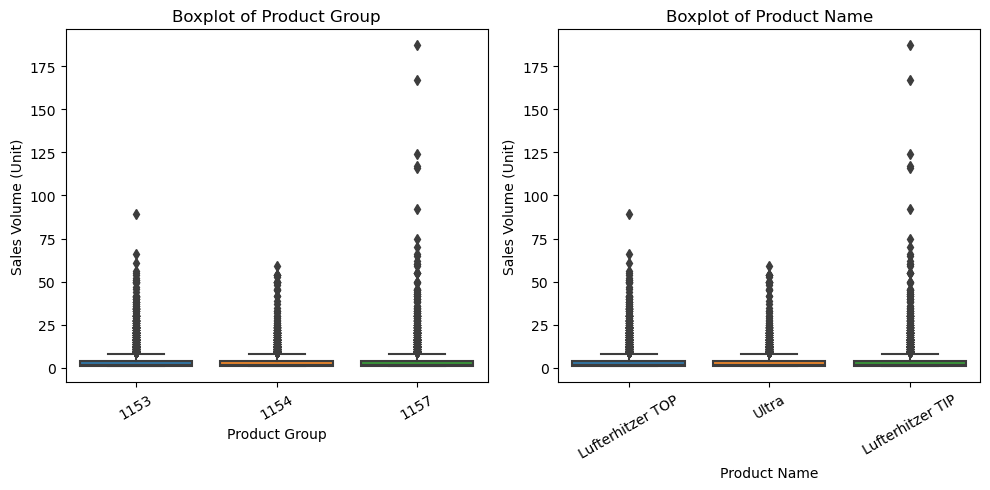

In [289]:
plt.figure(figsize=[10,18])

features = ['Product Group', 'Product Name']

n=1
for f in features: 
    plt.subplot(4,2,n) 
        
    sns.boxplot(x=f,y= 'Sales Volume (Unit)', data=data)
    
    plt.title('Boxplot of {}'.format(f))

    
    n= n+1 
    plt.xticks(rotation=30)

plt.tight_layout() 

plt.show()

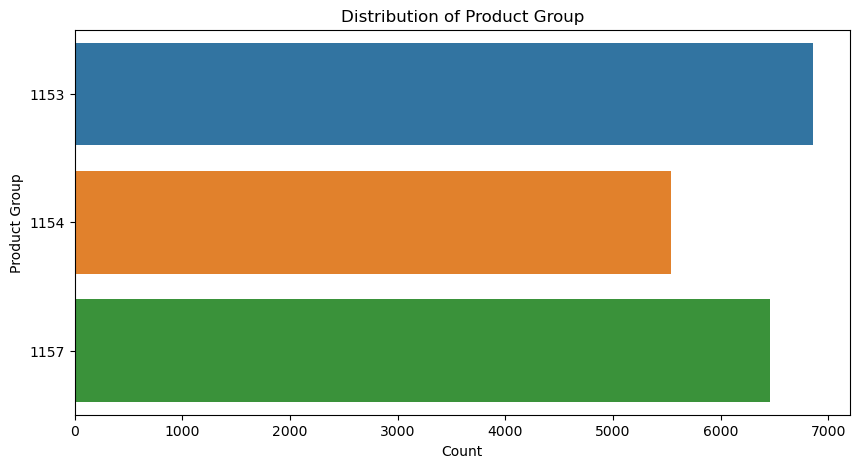

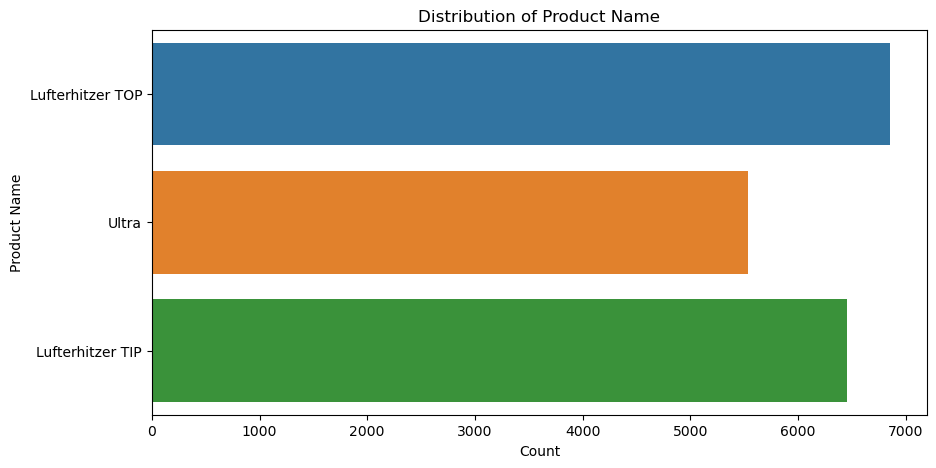

In [291]:
# List of categorical columns
categorical_cols = ['Product Group', 'Product Name']

# Plotting countplot for each specified categorical column
for col in categorical_cols:
    plt.figure(figsize=(10, 5))
    sns.countplot(y=col, data=data)
    plt.title(f'Distribution of {col}')
    plt.xlabel('Count')
    plt.ylabel(col)
    plt.show()

In [293]:
# Converting to datetime from object
data['Invoice Date']= pd.to_datetime(data['Invoice Date'])
data['Invoice Date']

0       2020-01-02
1       2020-02-01
2       2020-02-01
3       2020-02-01
4       2020-02-01
           ...    
18840   2024-12-18
18841   2024-12-18
18842   2024-12-18
18843   2024-12-19
18844   2024-12-20
Name: Invoice Date, Length: 18845, dtype: datetime64[ns]

In [295]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18845 entries, 0 to 18844
Data columns (total 15 columns):
 #   Column                                     Non-Null Count  Dtype         
---  ------                                     --------------  -----         
 0   Sales Order date                           18845 non-null  datetime64[ns]
 1   Date of creation of customer order in SAP  18845 non-null  datetime64[ns]
 2   Sales Volume (Unit)                        18845 non-null  int64         
 3   Net Sales (EURO)                           18845 non-null  float64       
 4   Invoice Date                               18845 non-null  datetime64[ns]
 5   Sales document number                      18845 non-null  int64         
 6   Product Group                              18845 non-null  int64         
 7   Product Name                               18845 non-null  object        
 8   Costumer Number                            18845 non-null  int64         
 9   Sold to Costumer 

In [297]:
data.describe()

,Sales Order date,Date of creation of customer order in SAP,Sales Volume (Unit),Net Sales (EURO),Invoice Date,Sales document number,Product Group,Costumer Number
count,18845,18845,18845.000000,18845.000000,18845,1.884500e+04,18845.000000,1.884500e+04
mean,2022-05-08 11:55:22.621385216,2022-05-09 14:27:58.408066048,3.694083,4913.874220,2022-06-02 23:41:35.070310656,2.040236e+07,1154.663837,1.045023e+06
min,2019-02-02 00:00:00,2019-04-25 00:00:00,1.000000,0.000000,2020-01-02 00:00:00,2.032016e+07,1153.000000,1.002058e+06
25%,2021-02-09 00:00:00,2021-02-10 00:00:00,1.000000,1166.550000,2021-02-25 00:00:00,2.036998e+07,1153.000000,1.013354e+06
50%,2022-03-28 00:00:00,2022-03-29 00:00:00,2.000000,2243.880000,2022-05-10 00:00:00,2.040249e+07,1154.000000,1.013451e+06
75%,2023-08-09 00:00:00,2023-08-10 00:00:00,4.000000,5341.340000,2023-09-02 00:00:00,2.043464e+07,1157.000000,1.019321e+06
max,2024-12-12 00:00:00,2024-12-12 00:00:00,187.000000,160111.690000,2024-12-20 00:00:00,2.046811e+07,1157.000000,1.269878e+06
std,NaN,NaN,5.608123,8070.219471,NaN,3.754941e+04,1.733787,6.721912e+04


In [299]:
data['Product Group'].value_counts()

Product Group
1153    6855
1157    6455
1154    5535
Name: count, dtype: int64

In [301]:
data['Product Name'].value_counts()

Product Name
Lufterhitzer TOP    6855
Lufterhitzer TIP    6455
Ultra               5535
Name: count, dtype: int64

In [303]:
# Extracting Year from Sales_Order_date
data['Sales_Order_date_Year'] = data['Sales Order date'].dt.year
data['Sales_Order_date_Year']

0        2019
1        2019
2        2019
3        2019
4        2019
         ... 
18840    2024
18841    2024
18842    2024
18843    2024
18844    2024
Name: Sales_Order_date_Year, Length: 18845, dtype: int32

In [305]:
data['Sales_Order_date_Year'].value_counts()

Sales_Order_date_Year
2021    4253
2020    3998
2022    3733
2023    3340
2024    3321
2019     200
Name: count, dtype: int64

In [307]:
# Extracting Year from Date of creation of customer order in SAP
data['Date of creation of customer order in SAP_Year'] = data['Date of creation of customer order in SAP'].dt.year
data['Date of creation of customer order in SAP_Year']

0        2019
1        2019
2        2019
3        2019
4        2019
         ... 
18840    2024
18841    2024
18842    2024
18843    2024
18844    2024
Name: Date of creation of customer order in SAP_Year, Length: 18845, dtype: int32

In [309]:
data['Date of creation of customer order in SAP_Year'].value_counts()

Date of creation of customer order in SAP_Year
2021    4253
2020    3992
2022    3724
2023    3346
2024    3345
2019     185
Name: count, dtype: int64

In [311]:
# Extracting Month from Sales_Order_date
data['Sales_Order_date_Month'] = data['Sales Order date'].dt.month
data['Sales_Order_date_Month']

0        11
1        11
2        11
3        11
4        12
         ..
18840    12
18841    12
18842    12
18843    11
18844     5
Name: Sales_Order_date_Month, Length: 18845, dtype: int32

In [313]:
# Extracting Month from Date of creation of customer order in SAP
data['Date of creation of customer order in SAP_Month'] = data['Date of creation of customer order in SAP'].dt.month
data['Date of creation of customer order in SAP_Month']

0        11
1        11
2        11
3        11
4        12
         ..
18840    12
18841    12
18842    12
18843    11
18844     5
Name: Date of creation of customer order in SAP_Month, Length: 18845, dtype: int32

In [315]:
data['Sales_Order_date_Month'].value_counts()

Sales_Order_date_Month
11    1868
1     1856
10    1845
9     1766
2     1755
3     1589
12    1497
7     1468
6     1404
8     1367
5     1237
4     1193
Name: count, dtype: int64

In [317]:
data['Date of creation of customer order in SAP_Month'].value_counts()

Date of creation of customer order in SAP_Month
1     1905
11    1884
10    1852
2     1753
9     1735
3     1583
7     1473
12    1442
8     1388
6     1386
5     1228
4     1216
Name: count, dtype: int64

In [319]:
# Extracting Day from Sales_Order_date_Day
data['Sales_Order_date_Day'] = data['Sales Order date'].dt.day
data['Sales_Order_date_Day']

0        13
1        19
2        27
3        28
4         5
         ..
18840     6
18841    10
18842    10
18843    22
18844     6
Name: Sales_Order_date_Day, Length: 18845, dtype: int32

In [321]:
data['Invoice Date_Month'] = data['Invoice Date'].dt.month
data['Invoice Date_Month']

0         1
1         2
2         2
3         2
4         2
         ..
18840    12
18841    12
18842    12
18843    12
18844    12
Name: Invoice Date_Month, Length: 18845, dtype: int32

In [323]:
data['Invoice Date_Year'] = data['Invoice Date'].dt.year
data['Invoice Date_Year']

0        2020
1        2020
2        2020
3        2020
4        2020
         ... 
18840    2024
18841    2024
18842    2024
18843    2024
18844    2024
Name: Invoice Date_Year, Length: 18845, dtype: int32

In [325]:
data['Invoice Date_Year'].value_counts()

Invoice Date_Year
2021    4049
2020    3942
2022    3906
2024    3577
2023    3371
Name: count, dtype: int64

In [327]:
data['Invoice Date_Month'].value_counts()

Invoice Date_Month
11    1949
1     1862
9     1779
2     1749
10    1725
7     1528
4     1467
8     1452
3     1414
5     1355
6     1346
12    1219
Name: count, dtype: int64

### Summary of the dataset

In [330]:

data.describe().T

,count,mean,min,25%,50%,75%,max,std
Sales Order date,18845,2022-05-08 11:55:22.621385216,2019-02-02 00:00:00,2021-02-09 00:00:00,2022-03-28 00:00:00,2023-08-09 00:00:00,2024-12-12 00:00:00,NaN
Date of creation of customer order in SAP,18845,2022-05-09 14:27:58.408066048,2019-04-25 00:00:00,2021-02-10 00:00:00,2022-03-29 00:00:00,2023-08-10 00:00:00,2024-12-12 00:00:00,NaN
Sales Volume (Unit),18845.0,3.694083,1.0,1.0,2.0,4.0,187.0,5.608123
Net Sales (EURO),18845.0,4913.87422,0.0,1166.55,2243.88,5341.34,160111.69,8070.219471
Invoice Date,18845,2022-06-02 23:41:35.070310656,2020-01-02 00:00:00,2021-02-25 00:00:00,2022-05-10 00:00:00,2023-09-02 00:00:00,2024-12-20 00:00:00,NaN
Sales document number,18845.0,20402355.822818,20320157.0,20369984.0,20402486.0,20434635.0,20468107.0,37549.409147
Product Group,18845.0,1154.663837,1153.0,1153.0,1154.0,1157.0,1157.0,1.733787
Costumer Number,18845.0,1045023.446697,1002058.0,1013354.0,1013451.0,1019321.0,1269878.0,67219.119547
Sales_Order_date_Year,18845.0,2021.847864,2019.0,2021.0,2022.0,2023.0,2024.0,1.424399
Date of creation of customer order in SAP_Year,18845.0,2021.853754,2019.0,2021.0,2022.0,2023.0,2024.0,1.423954


In [332]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18845 entries, 0 to 18844
Data columns (total 22 columns):
 #   Column                                           Non-Null Count  Dtype         
---  ------                                           --------------  -----         
 0   Sales Order date                                 18845 non-null  datetime64[ns]
 1   Date of creation of customer order in SAP        18845 non-null  datetime64[ns]
 2   Sales Volume (Unit)                              18845 non-null  int64         
 3   Net Sales (EURO)                                 18845 non-null  float64       
 4   Invoice Date                                     18845 non-null  datetime64[ns]
 5   Sales document number                            18845 non-null  int64         
 6   Product Group                                    18845 non-null  int64         
 7   Product Name                                     18845 non-null  object        
 8   Costumer Number                     

### Number of unique values in each column

In [335]:
data.nunique()

Sales Order date                                    1341
Date of creation of customer order in SAP           1301
Sales Volume (Unit)                                   71
Net Sales (EURO)                                   14171
Invoice Date                                        1226
Sales document number                              17746
Product Group                                          3
Product Name                                           3
Costumer Number                                     1796
Sold to Costumer                                    1392
City_buyer                                          1131
Country_buyer                                         30
Ship to Party                                       2898
City_delivery                                       2007
Country_delivery                                      31
Sales_Order_date_Year                                  6
Date of creation of customer order in SAP_Year         6
Sales_Order_date_Month         

In [337]:
data.duplicated()

0        False
1        False
2        False
3        False
4        False
         ...  
18840    False
18841    False
18842    False
18843    False
18844    False
Length: 18845, dtype: bool

In [339]:
data.columns

Index(['Sales Order date', 'Date of creation of customer order in SAP',
       'Sales Volume (Unit)', 'Net Sales (EURO)', 'Invoice Date',
       'Sales document number', 'Product Group', 'Product Name',
       'Costumer Number', 'Sold to Costumer', 'City_buyer', 'Country_buyer',
       'Ship to Party', 'City_delivery', 'Country_delivery',
       'Sales_Order_date_Year',
       'Date of creation of customer order in SAP_Year',
       'Sales_Order_date_Month',
       'Date of creation of customer order in SAP_Month',
       'Sales_Order_date_Day', 'Invoice Date_Month', 'Invoice Date_Year'],
      dtype='object')

In [341]:
data.shape

(18845, 22)

In [343]:
data[data['Country_buyer'] == data['Country_delivery']]

,Sales Order date,Date of creation of customer order in SAP,Sales Volume (Unit),Net Sales (EURO),Invoice Date,Sales document number,Product Group,Product Name,Costumer Number,Sold to Costumer,...,Ship to Party,City_delivery,Country_delivery,Sales_Order_date_Year,Date of creation of customer order in SAP_Year,Sales_Order_date_Month,Date of creation of customer order in SAP_Month,Sales_Order_date_Day,Invoice Date_Month,Invoice Date_Year
0,2019-11-13,2019-11-13,6,9319.61,2020-01-02,20335046,1153,Lufterhitzer TOP,1013803,WILHELM JANSEN - EISENJANSEN,...,WILHELM JANSEN - EISENJANSEN,Geilenkirchen,Germany,2019,2019,11,11,13,1,2020
1,2019-11-19,2019-11-20,8,9432.25,2020-02-01,20335706,1153,Lufterhitzer TOP,1013372,SÃ„CHSISCHE HAUSTECHNIK EDKI KG,...,SÃ„CHSISCHE HAUSTECHNIK EDKI KG,Hartenstein,Germany,2019,2019,11,11,19,2,2020
2,2019-11-27,2019-11-27,4,4202.38,2020-02-01,20336430,1153,Lufterhitzer TOP,1013235,RICHTER + FRENZEL,...,MIEBACH HAUSTECHNIK GMBH,Overath,Germany,2019,2019,11,11,27,2,2020
3,2019-11-28,2019-11-28,3,2250.26,2020-02-01,20336544,1153,Lufterhitzer TOP,1013330,CORDES & GRAEFE BREMEN KG,...,CORDES & GRAEFE BREMEN KG,Stuhr,Germany,2019,2019,11,11,28,2,2020
4,2019-12-05,2019-12-06,1,1525.12,2020-02-01,20337215,1153,Lufterhitzer TOP,1013136,WIEDEMANN INDUSTRIE UND HAUSTECHNIK,...,WIEDEMANN INDUSTRIE UND HAUSTECHNIK,Burg,Germany,2019,2019,12,12,5,2,2020
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
18840,2024-12-06,2024-12-09,3,2796.42,2024-12-18,20467775,1157,Lufterhitzer TIP,1013380,BLANK & SEEGERS KG,...,WKS WÃ„RME-KLIMA-SANITÃ„R GMBH,Weimar,Germany,2024,2024,12,12,6,12,2024
18841,2024-12-10,2024-12-10,5,6450.89,2024-12-18,20467929,1153,Lufterhitzer TOP,1013442,RICHTER + FRENZEL,...,RICHTER + FRENZEL GMBH & CO. KG,Aschaffenburg,Germany,2024,2024,12,12,10,12,2024
18842,2024-12-10,2024-12-11,1,1933.30,2024-12-18,20467965,1153,Lufterhitzer TOP,1013263,ARNOLD LAMMERING GMBH,...,ARNOLD LAMMERING GMBH,SchÃ¼ttorf,Germany,2024,2024,12,12,10,12,2024
18843,2024-11-22,2024-11-25,5,18205.41,2024-12-19,20466588,1153,Lufterhitzer TOP,1265918,"""MRÃ“Z"" ZAKRZEWSKI SP. J.",...,"""MRÃ“Z"" ZAKRZEWSKI SP. J.",ÅÃ³dÅº,Poland,2024,2024,11,11,22,12,2024


Country_buyer and Country_delivery has almost similar value. Out of total 18845 rows, Country_buyer and Country_delivery values are same for 18840 rows. So we can delete any 1 cloumn.

In [346]:
data[data['City_buyer'] == data['City_delivery']]

,Sales Order date,Date of creation of customer order in SAP,Sales Volume (Unit),Net Sales (EURO),Invoice Date,Sales document number,Product Group,Product Name,Costumer Number,Sold to Costumer,...,Ship to Party,City_delivery,Country_delivery,Sales_Order_date_Year,Date of creation of customer order in SAP_Year,Sales_Order_date_Month,Date of creation of customer order in SAP_Month,Sales_Order_date_Day,Invoice Date_Month,Invoice Date_Year
0,2019-11-13,2019-11-13,6,9319.61,2020-01-02,20335046,1153,Lufterhitzer TOP,1013803,WILHELM JANSEN - EISENJANSEN,...,WILHELM JANSEN - EISENJANSEN,Geilenkirchen,Germany,2019,2019,11,11,13,1,2020
1,2019-11-19,2019-11-20,8,9432.25,2020-02-01,20335706,1153,Lufterhitzer TOP,1013372,SÃ„CHSISCHE HAUSTECHNIK EDKI KG,...,SÃ„CHSISCHE HAUSTECHNIK EDKI KG,Hartenstein,Germany,2019,2019,11,11,19,2,2020
3,2019-11-28,2019-11-28,3,2250.26,2020-02-01,20336544,1153,Lufterhitzer TOP,1013330,CORDES & GRAEFE BREMEN KG,...,CORDES & GRAEFE BREMEN KG,Stuhr,Germany,2019,2019,11,11,28,2,2020
4,2019-12-05,2019-12-06,1,1525.12,2020-02-01,20337215,1153,Lufterhitzer TOP,1013136,WIEDEMANN INDUSTRIE UND HAUSTECHNIK,...,WIEDEMANN INDUSTRIE UND HAUSTECHNIK,Burg,Germany,2019,2019,12,12,5,2,2020
6,2019-12-06,2019-12-06,3,3537.09,2020-02-01,20337254,1154,Ultra,1013372,SÃ„CHSISCHE HAUSTECHNIK EDKI KG,...,SÃ„CHSISCHE HAUSTECHNIK EDKI KG,Hartenstein,Germany,2019,2019,12,12,6,2,2020
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
18839,2024-11-25,2024-11-26,5,9121.98,2024-12-18,20466667,1154,Ultra,1013430,RICHTER + FRENZEL,...,RICHTER + FRENZEL,Petersberg,Germany,2024,2024,11,11,25,12,2024
18841,2024-12-10,2024-12-10,5,6450.89,2024-12-18,20467929,1153,Lufterhitzer TOP,1013442,RICHTER + FRENZEL,...,RICHTER + FRENZEL GMBH & CO. KG,Aschaffenburg,Germany,2024,2024,12,12,10,12,2024
18842,2024-12-10,2024-12-11,1,1933.30,2024-12-18,20467965,1153,Lufterhitzer TOP,1013263,ARNOLD LAMMERING GMBH,...,ARNOLD LAMMERING GMBH,SchÃ¼ttorf,Germany,2024,2024,12,12,10,12,2024
18843,2024-11-22,2024-11-25,5,18205.41,2024-12-19,20466588,1153,Lufterhitzer TOP,1265918,"""MRÃ“Z"" ZAKRZEWSKI SP. J.",...,"""MRÃ“Z"" ZAKRZEWSKI SP. J.",ÅÃ³dÅº,Poland,2024,2024,11,11,22,12,2024


City_buyer and City_delivery have 14335 same values. So we can delete any one column

In [349]:
city_sales = data.groupby('City_buyer')['Sales Volume (Unit)'].mean().reset_index()
city_sales

,City_buyer,Sales Volume (Unit)
0,Aachen,13.833333
1,Aadorf,3.000000
2,Aalen,3.266667
3,Aarburg,3.100000
4,Abenberg,11.000000
...,...,...
1126,ÅÄ™czyca,1.600000
1127,Å»ory,2.000000
1128,Åšroda Wielkopolska,3.000000
1129,Åšroda Wlkp.,4.000000


In [351]:
city_count1 = data.groupby('City_buyer')['Sales Volume (Unit)'].sum().sort_values(ascending=False).reset_index()
city_count1

,City_buyer,Sales Volume (Unit)
0,Reichertshofen,1441
1,Wels,1374
2,Berlin,1353
3,Ahaus,955
4,Erfurt,839
...,...,...
1126,Birmenstorf,1
1127,SchÃ¶nenwerd,1
1128,Endingen,1
1129,Neumarkt,1


In [353]:
city_count = data.groupby('City_buyer')['Sales Volume (Unit)'].sum().sort_values(ascending=False).head(20).reset_index()
city_count

,City_buyer,Sales Volume (Unit)
0,Reichertshofen,1441
1,Wels,1374
2,Berlin,1353
3,Ahaus,955
4,Erfurt,839
5,Grammetal,833
6,Duisburg,826
7,Stuhr,722
8,Hamburg,702
9,OsnabrÃ¼ck,694


(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17, 18, 19]),
 [Text(0, 0, 'Reichertshofen'),
  Text(1, 0, 'Wels'),
  Text(2, 0, 'Berlin'),
  Text(3, 0, 'Ahaus'),
  Text(4, 0, 'Erfurt'),
  Text(5, 0, 'Grammetal'),
  Text(6, 0, 'Duisburg'),
  Text(7, 0, 'Stuhr'),
  Text(8, 0, 'Hamburg'),
  Text(9, 0, 'OsnabrÃ¼ck'),
  Text(10, 0, 'Klipphausen'),
  Text(11, 0, 'Didam'),
  Text(12, 0, 'Mannheim'),
  Text(13, 0, 'NÃ¼rnberg'),
  Text(14, 0, 'GÃ¼tersloh'),
  Text(15, 0, 'BarsbÃ¼ttel'),
  Text(16, 0, 'Merzig'),
  Text(17, 0, 'Perchtoldsdorf'),
  Text(18, 0, 'Kiel'),
  Text(19, 0, 'Rotenburg')])

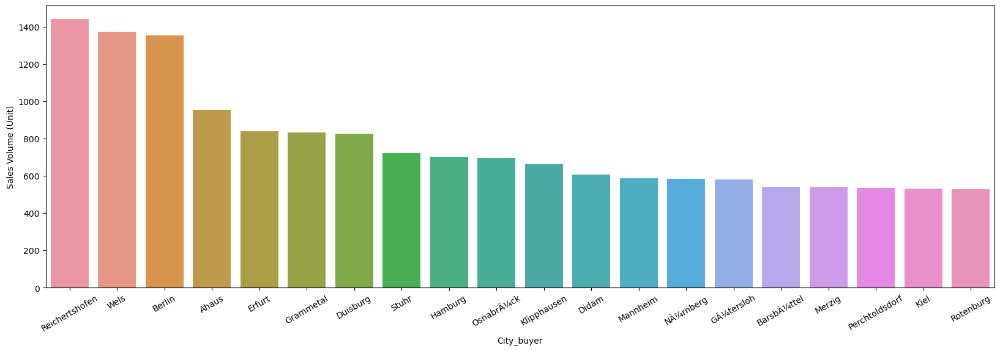

In [355]:
plt.figure(figsize=(20,6))
sns.barplot(x='City_buyer', y='Sales Volume (Unit)', data=city_count)
plt.xticks(rotation=30)

## <a name='link2'>Exploratory Data Analysis (EDA) Summary</a>

In [358]:
def histogram_boxplot(data, feature, figsize=(15, 10), kde=False, bins=None):
    """
    Boxplot and histogram combined

    data: dataframe
    feature: dataframe column
    figsize: size of figure (default (15,10))
    kde: whether to show the density curve (default False)
    bins: number of bins for histogram (default None)
    """
    f2, (ax_box2, ax_hist2) = plt.subplots(
        nrows=2,  # Number of rows of the subplot grid= 2
        sharex=True,  # x-axis will be shared among all subplots
        gridspec_kw={"height_ratios": (0.25, 0.75)},
        figsize=figsize,
    )  # creating the 2 subplots
    sns.boxplot(
        data=data, x=feature, ax=ax_box2, showmeans=True, color="violet"
    )  # boxplot will be created and a triangle will indicate the mean value of the column
    sns.histplot(
        data=data, x=feature, kde=kde, ax=ax_hist2, bins=bins
    ) if bins else sns.histplot(
        data=data, x=feature, kde=kde, ax=ax_hist2
    )  # For histogram
    ax_hist2.axvline(
        data[feature].mean(), color="green", linestyle="--"
    )  # Add mean to the histogram
    ax_hist2.axvline(
        data[feature].median(), color="black", linestyle="-"
    )  # Add median to the histogram

### Univariate analysis

In [361]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18845 entries, 0 to 18844
Data columns (total 22 columns):
 #   Column                                           Non-Null Count  Dtype         
---  ------                                           --------------  -----         
 0   Sales Order date                                 18845 non-null  datetime64[ns]
 1   Date of creation of customer order in SAP        18845 non-null  datetime64[ns]
 2   Sales Volume (Unit)                              18845 non-null  int64         
 3   Net Sales (EURO)                                 18845 non-null  float64       
 4   Invoice Date                                     18845 non-null  datetime64[ns]
 5   Sales document number                            18845 non-null  int64         
 6   Product Group                                    18845 non-null  int64         
 7   Product Name                                     18845 non-null  object        
 8   Costumer Number                     

In [363]:
num_cols = data.select_dtypes(exclude = ['object', 'timedelta64[ns]']).columns
data[num_cols] = data[num_cols].apply(pd.to_numeric, errors='coerce')

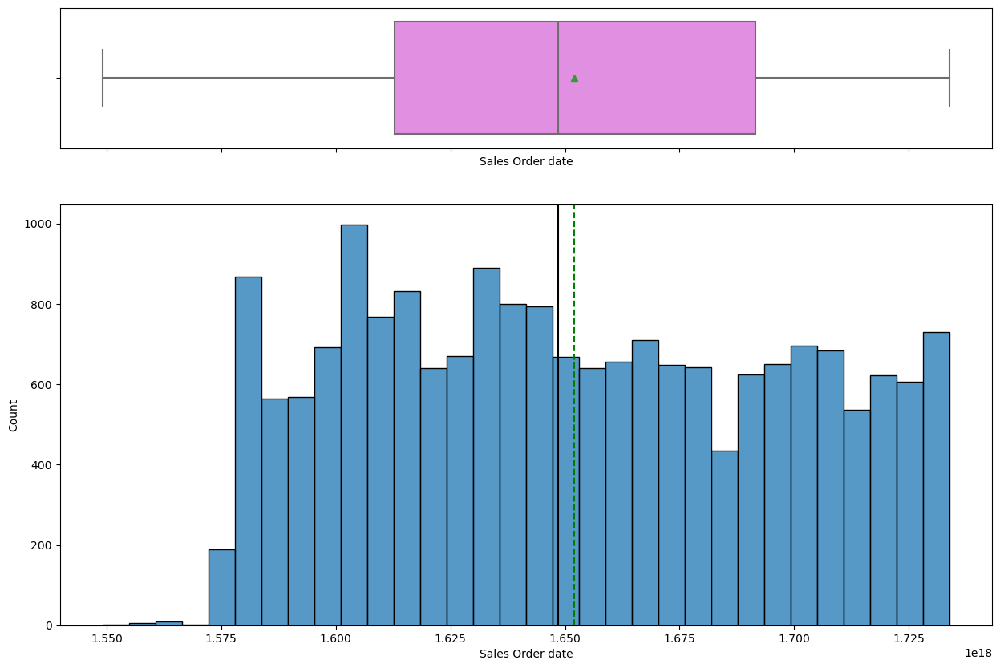

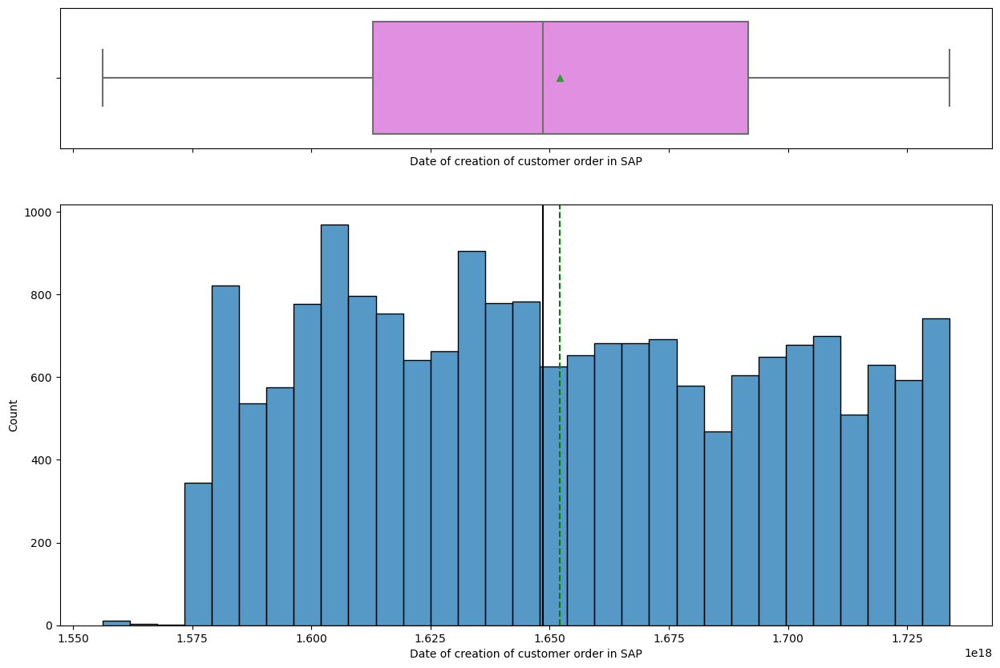

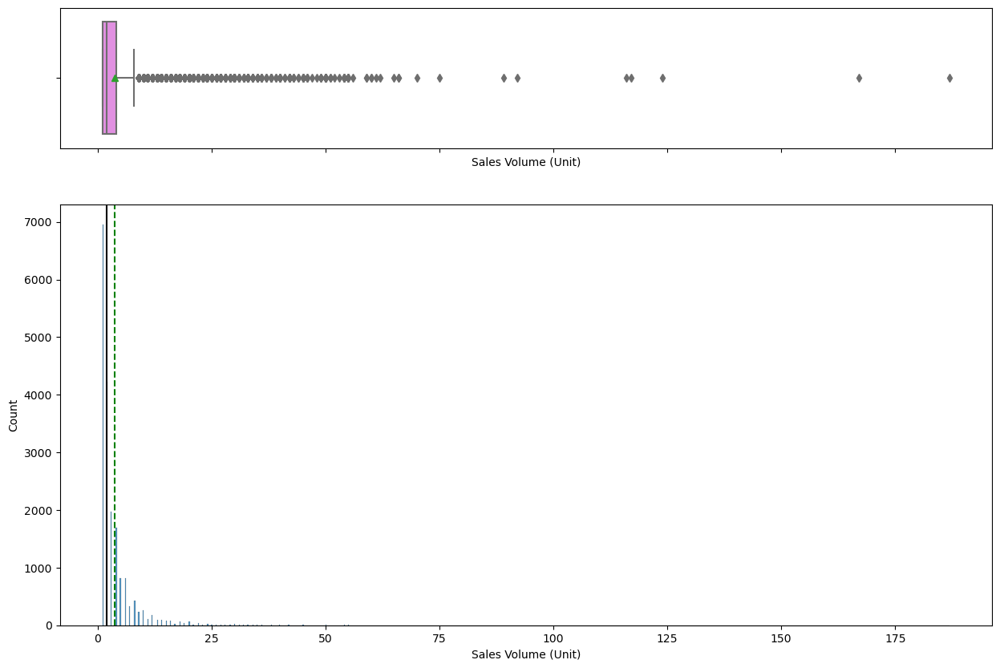

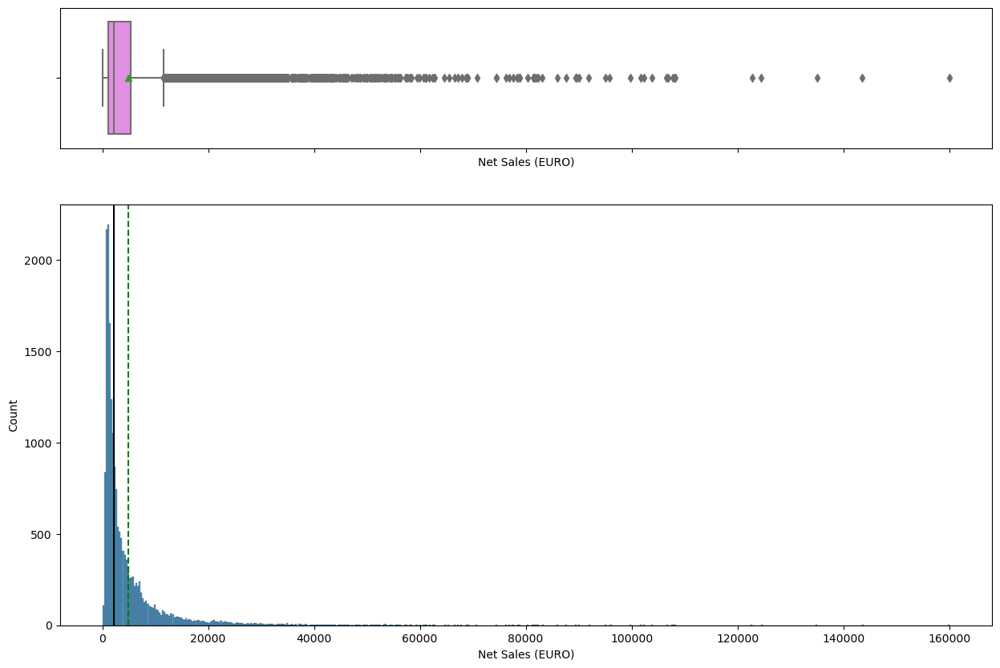

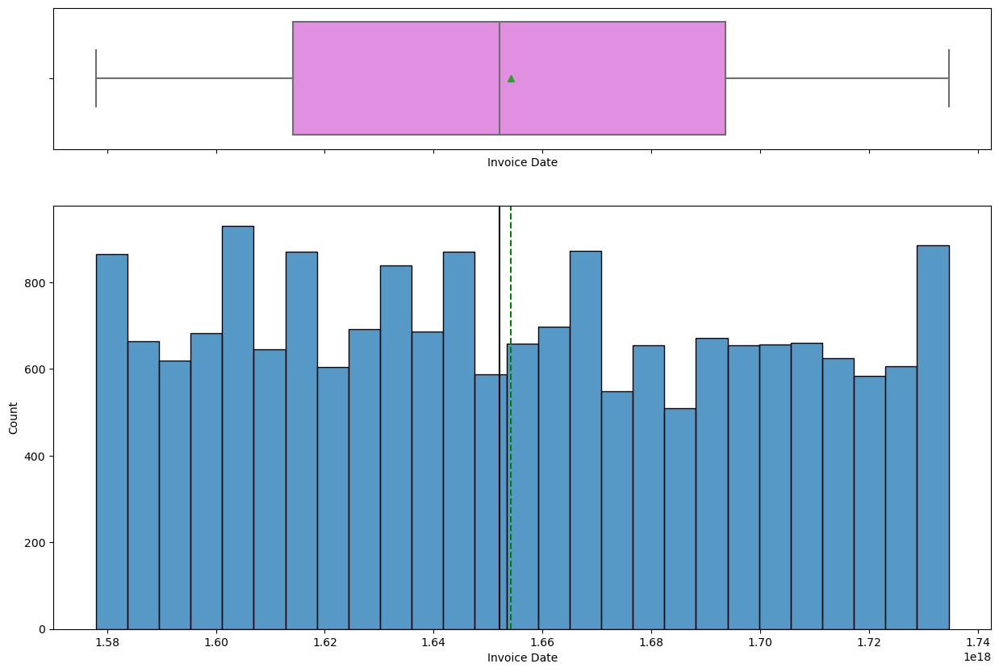

...

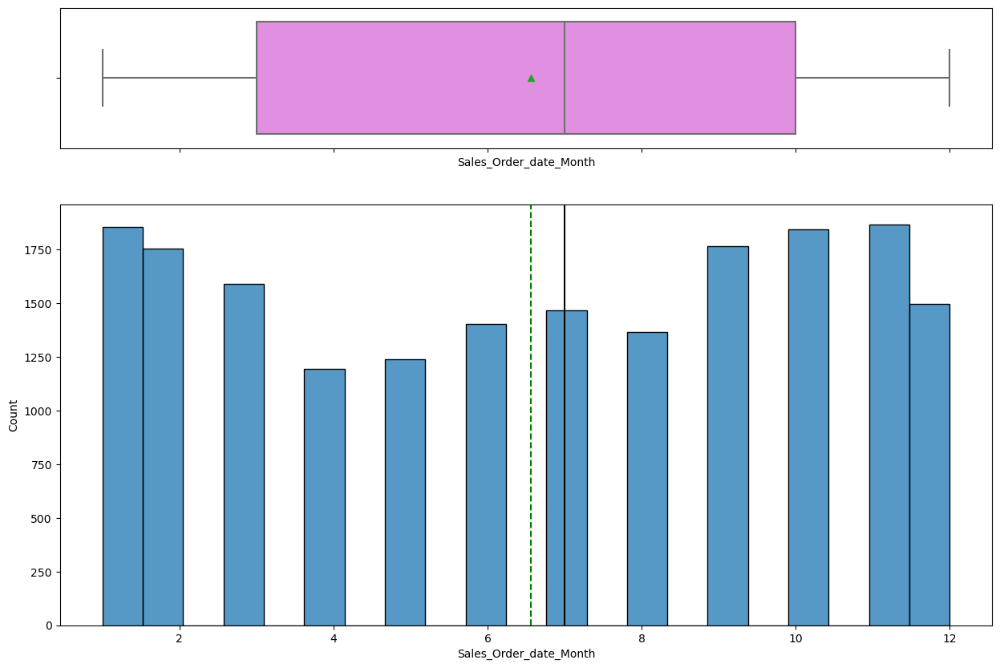

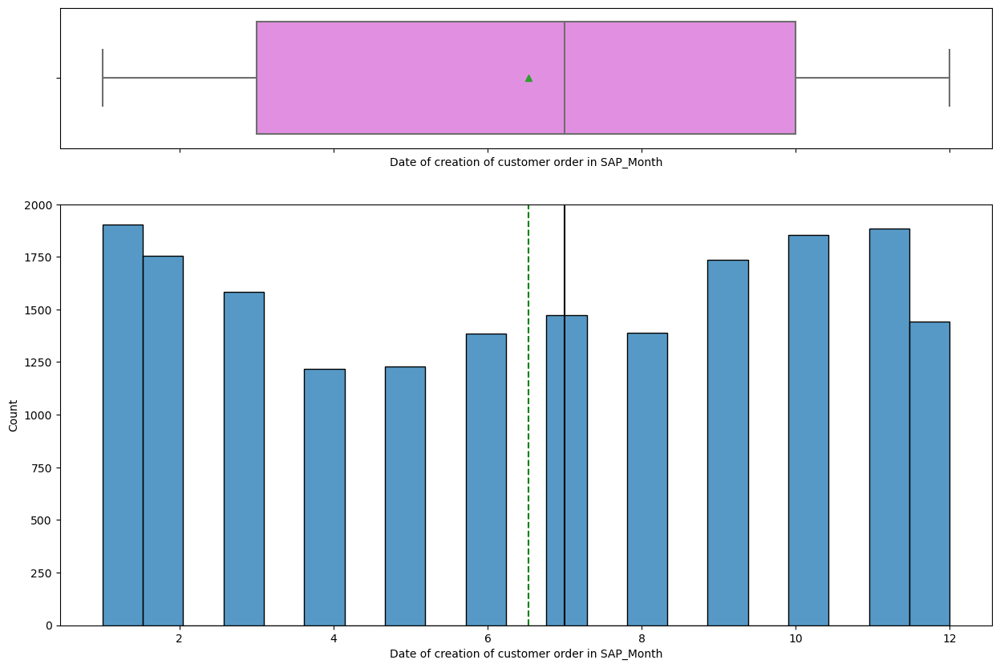

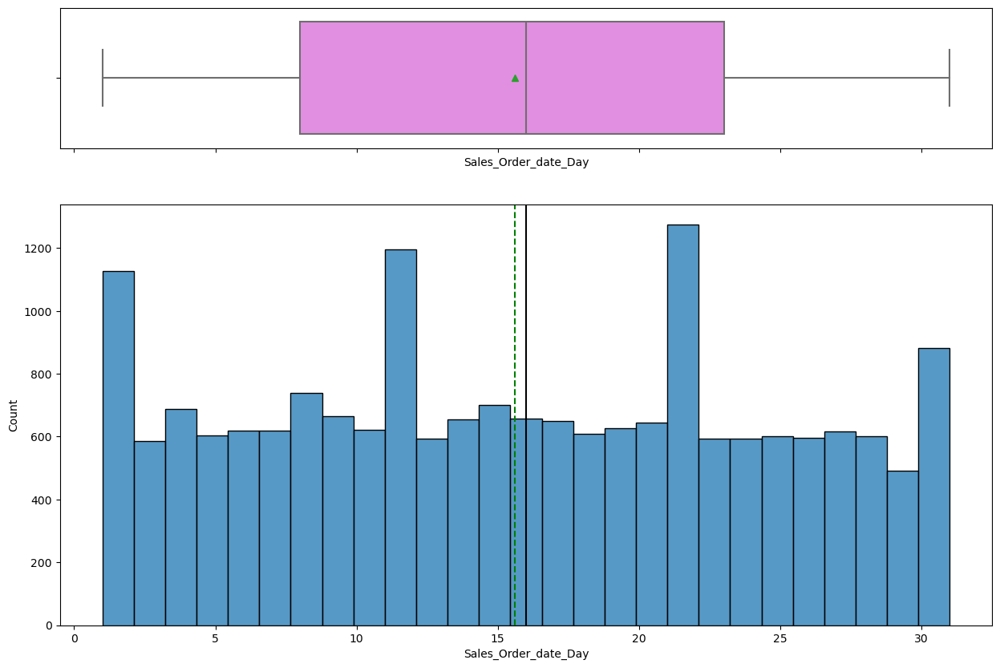

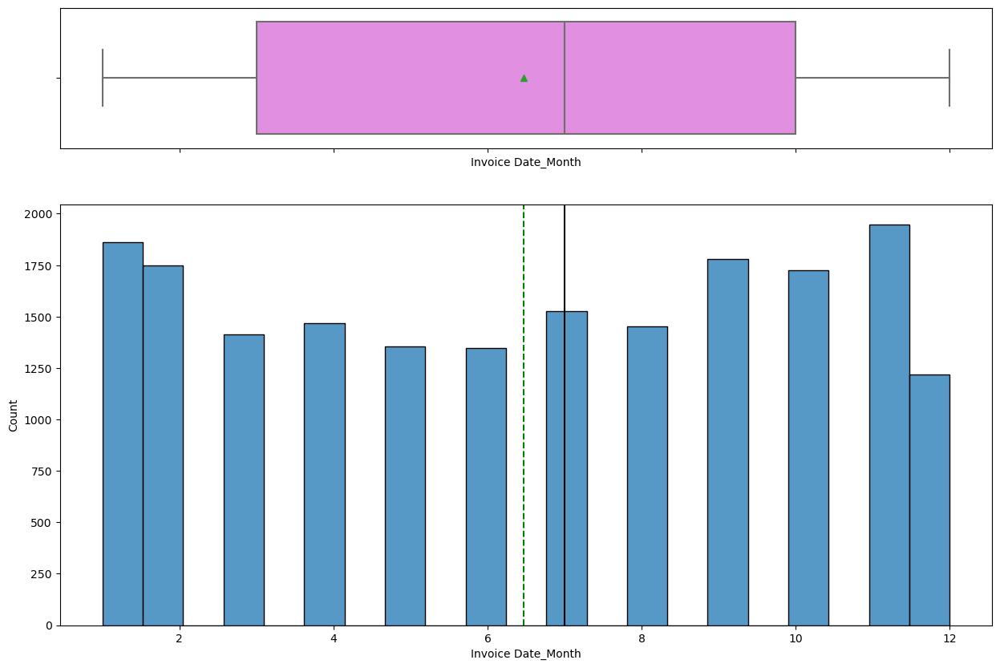

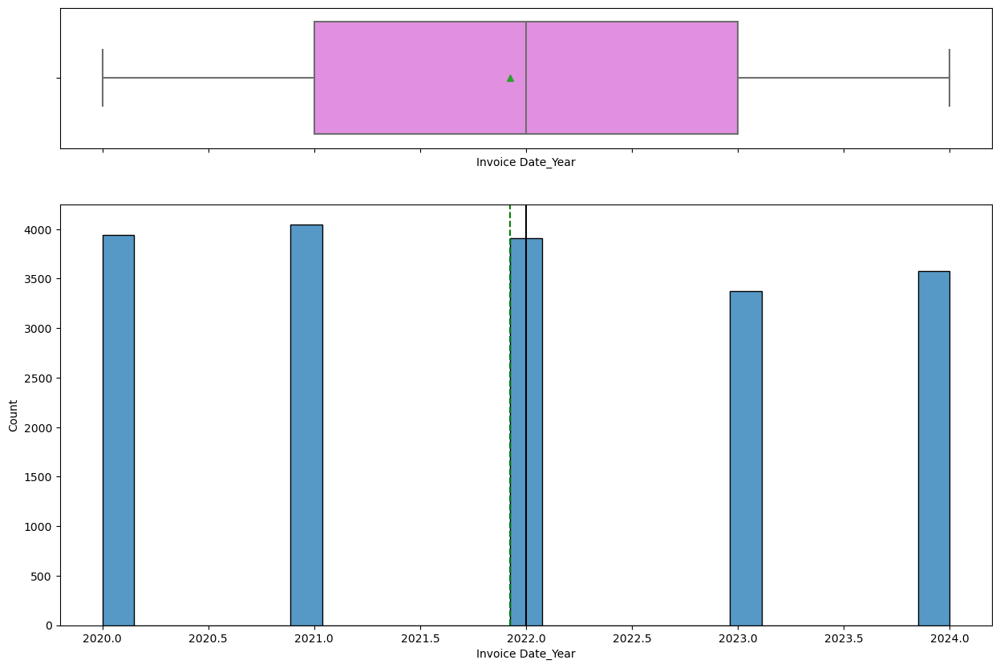

In [62]:
for i in num_cols:
  histogram_boxplot(data, i)


Sales Vloume and Net Sales have lots of outliers

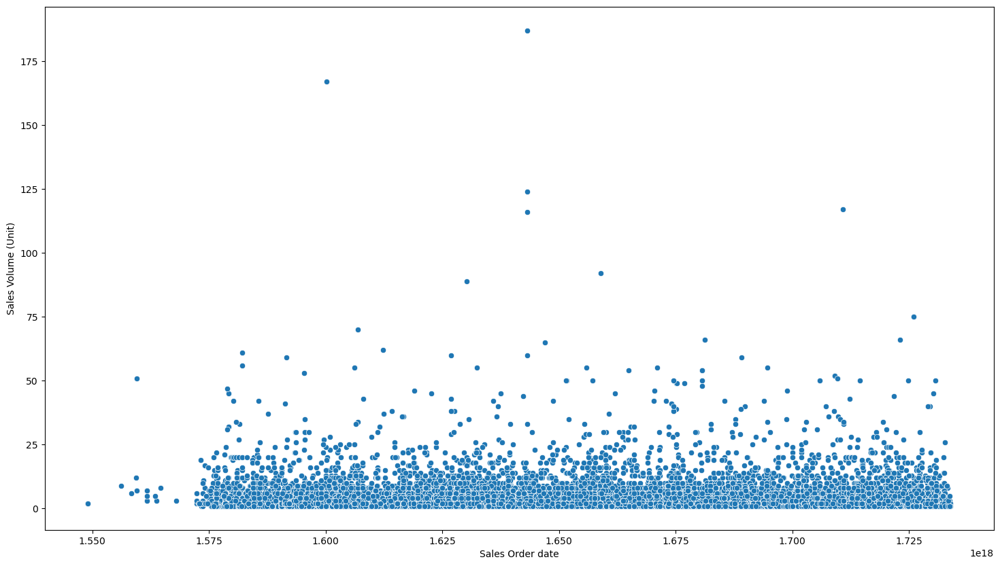

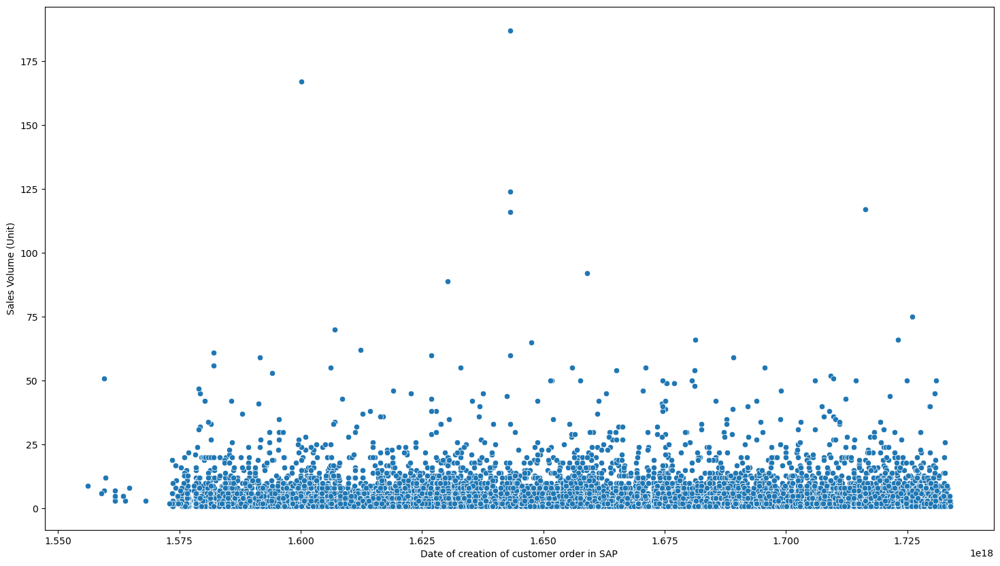

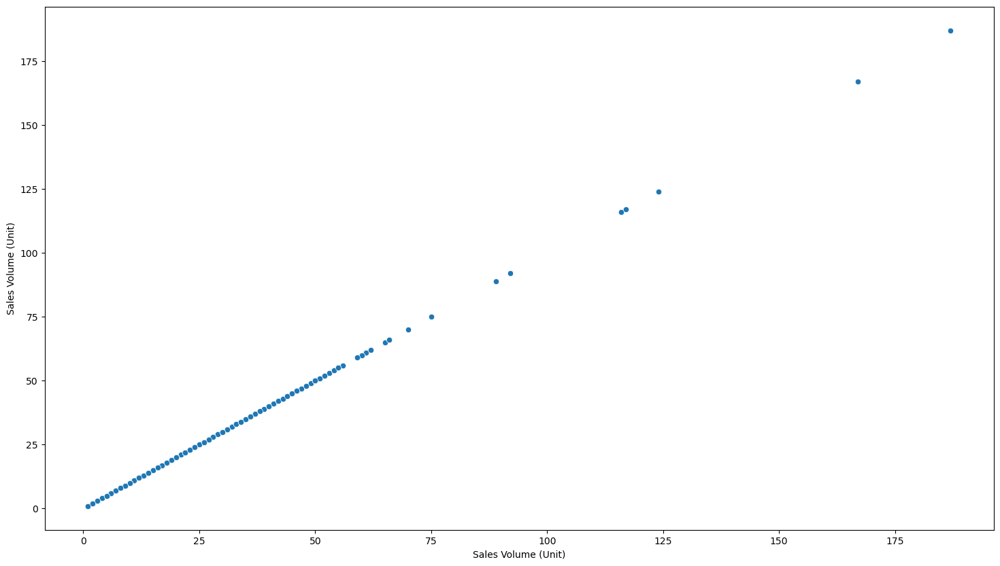

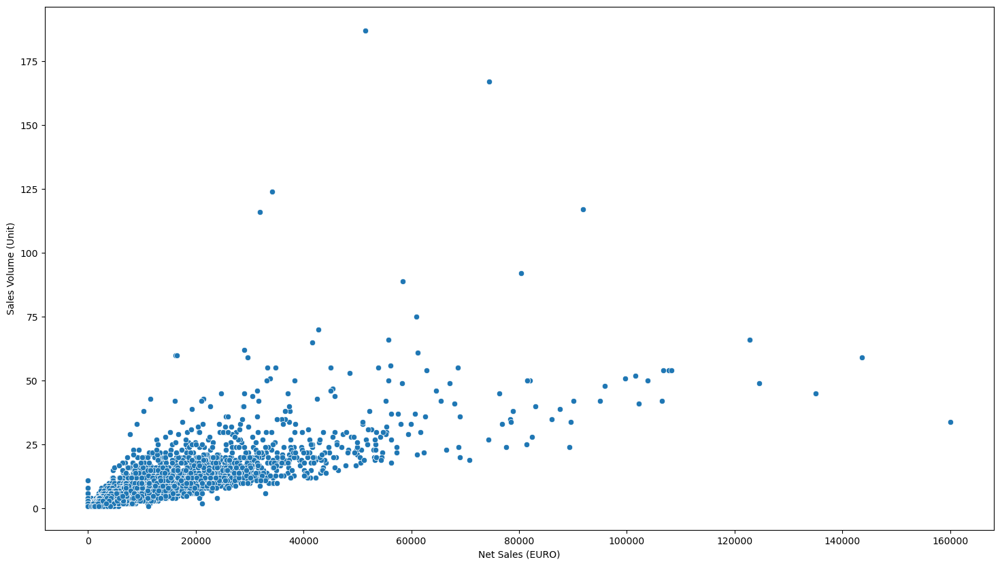

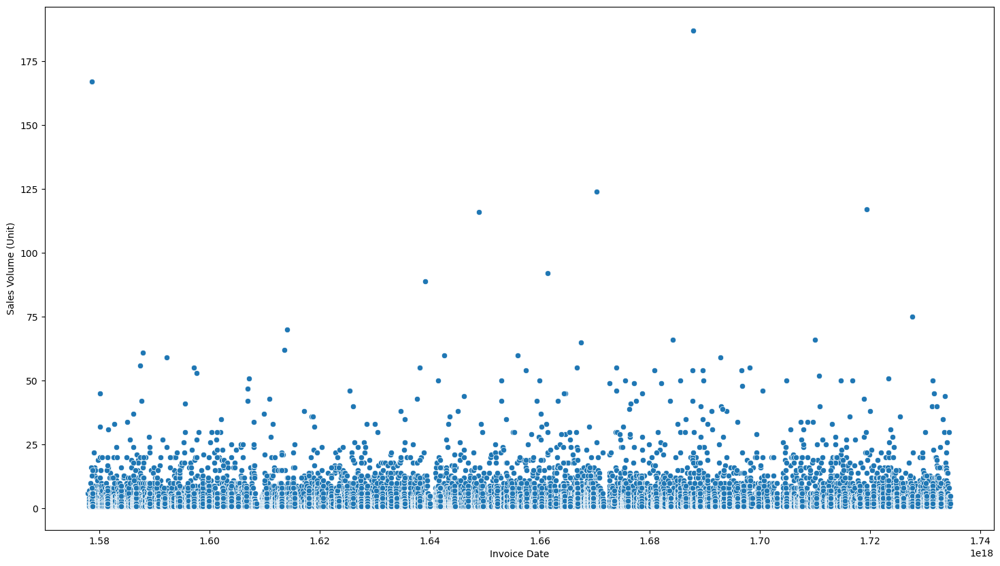

...

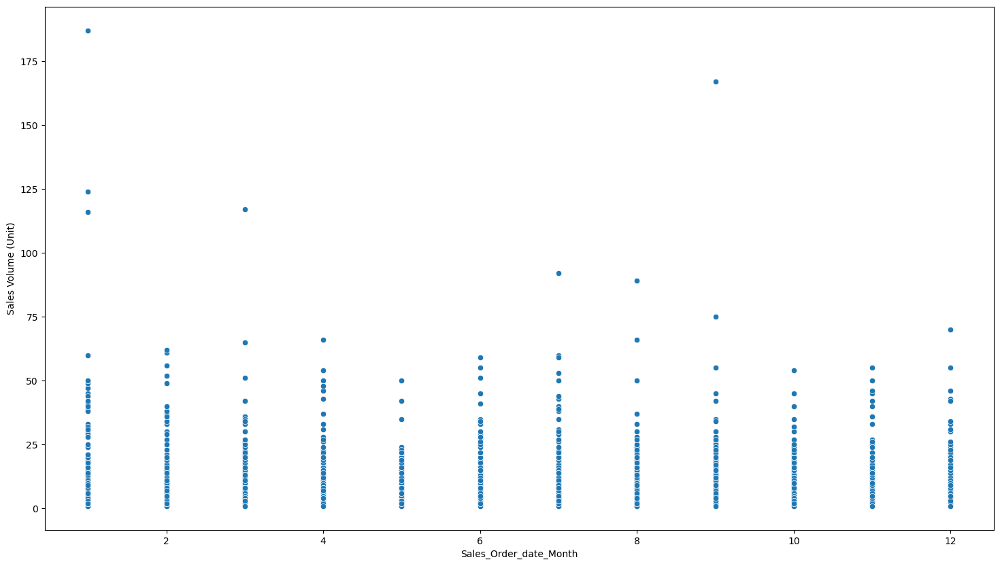

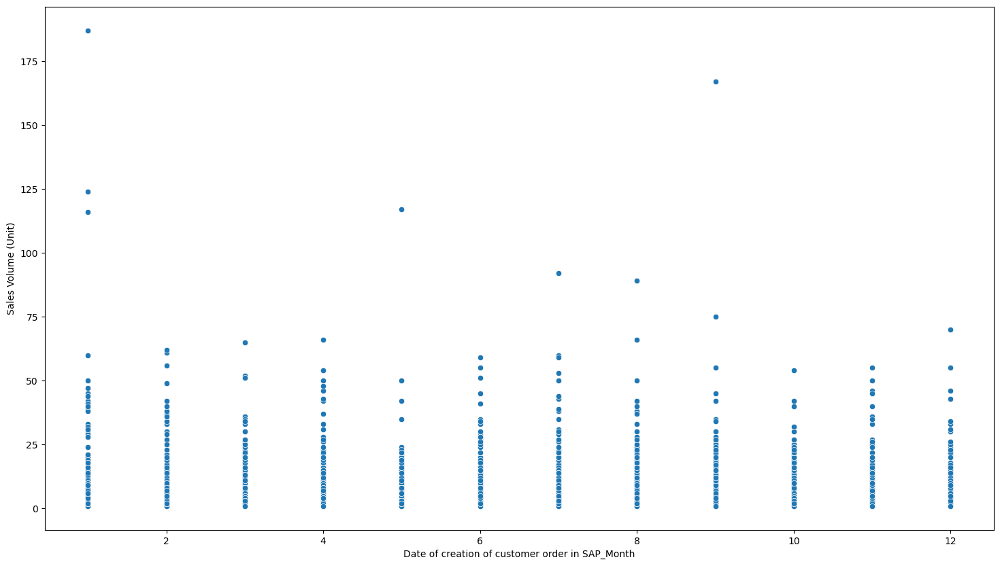

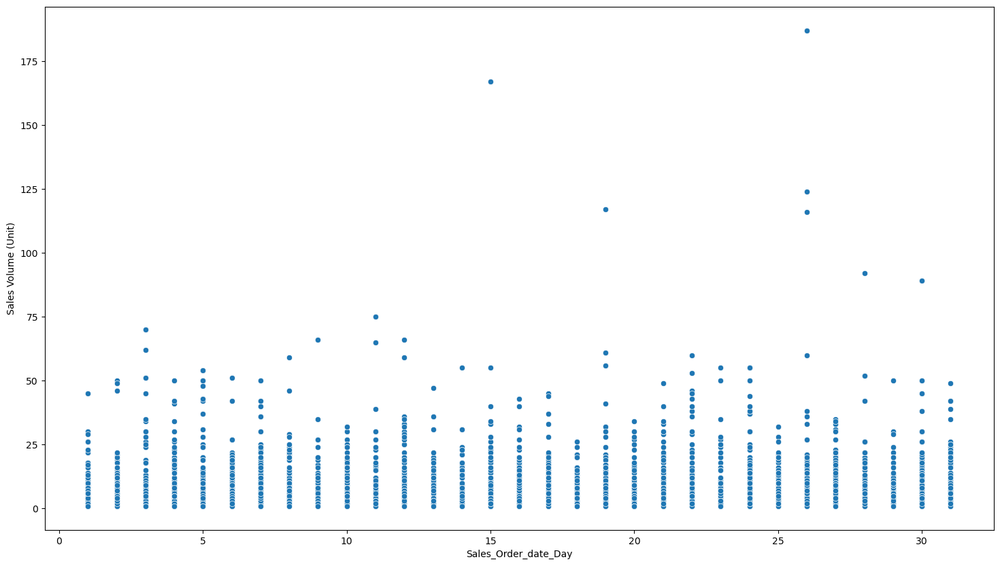

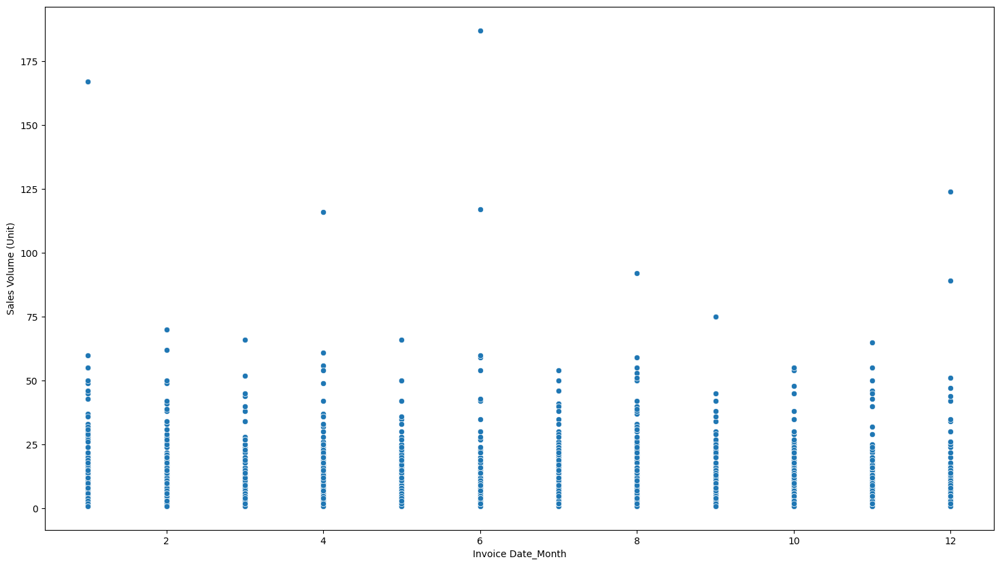

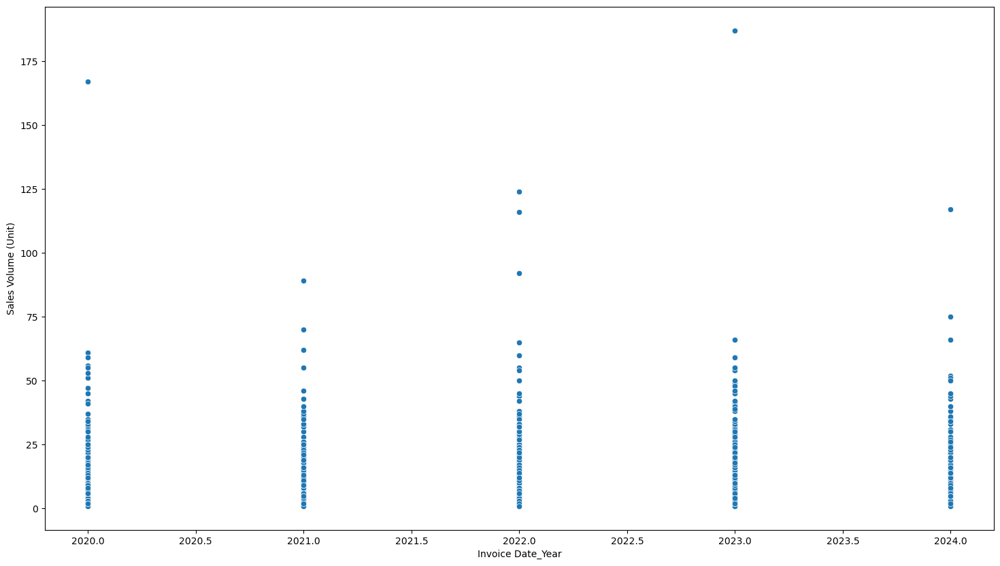

In [64]:
for i in data.columns:
    plt.figure(figsize=(18, 10))
    sns.scatterplot(data=data, x=i, y="Sales Volume (Unit)")
    plt.show()

In [65]:
value_counts= data['City_buyer'].value_counts()
value_counts

City_buyer
Berlin            327
Stuhr             276
Grammetal         254
OsnabrÃ¼ck        252
Mannheim          227
                 ... 
Malmedy             1
Berneck             1
Friedrichstadt      1
Erlinsbach          1
Gerolstein          1
Name: count, Length: 1131, dtype: int64

In [66]:
value_counts= data['City_buyer'].value_counts()
for index, value in value_counts.items():
  print(f"Value: {index}, Count: {value}")


Value: Berlin, Count: 327
Value: Stuhr, Count: 276
Value: Grammetal, Count: 254
Value: OsnabrÃ¼ck, Count: 252
Value: Mannheim, Count: 227
Value: Duisburg, Count: 222
Value: Rangsdorf, Count: 219
Value: Klipphausen, Count: 218
Value: Didam, Count: 216
Value: Erfurt, Count: 208
Value: Ahaus, Count: 206
Value: Markt Schwaben, Count: 183
Value: Hartenstein, Count: 183
Value: GÃ¼tersloh, Count: 179
Value: BarsbÃ¼ttel, Count: 178
Value: GieÃŸen, Count: 171
Value: Hamburg, Count: 171
Value: NÃ¼rnberg, Count: 170
Value: Wels, Count: 169
Value: WÃ¼rzburg, Count: 169
Value: Merzig, Count: 168
Value: Rheda-WiedenbrÃ¼ck, Count: 164
Value: Kiel, Count: 159
Value: Perchtoldsdorf, Count: 157
Value: Lingen, Count: 155
Value: Rastede, Count: 151
Value: Pratteln, Count: 149
Value: Memmingen, Count: 149
Value: Altenstadt, Count: 148
Value: Hildesheim, Count: 140
Value: Sarstedt, Count: 137
Value: Hennef, Count: 133
Value: Langenhagen, Count: 129
Value: KÃ¶ln, Count: 127
Value: Schwerzenbach, Count: 125
V

In [67]:
value_counts= data['Country_buyer'].value_counts()
for index, value in value_counts.items():
  print(f"Value: {index}, Count: {value}")

Value: Germany, Count: 15353
Value: Schweiz, Count: 799
Value: Austria, Count: 770
Value: Netherland, Count: 734
Value: Poland, Count: 566
Value: Belgium, Count: 254
Value: Sweden, Count: 112
Value: Italy, Count: 73
Value: Great Britain, Count: 44
Value: Luxemburg, Count: 43
Value: France, Count: 21
Value: Finnland, Count: 15
Value: Romania, Count: 10
Value: Hungry, Count: 10
Value: Canada, Count: 8
Value: Russia, Count: 7
Value: Denmark, Count: 5
Value: China, Count: 3
Value: Ireland, Count: 3
Value: Norway, Count: 2
Value: India, Count: 2
Value: Spain, Count: 2
Value: Slowakia, Count: 2
Value: Serbia, Count: 1
Value: Bulgaria, Count: 1
Value: Czech Republic, Count: 1
Value: Bosnia, Count: 1
Value: Ukraine, Count: 1
Value: Croatia, Count: 1
Value: USA, Count: 1


In [68]:
data['City_delivery'].value_counts()

City_delivery
Rangsdorf       380
Ahaus           257
Grammetal       217
Mannheim        212
Erfurt          198
               ... 
BraÅŸov           1
Burgkunstadt      1
Rosenheim         1
Sundern           1
Gerolstein        1
Name: count, Length: 2007, dtype: int64

In [69]:
value_counts= data['Country_delivery'].value_counts()
for index, value in value_counts.items():
  print(f"Value: {index}, Count: {value}")

Value: Germany, Count: 15350
Value: Schweiz, Count: 799
Value: Austria, Count: 770
Value: Netherland, Count: 734
Value: Poland, Count: 566
Value: Belgium, Count: 254
Value: Sweden, Count: 112
Value: Italy, Count: 73
Value: Great Britain, Count: 44
Value: Luxemburg, Count: 44
Value: France, Count: 21
Value: Finnland, Count: 15
Value: Romania, Count: 10
Value: Hungry, Count: 10
Value: Canada, Count: 8
Value: Russia, Count: 7
Value: Denmark, Count: 5
Value: China, Count: 3
Value: Ireland, Count: 3
Value: Spain, Count: 2
Value: Norway, Count: 2
Value: India, Count: 2
Value: Ã–sterreich, Count: 2
Value: Slowakia, Count: 2
Value: Serbien, Count: 1
Value: Bulgaria, Count: 1
Value: Ukraine, Count: 1
Value: Polen, Count: 1
Value: Bosnia, Count: 1
Value: Croatia, Count: 1
Value: USA, Count: 1


In [70]:
data['City_buyer'].nunique()

1131

In [71]:
data['Country_buyer'].nunique()

30

In [72]:
data['Country_delivery'].nunique()

31

There are lots of unique values for City which can make things more messy during Model building. So we can delete City columns. For geographical idea we can keep Country.

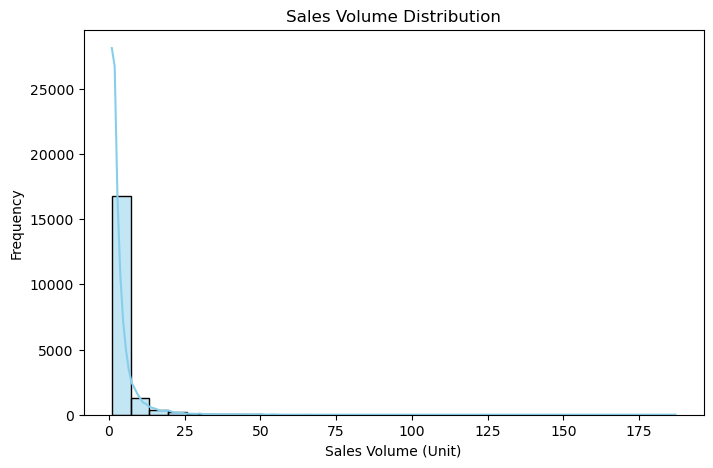

In [74]:
plt.figure(figsize=(8, 5))
sns.histplot(data['Sales Volume (Unit)'], bins=30, kde=True, color='skyblue')
plt.title('Sales Volume Distribution')
plt.xlabel('Sales Volume (Unit)')
plt.ylabel('Frequency')
plt.show()

In [75]:
# Time-based trend analysis
data['Sales Order date'] = pd.to_datetime(data['Sales Order date'])

data['YearMonth'] = data['Sales Order date'].dt.to_period('M')
monthly_sales = data.groupby('YearMonth')['Sales Volume (Unit)'].sum().reset_index()
monthly_sales

,YearMonth,Sales Volume (Unit)
0,2019-02,4
1,2019-04,9
2,2019-05,6
3,2019-06,102
4,2019-07,8
...,...,...
65,2024-08,1076
66,2024-09,1219
67,2024-10,1271
68,2024-11,1076


In [76]:
data['YearMonth'].max()

Period('2024-12', 'M')

Latest Year = 2024, Month = December

In [78]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18845 entries, 0 to 18844
Data columns (total 23 columns):
 #   Column                                           Non-Null Count  Dtype         
---  ------                                           --------------  -----         
 0   Sales Order date                                 18845 non-null  datetime64[ns]
 1   Date of creation of customer order in SAP        18845 non-null  int64         
 2   Sales Volume (Unit)                              18845 non-null  int64         
 3   Net Sales (EURO)                                 18845 non-null  float64       
 4   Invoice Date                                     18845 non-null  int64         
 5   Sales document number                            18845 non-null  int64         
 6   Product Group                                    18845 non-null  int64         
 7   Product Name                                     18845 non-null  object        
 8   Costumer Number                     

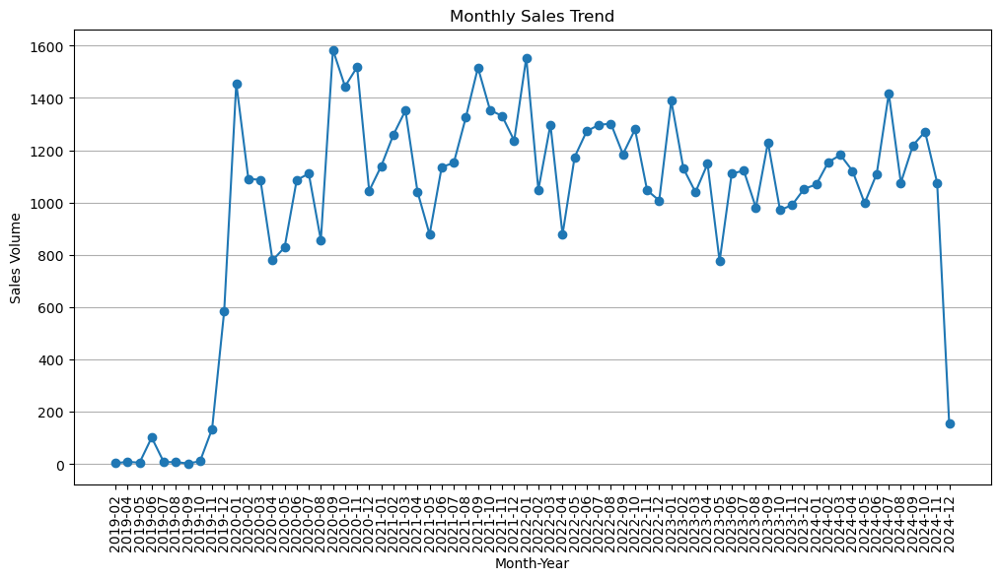

In [79]:
plt.figure(figsize=(12, 6))
plt.plot(monthly_sales['YearMonth'].astype(str), monthly_sales['Sales Volume (Unit)'], marker='o', linestyle='-')
plt.xticks(rotation=90)
plt.title('Monthly Sales Trend')
plt.xlabel('Month-Year')
plt.ylabel('Sales Volume')
plt.grid(axis='y')
plt.show()

Sales Volume was at peak during 2020 - August. Sales Volume lowest during 2019-02.


Top 5 Customers by Sales Volume:
Sold to Costumer
RICHTER + FRENZEL                  6891
BOSCH THERMOTECHNIK GMBH           3872
KURT PIETSCH GMBH & CO. KG         1275
REISSER AG                          910
MOLIN INDUSTRIE- INBETRIEBNAHME     879
Name: Sales Volume (Unit), dtype: int64


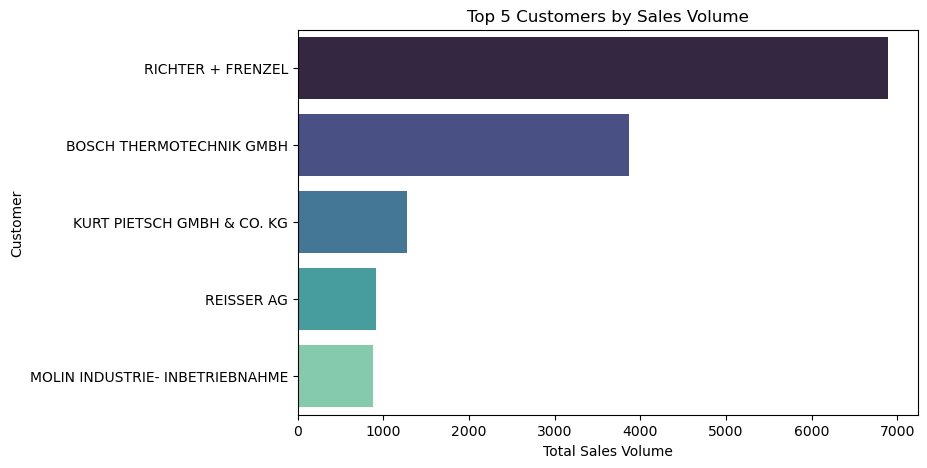

In [81]:
# Top 5 customers by total sales volume
customer_sales = data.groupby('Sold to Costumer')['Sales Volume (Unit)'].sum().sort_values(ascending=False).head(5)
print("\nTop 5 Customers by Sales Volume:")
print(customer_sales)

plt.figure(figsize=(8, 5))
sns.barplot(x=customer_sales.values, y=customer_sales.index, palette='mako')
plt.title('Top 5 Customers by Sales Volume')
plt.xlabel('Total Sales Volume')
plt.ylabel('Customer')
plt.show()


Customer with maximum Sales Volume = RICHTER + FRENZEL

In [83]:
data.columns

Index(['Sales Order date', 'Date of creation of customer order in SAP',
       'Sales Volume (Unit)', 'Net Sales (EURO)', 'Invoice Date',
       'Sales document number', 'Product Group', 'Product Name',
       'Costumer Number', 'Sold to Costumer', 'City_buyer', 'Country_buyer',
       'Ship to Party', 'City_delivery', 'Country_delivery',
       'Sales_Order_date_Year',
       'Date of creation of customer order in SAP_Year',
       'Sales_Order_date_Month',
       'Date of creation of customer order in SAP_Month',
       'Sales_Order_date_Day', 'Invoice Date_Month', 'Invoice Date_Year',
       'YearMonth'],
      dtype='object')

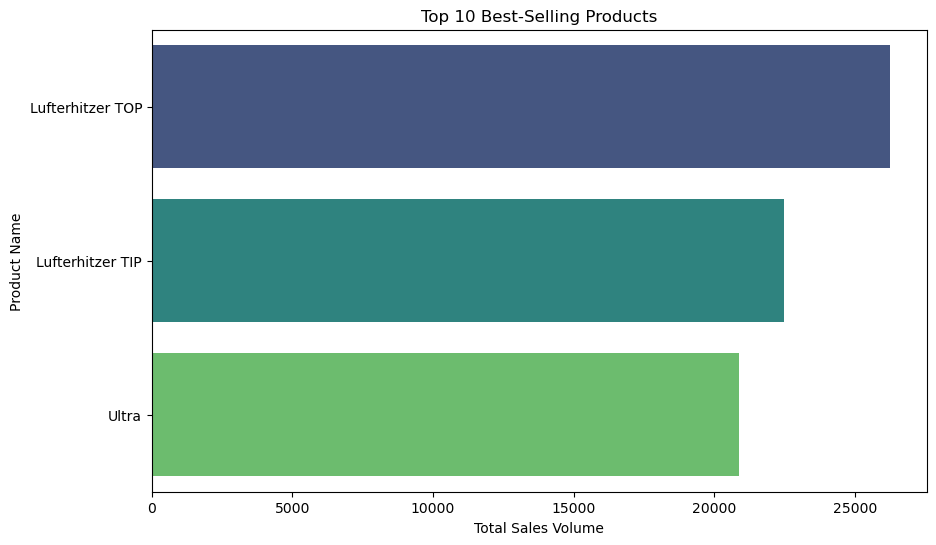

In [84]:
# Product performance analysis (Sales Volume per Product)
product_sales = data.groupby('Product Name')['Sales Volume (Unit)'].sum().sort_values(ascending=False)
plt.figure(figsize=(10, 6))
sns.barplot(x=product_sales.values[:10], y=product_sales.index[:10], palette='viridis')
plt.title('Top 10 Best-Selling Products')
plt.xlabel('Total Sales Volume')
plt.ylabel('Product Name')
plt.show()


In [85]:
product_sales

Product Name
Lufterhitzer TOP    26253
Lufterhitzer TIP    22490
Ultra               20872
Name: Sales Volume (Unit), dtype: int64

In [86]:
product_sales = data.groupby('Product Name')['Sales Volume (Unit)'].sum().sort_values(ascending=False)
total_sales = product_sales.sum()
product_sales_percentage = (product_sales/total_sales)*100
product_sales_percentage

Product Name
Lufterhitzer TOP    37.711700
Lufterhitzer TIP    32.306256
Ultra               29.982044
Name: Sales Volume (Unit), dtype: float64

Product with maximum Sales Volume - Lufterhitzer TOP , highlighting it's strong demand with 37.7% Sales Volume

In [88]:
product_monthly_sales = data.groupby(['Product Name', 'YearMonth'])['Sales Volume (Unit)'].sum()
product_monthly_sales

Product Name      YearMonth
Lufterhitzer TIP  2019-10        9
                  2019-11       11
                  2019-12      194
                  2020-01      671
                  2020-02      339
                              ... 
Ultra             2024-08      377
                  2024-09      333
                  2024-10      301
                  2024-11      237
                  2024-12       19
Name: Sales Volume (Unit), Length: 198, dtype: int64

In [89]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18845 entries, 0 to 18844
Data columns (total 23 columns):
 #   Column                                           Non-Null Count  Dtype         
---  ------                                           --------------  -----         
 0   Sales Order date                                 18845 non-null  datetime64[ns]
 1   Date of creation of customer order in SAP        18845 non-null  int64         
 2   Sales Volume (Unit)                              18845 non-null  int64         
 3   Net Sales (EURO)                                 18845 non-null  float64       
 4   Invoice Date                                     18845 non-null  int64         
 5   Sales document number                            18845 non-null  int64         
 6   Product Group                                    18845 non-null  int64         
 7   Product Name                                     18845 non-null  object        
 8   Costumer Number                     

In [90]:
product_monthly_sales = data.groupby(['Product Name', 'Sales_Order_date_Month'])['Sales Volume (Unit)'].sum()
product_monthly_sales

Product Name      Sales_Order_date_Month
Lufterhitzer TIP  1                         2919
                  2                         1888
                  3                         1812
                  4                         1237
                  5                         1357
                  6                         1327
                  7                         1631
                  8                         1629
                  9                         2325
                  10                        2246
                  11                        2188
                  12                        1931
Lufterhitzer TOP  1                         2154
                  2                         2106
                  3                         2531
                  4                         1853
                  5                         1870
                  6                         2365
                  7                         2268
                  8         

Above plot is for Product wise monthly Sales Volume:
1. Lufterhitzer TIP has most Sales in the month of January = 2919
2. Lufterhitzer TOP has most Sales in the month of November= 2472
3. Ultra has most Sales in the month of July = 2208

In [92]:
country_buyer_sales = data.groupby('Country_buyer')['Net Sales (EURO)'].sum().reset_index().sort_values('Net Sales (EURO)', ascending=False)
country_buyer_sales

,Country_buyer,Net Sales (EURO)
11,Germany,72335036.59
23,Schweiz,5624538.68
0,Austria,3595212.31
20,Poland,3198768.62
18,Netherland,3184537.02
16,Italy,1405985.41
1,Belgium,1293365.82
27,Sweden,491422.20
13,Hungry,334608.76
17,Luxemburg,292718.58


Germany is the leading country in Net Sales - 72335036.59.

In [94]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18845 entries, 0 to 18844
Data columns (total 23 columns):
 #   Column                                           Non-Null Count  Dtype         
---  ------                                           --------------  -----         
 0   Sales Order date                                 18845 non-null  datetime64[ns]
 1   Date of creation of customer order in SAP        18845 non-null  int64         
 2   Sales Volume (Unit)                              18845 non-null  int64         
 3   Net Sales (EURO)                                 18845 non-null  float64       
 4   Invoice Date                                     18845 non-null  int64         
 5   Sales document number                            18845 non-null  int64         
 6   Product Group                                    18845 non-null  int64         
 7   Product Name                                     18845 non-null  object        
 8   Costumer Number                     

In [95]:
data['Invoice Date']= pd.to_datetime(data['Invoice Date'])

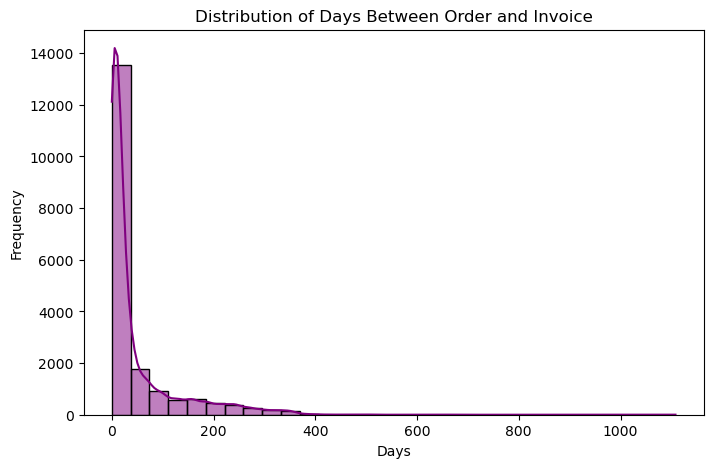

In [96]:
data['Order_To_Invoice_Days'] = (data['Invoice Date'] - data['Sales Order date']).dt.days
data['Order_To_Invoice_Days'] = data['Order_To_Invoice_Days'].apply(lambda x: x if pd.notnull(x) and x >= 0 else 0)

# Analyze Distribution of Days Difference
plt.figure(figsize=(8, 5))
sns.histplot(data['Order_To_Invoice_Days'], bins=30, kde=True, color='purple')
plt.title('Distribution of Days Between Order and Invoice')
plt.xlabel('Days')
plt.ylabel('Frequency')
plt.show()

There is not much lag for most of the Order Date and Invoice Date. We can keep Order Date for model building instead of both order date and invoice date.

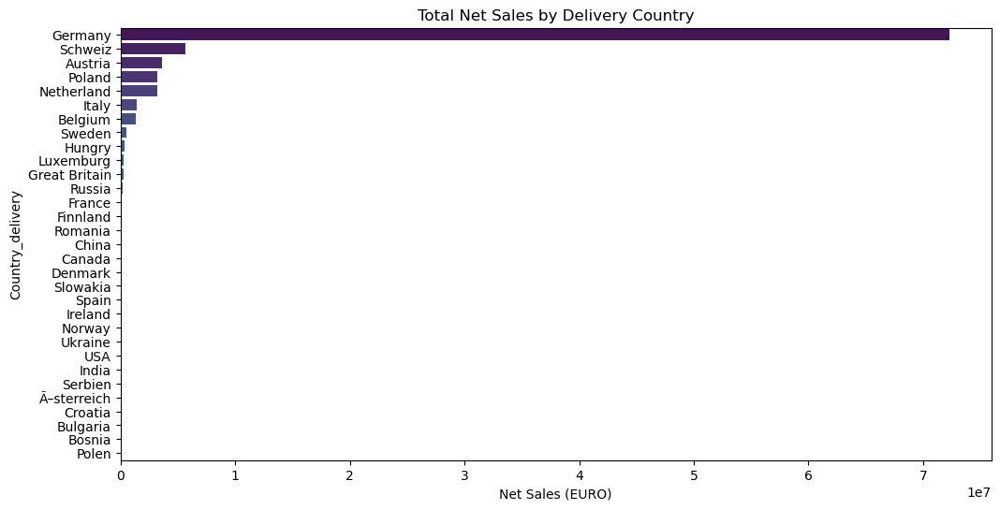

In [98]:
country_delivery_sales = data.groupby('Country_delivery')['Net Sales (EURO)'].sum().reset_index().sort_values('Net Sales (EURO)', ascending=False)
plt.figure(figsize=(12, 6))
sns.barplot(x='Net Sales (EURO)', y='Country_delivery', data=country_delivery_sales, palette='viridis')
plt.title('Total Net Sales by Delivery Country')
plt.show()

Germany followed by Schweiz followed by Austria are the leading countries for Net Sales.

In [100]:
combined_country_sales = pd.concat([data['Country_buyer'], data['Country_delivery']])
combined_sales = pd.concat([data['Net Sales (EURO)'], data['Net Sales (EURO)']])

combined_df = pd.DataFrame({
    'Country': combined_country_sales,
    'Net Sales (EURO)': combined_sales
})
combined_df

,Country,Net Sales (EURO)
0,Germany,9319.61
1,Germany,9432.25
2,Germany,4202.38
3,Germany,2250.26
4,Germany,1525.12
...,...,...
18840,Germany,2796.42
18841,Germany,6450.89
18842,Germany,1933.30
18843,Poland,18205.41


In [101]:
combined_country_sales = combined_df.groupby('Country')['Net Sales (EURO)'].sum().reset_index().sort_values('Net Sales (EURO)', ascending=False)
combined_country_sales

,Country,Net Sales (EURO)
11,Germany,1.446621e+08
24,Schweiz,1.124908e+07
0,Austria,7.190425e+06
20,Poland,6.397537e+06
18,Netherland,6.369074e+06
16,Italy,2.811971e+06
1,Belgium,2.586732e+06
29,Sweden,9.828444e+05
13,Hungry,6.692175e+05
17,Luxemburg,5.876188e+05


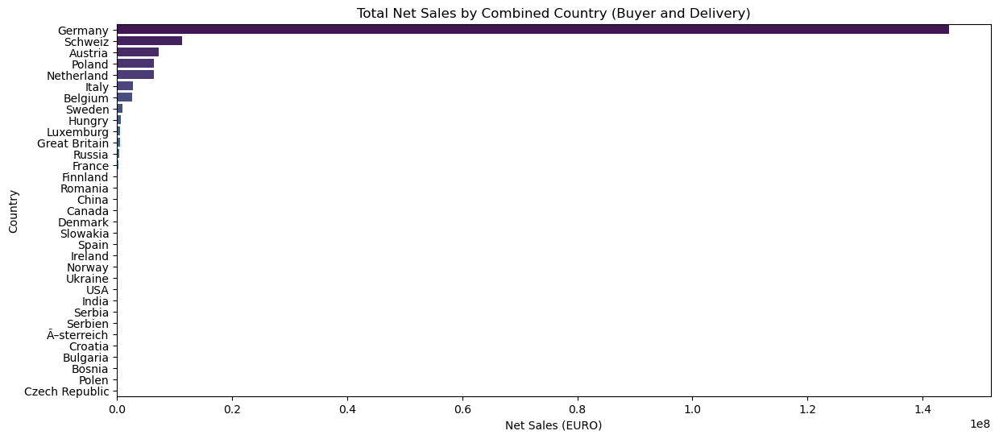

In [102]:
plt.figure(figsize=(14, 6))
sns.barplot(x='Net Sales (EURO)', y='Country', data=combined_country_sales, palette='viridis')
plt.title('Total Net Sales by Combined Country (Buyer and Delivery)')
plt.xlabel('Net Sales (EURO)')
plt.ylabel('Country')
plt.show()

Both Country Buyer and Delivery have same distribution indicating that we can keep any one column for model building instead of passing both the column during training.


In [104]:
pivot = data.pivot_table(index='Product Group', values=['Sales Volume (Unit)', 'Net Sales (EURO)'], aggfunc='sum')
pivot

,Net Sales (EURO),Sales Volume (Unit)
Product Group,,
1153,39184767.52,26253
1154,35191022.31,20872
1157,18226169.84,22490


Product - 1153 is leading in both Net Sales and Sales Volume

In [106]:
# Top 5 Customers by Net Sales
top_customers = data.groupby('Sold to Costumer')['Net Sales (EURO)'].sum().nlargest(5)
print("\nTop 5 Customers by Net Sales:")
print(top_customers)


Top 5 Customers by Net Sales:
Sold to Costumer
RICHTER + FRENZEL             7275678.29
BOSCH THERMOTECHNIK GMBH      4942857.23
KURT PIETSCH GMBH & CO. KG    1398415.29
BLANK & SEEGERS KG            1134217.06
RHEIN-RUHR COLLIN KG          1041919.14
Name: Net Sales (EURO), dtype: float64


In [107]:
# Top 5 Products by Net Sales
top_products = data.groupby('Product Name')['Net Sales (EURO)'].sum().nlargest(5)
print("\nTop 5 Products by Net Sales:")
print(top_products)


Top 5 Products by Net Sales:
Product Name
Lufterhitzer TOP    39184767.52
Ultra               35191022.31
Lufterhitzer TIP    18226169.84
Name: Net Sales (EURO), dtype: float64


For Net Sales- Product Lufterhitzer TOP has the most sales

In [109]:
# Cross Tabulation: Number of Orders by Product and Top 5 Countries by Net Sales
top_5_countries = data['Country_delivery'].head(5)
filtered_data = data[data['Country_delivery'].isin(top_5_countries)]
cross_tab = pd.crosstab(filtered_data['Product Name'], filtered_data['Country_delivery'])
print("\nCross Tab: Orders by Product and Top 5 Countries by Net Sales")
print(cross_tab.head())


Cross Tab: Orders by Product and Top 5 Countries by Net Sales
Country_delivery  Germany
Product Name             
Lufterhitzer TIP     5234
Lufterhitzer TOP     6192
Ultra                3924


In [110]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18845 entries, 0 to 18844
Data columns (total 24 columns):
 #   Column                                           Non-Null Count  Dtype         
---  ------                                           --------------  -----         
 0   Sales Order date                                 18845 non-null  datetime64[ns]
 1   Date of creation of customer order in SAP        18845 non-null  int64         
 2   Sales Volume (Unit)                              18845 non-null  int64         
 3   Net Sales (EURO)                                 18845 non-null  float64       
 4   Invoice Date                                     18845 non-null  datetime64[ns]
 5   Sales document number                            18845 non-null  int64         
 6   Product Group                                    18845 non-null  int64         
 7   Product Name                                     18845 non-null  object        
 8   Costumer Number                     

In [111]:
customer_summary = data.groupby('Sold to Costumer').agg({
    'Sales Volume (Unit)': ['sum', 'mean', 'count'],
    'Invoice Date': ['min', 'max']
})
customer_summary

Sales Volume (Unit)             \
                                                       sum mean count   
Sold to Costumer                                                        
"LANDHEN" - ANDRZEJ LESIAK                               3  3.0     1   
"MRÃ“Z" ZAKRZEWSKI SP. J.                                5  5.0     1   
2G ENERGIETECHNIK GMBH                                   1  1.0     1   
A & B ENGINEERING MSD LTD                                1  1.0     1   
A & R SP. Z O.O.                                        62  3.1    20   
...                                                    ...  ...   ...   
ZIS ÅšWIÄ„TEK SPÃ“ÅKA JAWNA                             4  4.0     1   
ZON & CO BV                                              1  1.0     1   
ZWECKVERBAND MÃœLLVERWERTUNG                             1  1.0     1   
ZÃœNDORF KÃ„LTE-KLIMA-LÃœFTUNGSTECHNIK                   1  1.0     1   
Ã–FM GES. FÃœR HEIZ- UND REGELTECHNIK                    5  5.0     1   

                                       Invoice Date             
                                                min        max  
Sold to Costumer                                                
"LANDHEN" - ANDRZEJ LESIAK               2023-04-07 2023-04-07  
"MRÃ“Z" ZAKRZEWSKI SP. J.                2024-12-19 2024-12-19  
2G ENERGIETECHNIK GMBH                   2024-06-08 2024-06-08  
A & B ENGINEERING MSD LTD                2023-07-26 2023-07-26  
A & R SP. Z O.O.                         2020-07-13 2024-11-19  
...                                             ...        ...  
ZIS ÅšWIÄ„TEK SPÃ“ÅKA JAWNA             2021-09-08 2021-09-08  
ZON & CO BV                              2024-05-12 2024-05-12  
ZWECKVERBAND MÃœLLVERWERTUNG             2024-12-12 2024-12-12  
ZÃœNDORF KÃ„LTE-KLIMA-LÃœFTUNGSTECHNIK   2024-06-21 2024-06-21  
Ã–FM GES. FÃœR HEIZ- UND REGELTECHNIK    2023-07-06 2023-07-06  

[1392 rows x 5 columns]

In [112]:
# Customer Segmentation: Analyzing Customer Behavior
customer_summary = data.groupby('Sold to Costumer').agg({
    'Sales Volume (Unit)': ['sum', 'mean', 'count'],
    'Invoice Date': ['min', 'max']
})

customer_summary.columns = ['Total_Sales', 'Avg_Sales', 'Order_Count', 'First_Order', 'Last_Order']
customer_summary['Customer_Lifetime'] = (customer_summary['Last_Order'] - customer_summary['First_Order']).dt.days
customer_summary.sort_values('Total_Sales', ascending=False, inplace=True)

print("\nTop Customers by Sales:")
customer_summary.head()


Top Customers by Sales:


,Total_Sales,Avg_Sales,Order_Count,First_Order,Last_Order,Customer_Lifetime
Sold to Costumer,,,,,,
RICHTER + FRENZEL,6891,3.908678,1763,2020-01-04,2024-12-18,1810
BOSCH THERMOTECHNIK GMBH,3872,3.694656,1048,2020-01-10,2024-12-13,1799
KURT PIETSCH GMBH & CO. KG,1275,4.351536,293,2020-01-21,2024-12-17,1792
REISSER AG,910,2.549020,357,2020-01-09,2024-12-13,1800
MOLIN INDUSTRIE- INBETRIEBNAHME,879,41.857143,21,2021-03-08,2024-06-21,1201


RICHTER + FRENZEL having most Sales from 2020-1 to 2024-12. Thus, we can conclude if customer can be retained for longer period then sales volume is going to increase.

In [114]:
# Identify High-Value Customers
top_customers = customer_summary[customer_summary['Total_Sales'] > customer_summary['Total_Sales'].quantile(0.90)]
print("\nHigh-Value Customers:")
print(top_customers)



High-Value Customers:
                                    Total_Sales  Avg_Sales  Order_Count  \
Sold to Costumer                                                          
RICHTER + FRENZEL                          6891   3.908678         1763   
BOSCH THERMOTECHNIK GMBH                   3872   3.694656         1048   
KURT PIETSCH GMBH & CO. KG                 1275   4.351536          293   
REISSER AG                                  910   2.549020          357   
MOLIN INDUSTRIE- INBETRIEBNAHME             879  41.857143           21   
...                                         ...        ...          ...   
ETABLISSEMENTS RENKIN S.A.                   99   9.000000           11   
ARNOLD LAMMERING GMBH                        99   2.302326           43   
VAN DER WERFF                                98   3.161290           31   
DUSSMANN KÃ„LTE- UND                         98   2.085106           47   
HEINRICH VOSS GEBÃ„UDETECHNIK GMBH           98   6.125000           16   

 

In [115]:
#Cross-tabulation: Orders by Product and Country
cross_tab = pd.crosstab(data['Product Name'], data['Country_buyer'])
print("\nCross Tab: Orders by Product and Country:\n", cross_tab)


Cross Tab: Orders by Product and Country:
 Country_buyer     Austria  Belgium  Bosnia  Bulgaria  Canada  China  Croatia  \
Product Name                                                                   
Lufterhitzer TIP      492      147       0         1       0      3        1   
Lufterhitzer TOP      134        3       0         0       8      0        0   
Ultra                 144      104       1         0       0      0        0   

Country_buyer     Czech Republic  Denmark  Finnland  ...  Poland  Romania  \
Product Name                                         ...                    
Lufterhitzer TIP               0        1        12  ...      43        1   
Lufterhitzer TOP               0        3         3  ...      37        5   
Ultra                          1        1         0  ...     486        4   

Country_buyer     Russia  Schweiz  Serbia  Slowakia  Spain  Sweden  USA  \
Product Name                                                              
Lufterhitzer TIP   

In [116]:
top_customers = data.groupby('Sold to Costumer')['Net Sales (EURO)'].sum().nlargest(10).reset_index()
top_customers

,Sold to Costumer,Net Sales (EURO)
0,RICHTER + FRENZEL,7275678.29
1,BOSCH THERMOTECHNIK GMBH,4942857.23
2,KURT PIETSCH GMBH & CO. KG,1398415.29
3,BLANK & SEEGERS KG,1134217.06
4,RHEIN-RUHR COLLIN KG,1041919.14
5,REISSER AG,1039084.69
6,SÃ„CHSISCHE HAUSTECHNIK DRESDEN KG,919445.83
7,CHRISTIAN GÃœRTH KID HAUSTECHNIK,908486.13
8,CORDES & GRAEFE BREMEN KG,869471.37
9,PETER JENSEN GMBH,827792.59


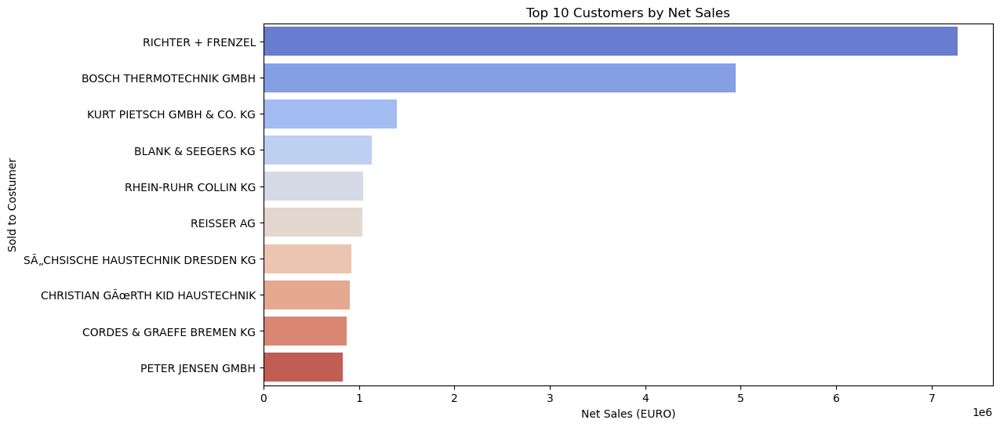

In [117]:
top_customers = data.groupby('Sold to Costumer')['Net Sales (EURO)'].sum().nlargest(10).reset_index()

plt.figure(figsize=(12, 6))
sns.barplot(x='Net Sales (EURO)', y='Sold to Costumer', data=top_customers, palette='coolwarm')
plt.title('Top 10 Customers by Net Sales')
plt.show()


Top customer for Sales - RICHTER + FRENZEL followed by BOSCH THERMOTECHNIK GMBH

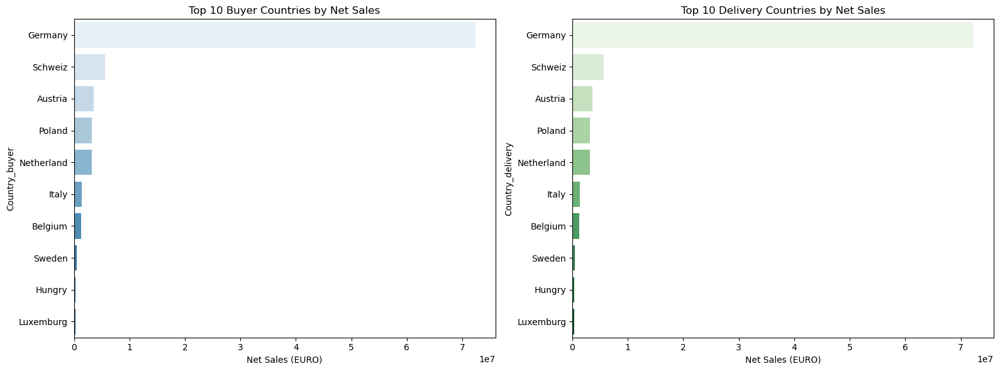

In [119]:
buyer_sales = data.groupby('Country_buyer')['Net Sales (EURO)'].sum().reset_index().sort_values('Net Sales (EURO)', ascending=False)
delivery_sales = data.groupby('Country_delivery')['Net Sales (EURO)'].sum().reset_index().sort_values('Net Sales (EURO)', ascending=False)

fig, axes = plt.subplots(1, 2, figsize=(16, 6))
sns.barplot(x='Net Sales (EURO)', y='Country_buyer', data=buyer_sales.head(10), ax=axes[0], palette='Blues')
axes[0].set_title('Top 10 Buyer Countries by Net Sales')

sns.barplot(x='Net Sales (EURO)', y='Country_delivery', data=delivery_sales.head(10), ax=axes[1], palette='Greens')
axes[1].set_title('Top 10 Delivery Countries by Net Sales')

plt.tight_layout()
plt.show()


Germany has the most Net Sales followed by Schweiz

In [121]:
data.sort_values(by='Sales Order date', ascending=True, inplace=True)


Since there are lots of unique values in City columns, we will delete city columns. We can keep Country_buyer as it has less unique values. We can delete Country_delivery as Country_delivery  and Country_buyer have same values

### Bivariate Analysis

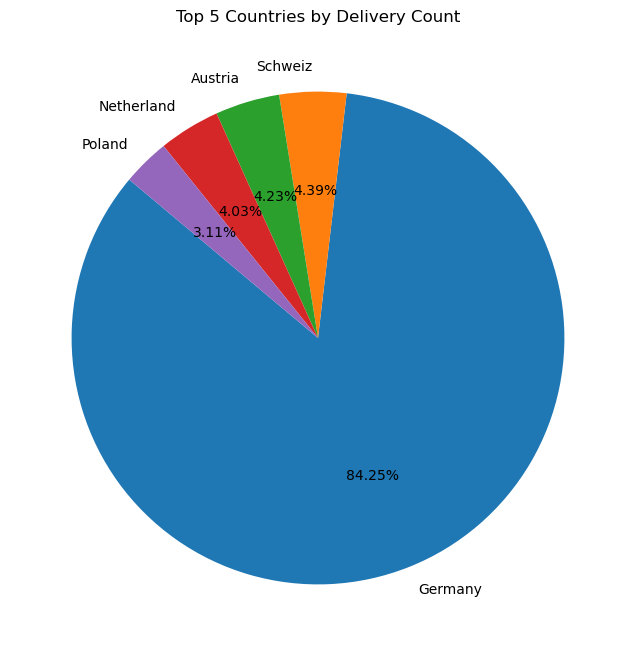

In [124]:
#pie Chart/Donut chart - distribution of top countries
top_countries = data['Country_delivery'].value_counts().nlargest(5)

plt.figure(figsize=(8, 8))
plt.pie(top_countries, labels=top_countries.index, autopct='%1.2f%%', startangle=140)
#plt.gca().add_artist(plt.Circle((0, 0), 0.3, color='white')) #30 % of total chart radius, 0,0 is the center of the pie chart, gca is get current axis
plt.title('Top 5 Countries by Delivery Count')
plt.show()

In [125]:
data.columns

Index(['Sales Order date', 'Date of creation of customer order in SAP',
       'Sales Volume (Unit)', 'Net Sales (EURO)', 'Invoice Date',
       'Sales document number', 'Product Group', 'Product Name',
       'Costumer Number', 'Sold to Costumer', 'City_buyer', 'Country_buyer',
       'Ship to Party', 'City_delivery', 'Country_delivery',
       'Sales_Order_date_Year',
       'Date of creation of customer order in SAP_Year',
       'Sales_Order_date_Month',
       'Date of creation of customer order in SAP_Month',
       'Sales_Order_date_Day', 'Invoice Date_Month', 'Invoice Date_Year',
       'YearMonth', 'Order_To_Invoice_Days'],
      dtype='object')

In [126]:
sales= data.groupby('Country_delivery')['Sales Volume (Unit)'].sum().sort_index(ascending=False).nlargest(10)
sales

Country_delivery
Germany       55031
Austria        3875
Schweiz        3071
Netherland     2474
Poland         1894
Belgium        1105
Italy           632
Sweden          417
Luxemburg       248
Russia          188
Name: Sales Volume (Unit), dtype: int64

In [127]:
country_distribution =  data['Country_delivery'].value_counts().sort_values(ascending=False).nlargest(10)
country_distribution

Country_delivery
Germany          15350
Schweiz            799
Austria            770
Netherland         734
Poland             566
Belgium            254
Sweden             112
Italy               73
Luxemburg           44
Great Britain       44
Name: count, dtype: int64

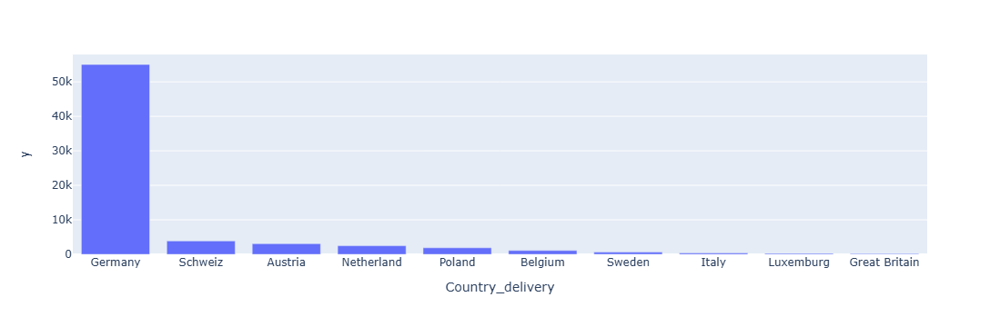

In [128]:
import plotly.express as px
country_distribution =  data['Country_delivery'].value_counts().sort_values(ascending=False).nlargest(10)
label= country_distribution.index
counts = sales
figure = px.bar(country_distribution, x= label, y=counts)
figure.show()

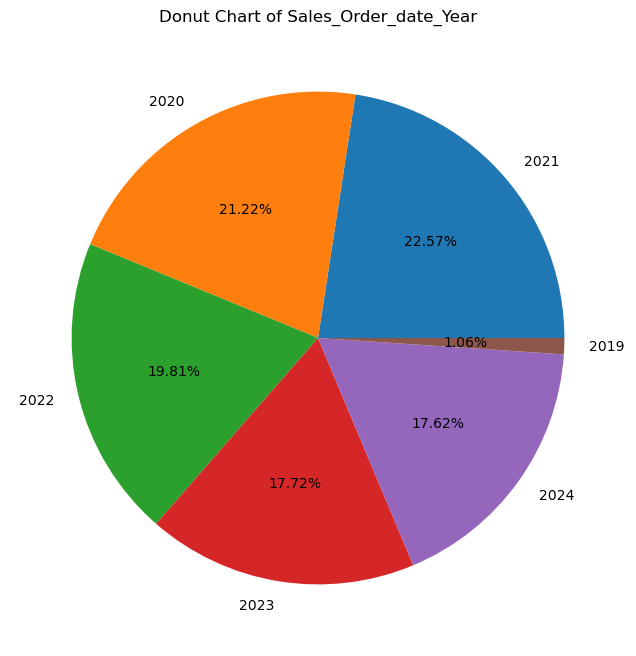

In [129]:
#pie Chart/Donut chart
Sales_Order_date_Year_distribution =  data['Sales_Order_date_Year'].value_counts()
plt.figure(figsize=(8, 8))
plt.pie(Sales_Order_date_Year_distribution , labels=Sales_Order_date_Year_distribution.index, autopct='%1.2f%%')
#plt.gca().add_artist(plt.Circle((0, 0), 0.3, color='white')) #30 % of total chart radius, 0,0 is the center of the pie chart, gca is get current axis
plt.title('Donut Chart of Sales_Order_date_Year')
plt.show()

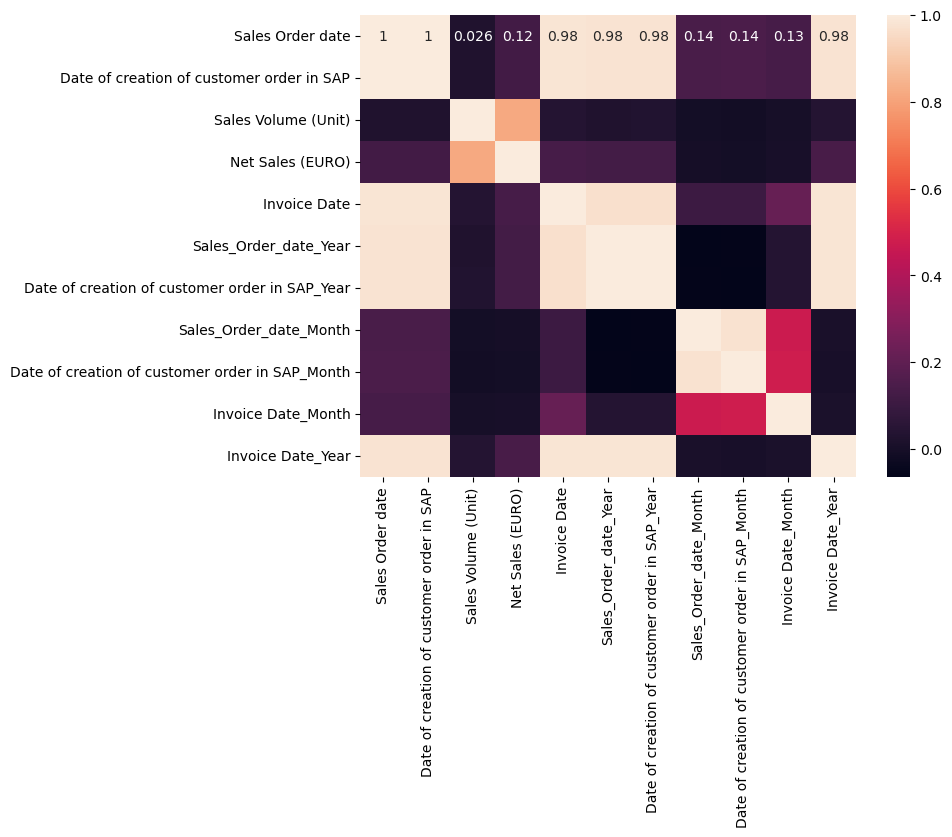

In [130]:
correlation_matrix = data[['Sales Order date','Date of creation of customer order in SAP',
       'Sales Volume (Unit)', 'Net Sales (EURO)', 'Invoice Date', 'Sales_Order_date_Year',
       'Date of creation of customer order in SAP_Year',
       'Sales_Order_date_Month',
       'Date of creation of customer order in SAP_Month', 'Invoice Date_Month', 'Invoice Date_Year']].corr()
plt.figure(figsize=(8, 6))
sns.heatmap(correlation_matrix, annot=True)

plt.show()

These columns are highly collinear, so we will keep only one column - 'Sales Order date','Date of creation of customer order in SAP', 'Invoice Date'

<Axes: xlabel='Product Group', ylabel='Sales Volume (Unit)'>

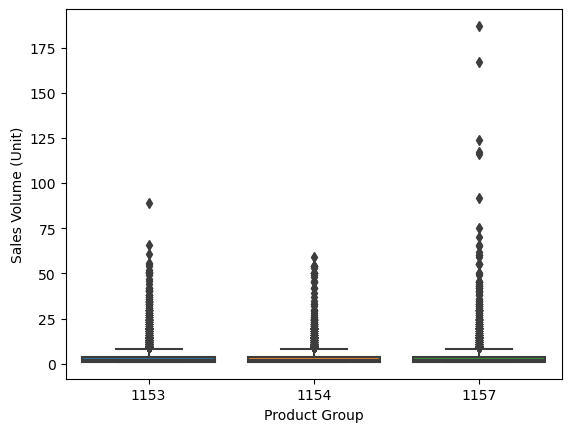

In [132]:
sns.boxplot(x='Product Group', y = 'Sales Volume (Unit)', data=data)

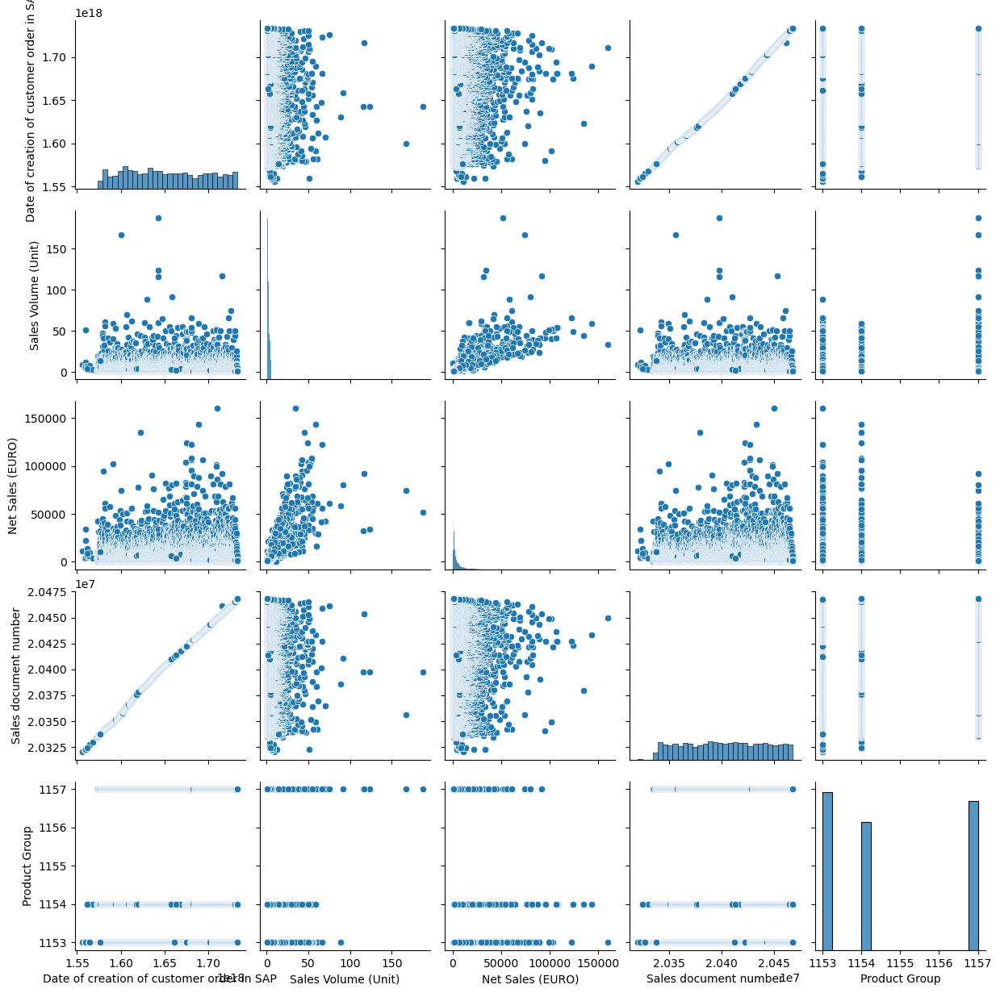

In [133]:
# Feature Interactions: Pairplot for Numerical Columns
numeric_cols = data.select_dtypes(include=np.number).columns.tolist()
sns.pairplot(data[numeric_cols[:5]])
plt.show()

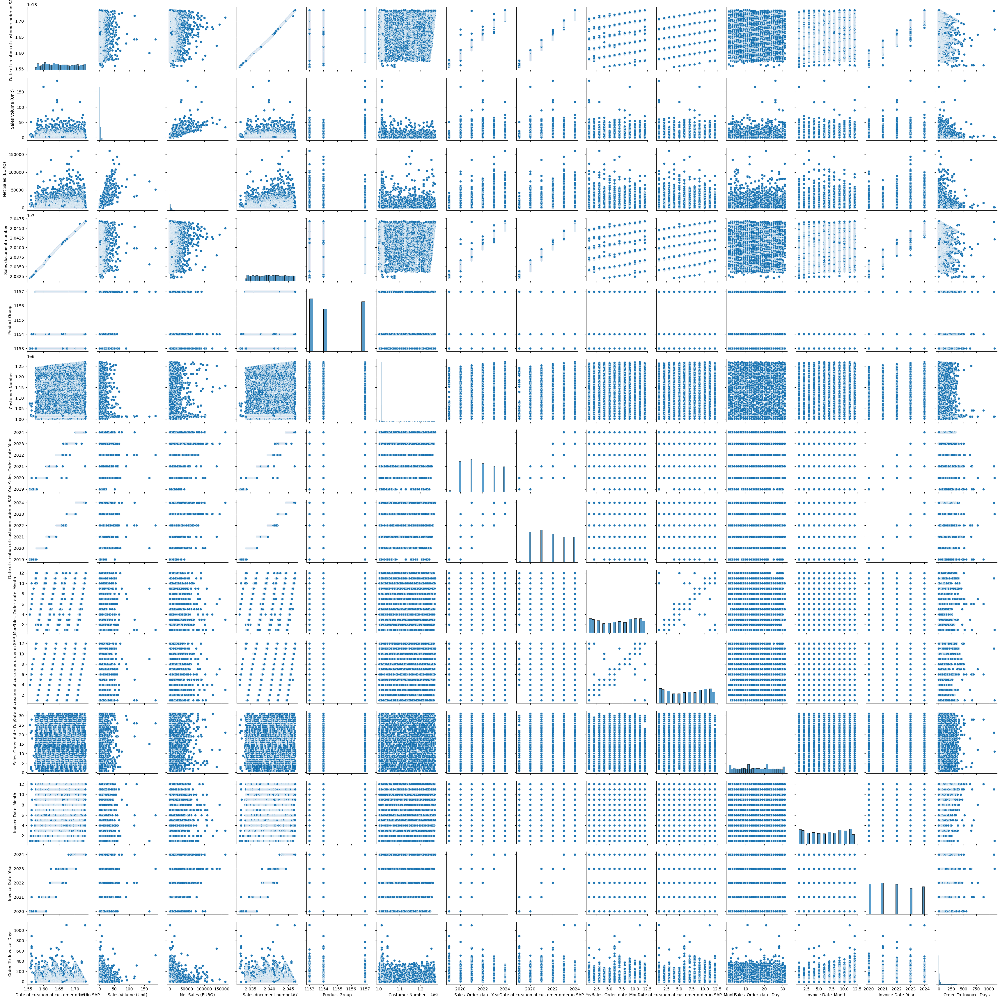

In [134]:
sns.pairplot(data)
plt.show() #detailed pair plot with all variables

In [135]:
data.columns

Index(['Sales Order date', 'Date of creation of customer order in SAP',
       'Sales Volume (Unit)', 'Net Sales (EURO)', 'Invoice Date',
       'Sales document number', 'Product Group', 'Product Name',
       'Costumer Number', 'Sold to Costumer', 'City_buyer', 'Country_buyer',
       'Ship to Party', 'City_delivery', 'Country_delivery',
       'Sales_Order_date_Year',
       'Date of creation of customer order in SAP_Year',
       'Sales_Order_date_Month',
       'Date of creation of customer order in SAP_Month',
       'Sales_Order_date_Day', 'Invoice Date_Month', 'Invoice Date_Year',
       'YearMonth', 'Order_To_Invoice_Days'],
      dtype='object')

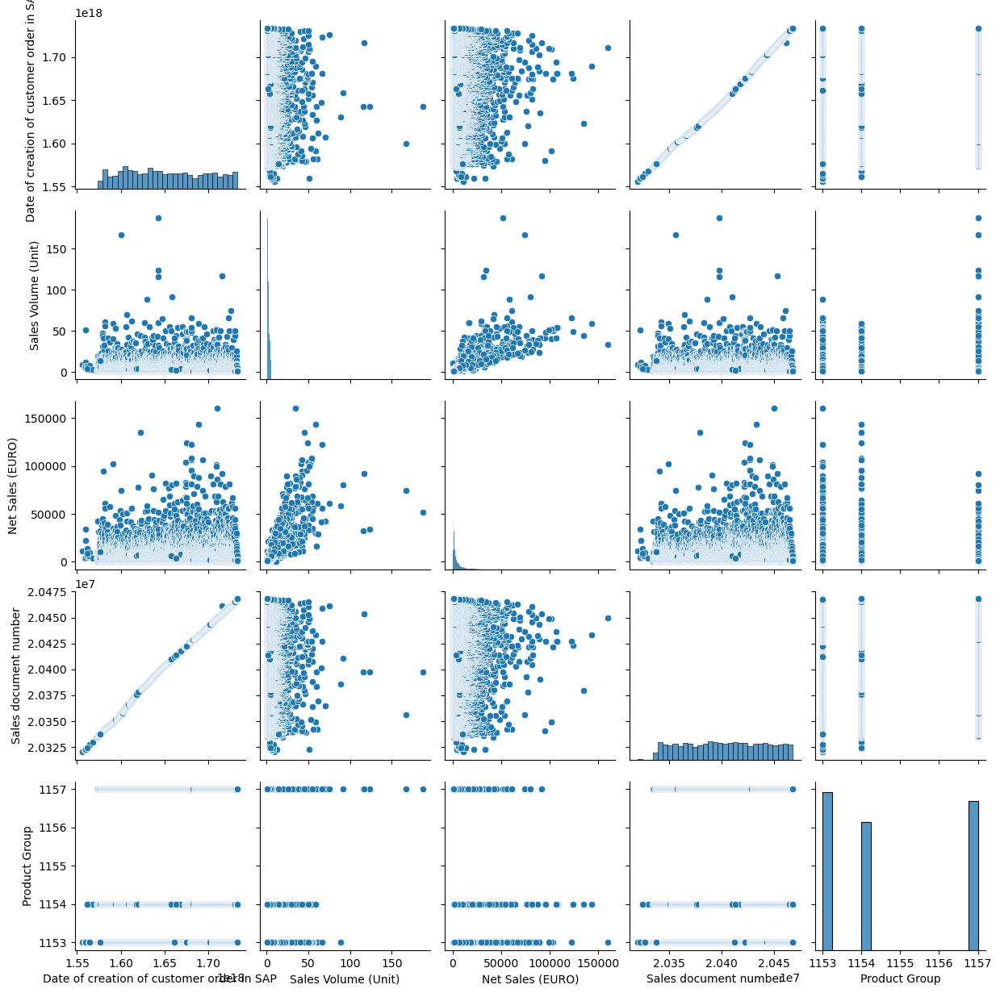

In [136]:
# Feature Interactions: Pairplot for Numerical Columns
numeric_cols = data.select_dtypes(include=np.number).columns.tolist()
sns.pairplot(data[numeric_cols[:5]])
plt.show()

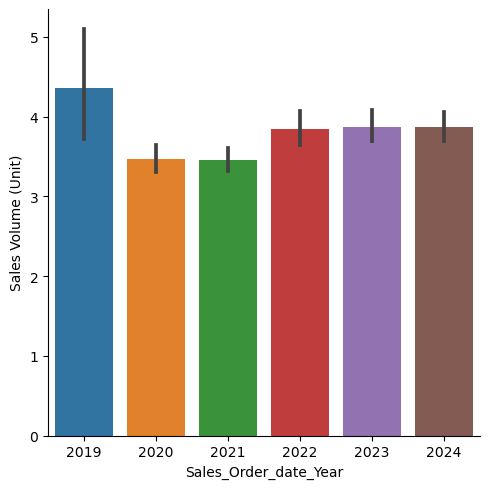

In [137]:
sns.catplot(x="Sales_Order_date_Year", y='Sales Volume (Unit)', kind='bar', data=data);

Sales has been maximum in the year 2019 then in 2022, 2023, 2024

In [139]:
data.pivot_table(index=['Country_buyer', 'Sales_Order_date_Month', 'Sales_Order_date_Year'],  values='Sales Volume (Unit)', aggfunc='sum').reset_index()

,Country_buyer,Sales_Order_date_Month,Sales_Order_date_Year,Sales Volume (Unit)
0,Austria,1,2020,18
1,Austria,1,2021,64
2,Austria,1,2022,562
3,Austria,1,2023,48
4,Austria,1,2024,53
...,...,...,...,...
592,Sweden,12,2019,3
593,Sweden,12,2021,1
594,Sweden,12,2023,1
595,USA,11,2024,4


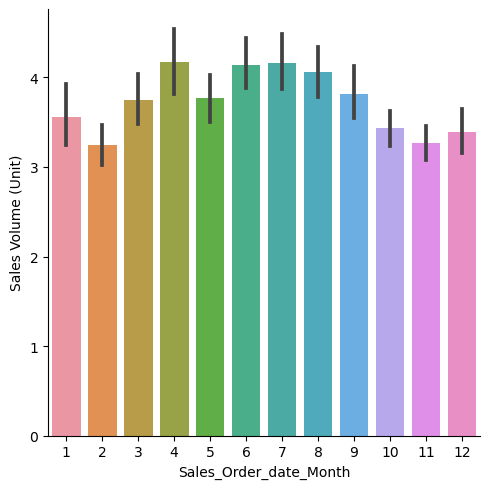

In [140]:
sns.catplot(x="Sales_Order_date_Month", y='Sales Volume (Unit)', kind='bar', data=data);

Most sales months are - April, June, July

In [142]:
data['Product Group'].value_counts()

Product Group
1153    6855
1157    6455
1154    5535
Name: count, dtype: int64

In [143]:
data['Product Name'].value_counts()

Product Name
Lufterhitzer TOP    6855
Lufterhitzer TIP    6455
Ultra               5535
Name: count, dtype: int64

In [144]:
data[data['Product Name'] == 'Lufterhitzer TOP']

,Sales Order date,Date of creation of customer order in SAP,Sales Volume (Unit),Net Sales (EURO),Invoice Date,Sales document number,Product Group,Product Name,Costumer Number,Sold to Costumer,...,Country_delivery,Sales_Order_date_Year,Date of creation of customer order in SAP_Year,Sales_Order_date_Month,Date of creation of customer order in SAP_Month,Sales_Order_date_Day,Invoice Date_Month,Invoice Date_Year,YearMonth,Order_To_Invoice_Days
1477,2019-02-02,1575244800000000000,2,3320.90,2020-05-14,20336729,1153,Lufterhitzer TOP,1013173,BOSCH THERMOTECHNIK GMBH,...,Germany,2019,2019,2,12,2,5,2020,2019-02,467
157,2019-04-25,1556150400000000000,9,11114.95,2020-01-14,20320157,1153,Lufterhitzer TOP,1074658,H. SCHADE,...,Germany,2019,2019,4,4,25,1,2020,2019-04,264
1886,2019-05-21,1558915200000000000,6,4008.24,2020-02-07,20322197,1153,Lufterhitzer TOP,1065291,HSE HAUSTECHNIK GMBH,...,Germany,2019,2019,5,5,21,2,2020,2019-05,262
1117,2019-06-02,1559779200000000000,12,22254.84,2020-03-26,20322936,1153,Lufterhitzer TOP,1017524,AGO GMBH ENERGIE + ANLAGEN,...,Germany,2019,2019,6,6,2,3,2020,2019-06,298
1538,2019-06-03,1559520000000000000,7,4637.51,2020-05-25,20322592,1153,Lufterhitzer TOP,1019187,BOSCH THERMOTECHNIK AG,...,Schweiz,2019,2019,6,6,3,5,2020,2019-06,357
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
18825,2024-12-09,1733875200000000000,1,3674.01,2024-12-16,20467999,1153,Lufterhitzer TOP,1118898,WATERKOTTE GMBH,...,Germany,2024,2024,12,12,9,12,2024,2024-12,7
18795,2024-12-09,1733702400000000000,2,3479.27,2024-12-12,20467828,1153,Lufterhitzer TOP,1013181,BOSCH THERMOTECHNIK GMBH,...,Germany,2024,2024,12,12,9,12,2024,2024-12,3
18813,2024-12-09,1733702400000000000,1,878.21,2024-12-13,20467772,1153,Lufterhitzer TOP,1013325,HERMANN STITZ & CO. KG,...,Germany,2024,2024,12,12,9,12,2024,2024-12,4
18841,2024-12-10,1733788800000000000,5,6450.89,2024-12-18,20467929,1153,Lufterhitzer TOP,1013442,RICHTER + FRENZEL,...,Germany,2024,2024,12,12,10,12,2024,2024-12,8


In [145]:
data[data['Product Group'] == 1153]

,Sales Order date,Date of creation of customer order in SAP,Sales Volume (Unit),Net Sales (EURO),Invoice Date,Sales document number,Product Group,Product Name,Costumer Number,Sold to Costumer,...,Country_delivery,Sales_Order_date_Year,Date of creation of customer order in SAP_Year,Sales_Order_date_Month,Date of creation of customer order in SAP_Month,Sales_Order_date_Day,Invoice Date_Month,Invoice Date_Year,YearMonth,Order_To_Invoice_Days
1477,2019-02-02,1575244800000000000,2,3320.90,2020-05-14,20336729,1153,Lufterhitzer TOP,1013173,BOSCH THERMOTECHNIK GMBH,...,Germany,2019,2019,2,12,2,5,2020,2019-02,467
157,2019-04-25,1556150400000000000,9,11114.95,2020-01-14,20320157,1153,Lufterhitzer TOP,1074658,H. SCHADE,...,Germany,2019,2019,4,4,25,1,2020,2019-04,264
1886,2019-05-21,1558915200000000000,6,4008.24,2020-02-07,20322197,1153,Lufterhitzer TOP,1065291,HSE HAUSTECHNIK GMBH,...,Germany,2019,2019,5,5,21,2,2020,2019-05,262
1117,2019-06-02,1559779200000000000,12,22254.84,2020-03-26,20322936,1153,Lufterhitzer TOP,1017524,AGO GMBH ENERGIE + ANLAGEN,...,Germany,2019,2019,6,6,2,3,2020,2019-06,298
1538,2019-06-03,1559520000000000000,7,4637.51,2020-05-25,20322592,1153,Lufterhitzer TOP,1019187,BOSCH THERMOTECHNIK AG,...,Schweiz,2019,2019,6,6,3,5,2020,2019-06,357
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
18825,2024-12-09,1733875200000000000,1,3674.01,2024-12-16,20467999,1153,Lufterhitzer TOP,1118898,WATERKOTTE GMBH,...,Germany,2024,2024,12,12,9,12,2024,2024-12,7
18795,2024-12-09,1733702400000000000,2,3479.27,2024-12-12,20467828,1153,Lufterhitzer TOP,1013181,BOSCH THERMOTECHNIK GMBH,...,Germany,2024,2024,12,12,9,12,2024,2024-12,3
18813,2024-12-09,1733702400000000000,1,878.21,2024-12-13,20467772,1153,Lufterhitzer TOP,1013325,HERMANN STITZ & CO. KG,...,Germany,2024,2024,12,12,9,12,2024,2024-12,4
18841,2024-12-10,1733788800000000000,5,6450.89,2024-12-18,20467929,1153,Lufterhitzer TOP,1013442,RICHTER + FRENZEL,...,Germany,2024,2024,12,12,10,12,2024,2024-12,8


In [146]:
data[data['Product Group'] == 1153]['Product Name'].unique()

array(['Lufterhitzer TOP'], dtype=object)

In [147]:
data.columns

Index(['Sales Order date', 'Date of creation of customer order in SAP',
       'Sales Volume (Unit)', 'Net Sales (EURO)', 'Invoice Date',
       'Sales document number', 'Product Group', 'Product Name',
       'Costumer Number', 'Sold to Costumer', 'City_buyer', 'Country_buyer',
       'Ship to Party', 'City_delivery', 'Country_delivery',
       'Sales_Order_date_Year',
       'Date of creation of customer order in SAP_Year',
       'Sales_Order_date_Month',
       'Date of creation of customer order in SAP_Month',
       'Sales_Order_date_Day', 'Invoice Date_Month', 'Invoice Date_Year',
       'YearMonth', 'Order_To_Invoice_Days'],
      dtype='object')

In [148]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 18845 entries, 1478 to 18837
Data columns (total 24 columns):
 #   Column                                           Non-Null Count  Dtype         
---  ------                                           --------------  -----         
 0   Sales Order date                                 18845 non-null  datetime64[ns]
 1   Date of creation of customer order in SAP        18845 non-null  int64         
 2   Sales Volume (Unit)                              18845 non-null  int64         
 3   Net Sales (EURO)                                 18845 non-null  float64       
 4   Invoice Date                                     18845 non-null  datetime64[ns]
 5   Sales document number                            18845 non-null  int64         
 6   Product Group                                    18845 non-null  int64         
 7   Product Name                                     18845 non-null  object        
 8   Costumer Number                       

In [149]:
data['Date of creation of customer order in SAP']= pd.to_datetime(data['Date of creation of customer order in SAP'])
data['Date of creation of customer order in SAP']

1478    2019-12-02
1477    2019-12-02
157     2019-04-25
1886    2019-05-27
1117    2019-06-06
           ...    
18841   2024-12-10
18842   2024-12-11
18836   2024-12-11
18835   2024-12-11
18837   2024-12-12
Name: Date of creation of customer order in SAP, Length: 18845, dtype: datetime64[ns]

In [15]:
copy_data = data.copy()
copy_data

,Sales Order date,Date of creation of customer order in SAP,Sales Volume (Unit),Net Sales (EURO),Invoice Date,Sales document number,Product Group,Product Name,Costumer Number,Sold to Costumer,City_buyer,Country_buyer,Ship to Party,City_delivery,Country_delivery
0,2019-11-13,2019-11-13,6,9319.61,2020-01-02 00:00:00,20335046,1153,Lufterhitzer TOP,1013803,WILHELM JANSEN - EISENJANSEN,Geilenkirchen,Germany,WILHELM JANSEN - EISENJANSEN,Geilenkirchen,Germany
1,2019-11-19,2019-11-20,8,9432.25,02.01.2020,20335706,1153,Lufterhitzer TOP,1013372,SÃ„CHSISCHE HAUSTECHNIK EDKI KG,Hartenstein,Germany,SÃ„CHSISCHE HAUSTECHNIK EDKI KG,Hartenstein,Germany
2,2019-11-27,2019-11-27,4,4202.38,02.01.2020,20336430,1153,Lufterhitzer TOP,1013235,RICHTER + FRENZEL,KÃ¶ln,Germany,MIEBACH HAUSTECHNIK GMBH,Overath,Germany
3,2019-11-28,2019-11-28,3,2250.26,02.01.2020,20336544,1153,Lufterhitzer TOP,1013330,CORDES & GRAEFE BREMEN KG,Stuhr,Germany,CORDES & GRAEFE BREMEN KG,Stuhr,Germany
4,2019-12-05,2019-12-06,1,1525.12,02.01.2020,20337215,1153,Lufterhitzer TOP,1013136,WIEDEMANN INDUSTRIE UND HAUSTECHNIK,Burg,Germany,WIEDEMANN INDUSTRIE UND HAUSTECHNIK,Burg,Germany
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
18840,2024-12-06,2024-12-09,3,2796.42,18.12.2024,20467775,1157,Lufterhitzer TIP,1013380,BLANK & SEEGERS KG,Grammetal,Germany,WKS WÃ„RME-KLIMA-SANITÃ„R GMBH,Weimar,Germany
18841,2024-12-10,2024-12-10,5,6450.89,18.12.2024,20467929,1153,Lufterhitzer TOP,1013442,RICHTER + FRENZEL,Aschaffenburg,Germany,RICHTER + FRENZEL GMBH & CO. KG,Aschaffenburg,Germany
18842,2024-12-10,2024-12-11,1,1933.30,18.12.2024,20467965,1153,Lufterhitzer TOP,1013263,ARNOLD LAMMERING GMBH,SchÃ¼ttorf,Germany,ARNOLD LAMMERING GMBH,SchÃ¼ttorf,Germany
18843,2024-11-22,2024-11-25,5,18205.41,19.12.2024,20466588,1153,Lufterhitzer TOP,1265918,"""MRÃ“Z"" ZAKRZEWSKI SP. J.",ÅÃ³dÅº,Poland,"""MRÃ“Z"" ZAKRZEWSKI SP. J.",ÅÃ³dÅº,Poland


In [17]:
copy_data.head()

,Sales Order date,Date of creation of customer order in SAP,Sales Volume (Unit),Net Sales (EURO),Invoice Date,Sales document number,Product Group,Product Name,Costumer Number,Sold to Costumer,City_buyer,Country_buyer,Ship to Party,City_delivery,Country_delivery
0,2019-11-13,2019-11-13,6,9319.61,2020-01-02 00:00:00,20335046,1153,Lufterhitzer TOP,1013803,WILHELM JANSEN - EISENJANSEN,Geilenkirchen,Germany,WILHELM JANSEN - EISENJANSEN,Geilenkirchen,Germany
1,2019-11-19,2019-11-20,8,9432.25,02.01.2020,20335706,1153,Lufterhitzer TOP,1013372,SÃ„CHSISCHE HAUSTECHNIK EDKI KG,Hartenstein,Germany,SÃ„CHSISCHE HAUSTECHNIK EDKI KG,Hartenstein,Germany
2,2019-11-27,2019-11-27,4,4202.38,02.01.2020,20336430,1153,Lufterhitzer TOP,1013235,RICHTER + FRENZEL,KÃ¶ln,Germany,MIEBACH HAUSTECHNIK GMBH,Overath,Germany
3,2019-11-28,2019-11-28,3,2250.26,02.01.2020,20336544,1153,Lufterhitzer TOP,1013330,CORDES & GRAEFE BREMEN KG,Stuhr,Germany,CORDES & GRAEFE BREMEN KG,Stuhr,Germany
4,2019-12-05,2019-12-06,1,1525.12,02.01.2020,20337215,1153,Lufterhitzer TOP,1013136,WIEDEMANN INDUSTRIE UND HAUSTECHNIK,Burg,Germany,WIEDEMANN INDUSTRIE UND HAUSTECHNIK,Burg,Germany


In [152]:
data.head()

,Sales Order date,Date of creation of customer order in SAP,Sales Volume (Unit),Net Sales (EURO),Invoice Date,Sales document number,Product Group,Product Name,Costumer Number,Sold to Costumer,...,Country_delivery,Sales_Order_date_Year,Date of creation of customer order in SAP_Year,Sales_Order_date_Month,Date of creation of customer order in SAP_Month,Sales_Order_date_Day,Invoice Date_Month,Invoice Date_Year,YearMonth,Order_To_Invoice_Days
1478,2019-02-02,2019-12-02,2,2281.44,2020-05-14,20336729,1154,Ultra,1013173,BOSCH THERMOTECHNIK GMBH,...,Germany,2019,2019,2,12,2,5,2020,2019-02,467
1477,2019-02-02,2019-12-02,2,3320.90,2020-05-14,20336729,1153,Lufterhitzer TOP,1013173,BOSCH THERMOTECHNIK GMBH,...,Germany,2019,2019,2,12,2,5,2020,2019-02,467
157,2019-04-25,2019-04-25,9,11114.95,2020-01-14,20320157,1153,Lufterhitzer TOP,1074658,H. SCHADE,...,Germany,2019,2019,4,4,25,1,2020,2019-04,264
1886,2019-05-21,2019-05-27,6,4008.24,2020-02-07,20322197,1153,Lufterhitzer TOP,1065291,HSE HAUSTECHNIK GMBH,...,Germany,2019,2019,5,5,21,2,2020,2019-05,262
1117,2019-06-02,2019-06-06,12,22254.84,2020-03-26,20322936,1153,Lufterhitzer TOP,1017524,AGO GMBH ENERGIE + ANLAGEN,...,Germany,2019,2019,6,6,2,3,2020,2019-06,298


In [153]:
# data = copy_data.copy()
# data

In [154]:
data['Country_buyer'].unique()

array(['Germany', 'Schweiz', 'Austria', 'Sweden', 'Belgium', 'Poland',
       'Netherland', 'Russia', 'France', 'Italy', 'Denmark', 'Luxemburg',
       'Romania', 'Great Britain', 'Slowakia', 'India', 'China', 'Hungry',
       'Croatia', 'Ukraine', 'Spain', 'Serbia', 'Bulgaria', 'Finnland',
       'Czech Republic', 'Bosnia', 'Norway', 'Ireland', 'Canada', 'USA'],
      dtype=object)

In [155]:
data.drop(columns=['Sales Order date', 'Date of creation of customer order in SAP', 'Invoice Date',
       'Sales document number', 'Product Name',
       'Costumer Number', 'Sold to Costumer', 'City_buyer', 'Ship to Party', 'City_delivery', 'Country_delivery',
        'Date of creation of customer order in SAP_Year', 'Date of creation of customer order in SAP_Month', 'Invoice Date_Month',
       'Invoice Date_Year', 'YearMonth', 'Order_To_Invoice_Days'], axis=1, inplace=True)

In [156]:
data.columns

Index(['Sales Volume (Unit)', 'Net Sales (EURO)', 'Product Group',
       'Country_buyer', 'Sales_Order_date_Year', 'Sales_Order_date_Month',
       'Sales_Order_date_Day'],
      dtype='object')

In [157]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 18845 entries, 1478 to 18837
Data columns (total 7 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   Sales Volume (Unit)     18845 non-null  int64  
 1   Net Sales (EURO)        18845 non-null  float64
 2   Product Group           18845 non-null  int64  
 3   Country_buyer           18845 non-null  object 
 4   Sales_Order_date_Year   18845 non-null  int32  
 5   Sales_Order_date_Month  18845 non-null  int32  
 6   Sales_Order_date_Day    18845 non-null  int32  
dtypes: float64(1), int32(3), int64(2), object(1)
memory usage: 957.0+ KB


In [158]:
data.head()

,Sales Volume (Unit),Net Sales (EURO),Product Group,Country_buyer,Sales_Order_date_Year,Sales_Order_date_Month,Sales_Order_date_Day
1478,2,2281.44,1154,Germany,2019,2,2
1477,2,3320.90,1153,Germany,2019,2,2
157,9,11114.95,1153,Germany,2019,4,25
1886,6,4008.24,1153,Germany,2019,5,21
1117,12,22254.84,1153,Germany,2019,6,2


## Data Preprocessing

Label Encoding

In [161]:
data['Country_buyer'].value_counts().sort_values(ascending=False)

Country_buyer
Germany           15353
Schweiz             799
Austria             770
Netherland          734
Poland              566
Belgium             254
Sweden              112
Italy                73
Great Britain        44
Luxemburg            43
France               21
Finnland             15
Hungry               10
Romania              10
Canada                8
Russia                7
Denmark               5
China                 3
Ireland               3
Norway                2
India                 2
Spain                 2
Slowakia              2
Serbia                1
Bulgaria              1
Czech Republic        1
Bosnia                1
Ukraine               1
Croatia               1
USA                   1
Name: count, dtype: int64

In [162]:
#Frequency Encoding
freq_map=data['Country_buyer'].value_counts().to_dict()
data['Country_buyer'] = data['Country_buyer'].map(freq_map)
data['Country_buyer']

1478     15353
1477     15353
157      15353
1886     15353
1117     15353
         ...  
18841    15353
18842    15353
18836    15353
18835    15353
18837    15353
Name: Country_buyer, Length: 18845, dtype: int64

In [163]:
data['Country_buyer'].unique()

array([15353,   799,   770,   112,   254,   566,   734,     7,    21,
          73,     5,    43,    10,    44,     2,     3,     1,    15,
           8], dtype=int64)

In [164]:
# unique_country = data['Country_buyer'].unique()
# random_labels = np.random.permutation(len(unique_country))
# country_to_label = {country: label for country, label in zip(unique_country, random_labels)}
# data['country_encoded'] = data['Country_buyer'].map(country_to_label)
# data['country_encoded']

In [165]:
data.head()

,Sales Volume (Unit),Net Sales (EURO),Product Group,Country_buyer,Sales_Order_date_Year,Sales_Order_date_Month,Sales_Order_date_Day
1478,2,2281.44,1154,15353,2019,2,2
1477,2,3320.90,1153,15353,2019,2,2
157,9,11114.95,1153,15353,2019,4,25
1886,6,4008.24,1153,15353,2019,5,21
1117,12,22254.84,1153,15353,2019,6,2


In [166]:
data['Sales Volume (Unit)'].mean()

3.694083311223136

In [167]:
# data.drop(columns='Country_buyer', axis=1, inplace=True)

In [168]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 18845 entries, 1478 to 18837
Data columns (total 7 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   Sales Volume (Unit)     18845 non-null  int64  
 1   Net Sales (EURO)        18845 non-null  float64
 2   Product Group           18845 non-null  int64  
 3   Country_buyer           18845 non-null  int64  
 4   Sales_Order_date_Year   18845 non-null  int32  
 5   Sales_Order_date_Month  18845 non-null  int32  
 6   Sales_Order_date_Day    18845 non-null  int32  
dtypes: float64(1), int32(3), int64(3)
memory usage: 957.0 KB


### Data Preparataion for model building

In [170]:
data = data[(data['Sales_Order_date_Year'] > 2019)] #qs mentioned to take only last 5 years in model

In [171]:
data.head()

,Sales Volume (Unit),Net Sales (EURO),Product Group,Country_buyer,Sales_Order_date_Year,Sales_Order_date_Month,Sales_Order_date_Day
87,3,1204.13,1157,15353,2020,1,2
67,2,1682.23,1157,15353,2020,1,2
66,1,506.27,1157,15353,2020,1,2
651,7,17918.43,1154,15353,2020,1,2
119,1,522.07,1157,15353,2020,1,2


In [172]:
data.shape

(18645, 7)

In [173]:
# Separating features and the target column
X = data.drop('Sales Volume (Unit)', axis=1)
y = data['Sales Volume (Unit)']

In [174]:
X

,Net Sales (EURO),Product Group,Country_buyer,Sales_Order_date_Year,Sales_Order_date_Month,Sales_Order_date_Day
87,1204.13,1157,15353,2020,1,2
67,1682.23,1157,15353,2020,1,2
66,506.27,1157,15353,2020,1,2
651,17918.43,1154,15353,2020,1,2
119,522.07,1157,15353,2020,1,2
...,...,...,...,...,...,...
18841,6450.89,1153,15353,2024,12,10
18842,1933.30,1153,15353,2024,12,10
18836,1834.00,1157,15353,2024,12,11
18835,1680.78,1154,15353,2024,12,11


In [175]:
feature_names = X.columns.tolist()

In [176]:
feature_names

['Net Sales (EURO)',
 'Product Group',
 'Country_buyer',
 'Sales_Order_date_Year',
 'Sales_Order_date_Month',
 'Sales_Order_date_Day']

In [177]:
sc = StandardScaler()
X = sc.fit_transform(X)

In [178]:
X=pd.DataFrame(X, columns=feature_names)

In [179]:
X

,Net Sales (EURO),Product Group,Country_buyer,Sales_Order_date_Year,Sales_Order_date_Month,Sales_Order_date_Day
0,-0.458497,1.346611,0.476756,-1.340822,-1.545741,-1.569817
1,-0.399355,1.346611,0.476756,-1.340822,-1.545741,-1.569817
2,-0.544825,1.346611,0.476756,-1.340822,-1.545741,-1.569817
3,1.609111,-0.383513,0.476756,-1.340822,-1.545741,-1.569817
4,-0.542870,1.346611,0.476756,-1.340822,-1.545741,-1.569817
...,...,...,...,...,...,...
18640,0.190542,-0.960221,0.476756,1.514401,1.541932,-0.646908
18641,-0.368297,-0.960221,0.476756,1.514401,1.541932,-0.646908
18642,-0.380581,1.346611,0.476756,1.514401,1.541932,-0.531545
18643,-0.399534,-0.383513,0.476756,1.514401,1.541932,-0.531545


In [180]:
# Splitting the data into train and test sets in 70:30 ratio
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.30, random_state=1, shuffle=True)

In [181]:
y

87       3
67       2
66       1
651      7
119      1
        ..
18841    5
18842    1
18836    2
18835    1
18837    1
Name: Sales Volume (Unit), Length: 18645, dtype: int64

In [182]:
X_train.shape, X_test.shape

((13051, 6), (5594, 6))

In [183]:
X_train.columns

Index(['Net Sales (EURO)', 'Product Group', 'Country_buyer',
       'Sales_Order_date_Year', 'Sales_Order_date_Month',
       'Sales_Order_date_Day'],
      dtype='object')

##  Model Building and Hyperparameter Tuning

In [140]:
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error

In [141]:
# function to compute adjusted R-squared
def adj_r2_score(predictors, targets, predictions):
    r2 = r2_score(targets, predictions)
    n = predictors.shape[0]
    k = predictors.shape[1]
    return 1 - ((1 - r2) * (n - 1) / (n - k - 1))


# function to compute MAPE
def mape_score(targets, predictions):
    return np.mean(np.abs(targets - predictions) / targets) * 100


# function to compute different metrics to check performance of a regression model
def model_performance_regression(model, predictors, target):
    """
    Function to compute different metrics to check regression model performance

    model: regressor
    predictors: independent variables
    target: dependent variable
    """

    # predicting using the independent variables
    pred = model.predict(predictors)

    r2 = r2_score(target, pred)  # to compute R-squared
    adjr2 = adj_r2_score(predictors, target, pred)  # to compute adjusted R-squared
    rmse = np.sqrt(mean_squared_error(target, pred))  # to compute RMSE
    mae = mean_absolute_error(target, pred)  # to compute MAE
    mape = mape_score(target, pred)  # to compute MAPE

    # creating a dataframe of metrics
    df_perf = pd.DataFrame(
        {
            "RMSE": rmse, #root mean square error
            "MAE": mae, #mean absolute error
            "R-squared": r2, #the overall model efficiency
            "Adj. R-squared": adjr2, #the model efficiency after taking the important regressors
            "MAPE": mape, #mean absolute percentage error
        },
        index=[0],
    )

    return df_perf

In [142]:
##  Function to calculate r2_score and RMSE on train and test data
def get_model_score(model, flag=True):
    '''
    model : classifier to predict values of X

    '''
    # defining an empty list to store train and test results
    score_list=[]

    pred_train = model.predict(X_train)
    pred_test = model.predict(X_test)

    train_r2=metrics.r2_score(y_train,pred_train)
    test_r2=metrics.r2_score(y_test,pred_test)
    train_rmse=np.sqrt(metrics.mean_squared_error(y_train,pred_train))
    test_rmse=np.sqrt(metrics.mean_squared_error(y_test,pred_test))

    #Adding all scores in the list
    score_list.extend((train_r2,test_r2,train_rmse,test_rmse))

    # If the flag is set to True then only the following print statements will be dispayed, the default value is True
    if flag==True:
        print("R-sqaure on training set : ",metrics.r2_score(y_train,pred_train))
        print("R-square on test set : ",metrics.r2_score(y_test,pred_test))
        print("RMSE on training set : ",np.sqrt(metrics.mean_squared_error(y_train,pred_train)))
        print("RMSE on test set : ",np.sqrt(metrics.mean_squared_error(y_test,pred_test)))

    # returning the list with train and test scores
    return score_list

### Linear Regression

In [143]:
lr=LinearRegression()
lr.fit(X_train,y_train)

LinearRegression()

In [144]:
lr_model_train_perf=model_performance_regression(lr, X_train,y_train)
print("Training performance \n",lr_model_train_perf)

Training performance 
       RMSE       MAE  R-squared  Adj. R-squared       MAPE
0  2.82989  1.186277   0.716505        0.716375  42.437817


In [145]:
lr_model_test_perf=model_performance_regression(lr, X_test,y_test)
print("Testing performance \n",lr_model_test_perf)

Testing performance 
        RMSE       MAE  R-squared  Adj. R-squared       MAPE
0  3.762381  1.291144   0.637618        0.637229  43.654477


### Decision Tree Model

In [146]:
dtree=DecisionTreeRegressor(random_state=1)
dtree.fit(X_train,y_train)

DecisionTreeRegressor(random_state=1)

In [147]:
dtree_model_train_perf=model_performance_regression(dtree, X_train,y_train)
print("Training performance \n",dtree_model_train_perf)

Training performance 
        RMSE      MAE  R-squared  Adj. R-squared     MAPE
0  0.023159  0.00046   0.999981        0.999981  0.03033


In [148]:
dtree_model_test_perf=model_performance_regression(dtree, X_test,y_test)
print("Testing performance \n",dtree_model_test_perf)

Testing performance 
        RMSE       MAE  R-squared  Adj. R-squared       MAPE
0  3.072535  1.126207   0.758323        0.758064  24.610992


### Hyperparameter Tuning

In [149]:
# Choose the type of classifier.
dtree_tuned = DecisionTreeRegressor(random_state=1)

# Grid of parameters to choose from
parameters = {'max_depth': list(np.arange(2,20)) + [None],
              'min_samples_leaf': [1, 3, 5, 7, 10],
              'max_leaf_nodes' : [2, 3, 5, 10, 15] + [None],
              'min_impurity_decrease': [0.001, 0.01, 0.1, 0.0]
             }

# Type of scoring used to compare parameter combinations
scorer = metrics.make_scorer(metrics.r2_score)

# Run the grid search
grid_obj = GridSearchCV(dtree_tuned, parameters, scoring=scorer,cv=5)
grid_obj = grid_obj.fit(X_train, y_train)

# Set the clf to the best combination of parameters
dtree_tuned = grid_obj.best_estimator_

# Fit the best algorithm to the data.
dtree_tuned.fit(X_train, y_train)

DecisionTreeRegressor(max_depth=6, min_impurity_decrease=0.001, random_state=1)

In [150]:
dtree_tuned_model_train_perf = model_performance_regression(dtree_tuned, X_train,y_train)
print("Training performance \n",dtree_tuned_model_train_perf)

Training performance 
        RMSE       MAE  R-squared  Adj. R-squared       MAPE
0  1.671086  0.848312   0.901144        0.901098  24.150599


In [151]:
dtree_tuned_model_test_perf = model_performance_regression(dtree_tuned, X_test,y_test)
print("Testing performance \n",dtree_tuned_model_test_perf)

Testing performance 
        RMSE      MAE  R-squared  Adj. R-squared       MAPE
0  3.166455  1.01792   0.743322        0.743047  24.872212


In [152]:
# importance of features in the tree building ( The importance of a feature is computed as the
#(normalized) total reduction of the criterion brought by that feature. It is also known as the Gini importance )

print(pd.DataFrame(dtree_tuned.feature_importances_, columns = ["Imp"], index = X_train.columns).sort_values(by = 'Imp', ascending = False))

                             Imp
Net Sales (EURO)        0.832185
Product Group           0.105641
Sales_Order_date_Year   0.034986
Country_buyer           0.017842
Sales_Order_date_Day    0.005662
Sales_Order_date_Month  0.003684


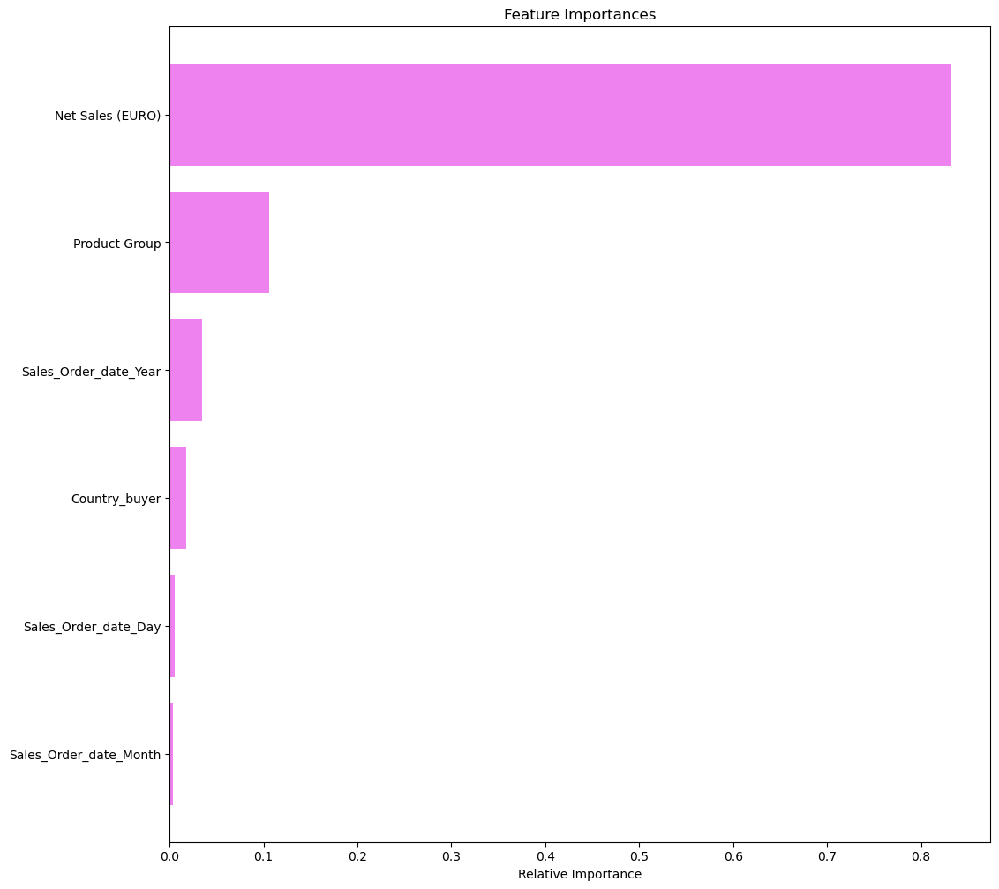

In [153]:
feature_names = X_train.columns
importances = dtree_tuned.feature_importances_
indices = np.argsort(importances)

plt.figure(figsize=(12,12))
plt.title('Feature Importances')
plt.barh(range(len(indices)), importances[indices], color='violet', align='center')
plt.yticks(range(len(indices)), [feature_names[i] for i in indices])
plt.xlabel('Relative Importance')
plt.show()

Net Sales (EURO) is the most important feature, followed by  Product Group and Country, for tuned decision tree model

### Random Forest Model

In [154]:
rf_estimator=RandomForestRegressor(random_state=1)
rf_estimator.fit(X_train,y_train)

RandomForestRegressor(random_state=1)

In [155]:
rf_estimator_model_train_perf = model_performance_regression(rf_estimator, X_train,y_train)
print("Training performance \n",rf_estimator_model_train_perf)

Training performance 
        RMSE       MAE  R-squared  Adj. R-squared      MAPE
0  0.822519  0.317057    0.97605        0.976039  7.925637


In [156]:
rf_estimator_model_test_perf = model_performance_regression(rf_estimator, X_test,y_test)
print("Testing performance \n",rf_estimator_model_test_perf)

Testing performance 
        RMSE       MAE  R-squared  Adj. R-squared       MAPE
0  2.653678  0.909012   0.819724         0.81953  21.476797


### Hyperparameter Tuning

In [157]:
# Choosing the type of classifier.
rf_tuned = RandomForestRegressor(random_state=1)

# Grid of parameters to choose from
parameters = {
                'max_depth':[ 6, 8 ],
                # 'max_features': ['auto','sqrt','log2',None],
                'n_estimators': [8, 10]
                #'min_samples_leaf': [1, 3, 5],
                #'min_samples_split':[2]
}


# Type of scoring used to compare parameter combinations
scorer = metrics.make_scorer(metrics.r2_score)

# Running the grid search
grid_obj = GridSearchCV(rf_tuned, parameters, scoring=scorer,cv=5)
grid_obj = grid_obj.fit(X_train, y_train)

# Setting the clf to the best combination of parameters
rf_tuned = grid_obj.best_estimator_

# Fitting the best algorithm to the data.
rf_tuned.fit(X_train, y_train)

RandomForestRegressor(max_depth=8, n_estimators=10, random_state=1)

In [158]:
rf_tuned_model_train_perf = model_performance_regression(rf_tuned, X_train, y_train)
print("Training performance \n",rf_tuned_model_train_perf)

Training performance 
        RMSE       MAE  R-squared  Adj. R-squared       MAPE
0  1.452131  0.734602   0.925352        0.925318  21.060402


In [159]:
rf_tuned_model_test_perf = model_performance_regression(rf_tuned, X_test, y_test)
print("Testing performance \n",rf_tuned_model_test_perf)

Testing performance 
        RMSE       MAE  R-squared  Adj. R-squared       MAPE
0  2.910911  0.943978    0.78308        0.782847  22.814033


In [160]:
# importance of features in the tree building ( The importance of a feature is computed as the
#(normalized) total reduction of the criterion brought by that feature. It is also known as the Gini importance )

print(pd.DataFrame(rf_tuned.feature_importances_, columns = ["Imp"], index = X_train.columns).sort_values(by = 'Imp', ascending = False))

                             Imp
Net Sales (EURO)        0.825707
Product Group           0.097569
Sales_Order_date_Year   0.034216
Sales_Order_date_Day    0.021844
Country_buyer           0.013443
Sales_Order_date_Month  0.007221


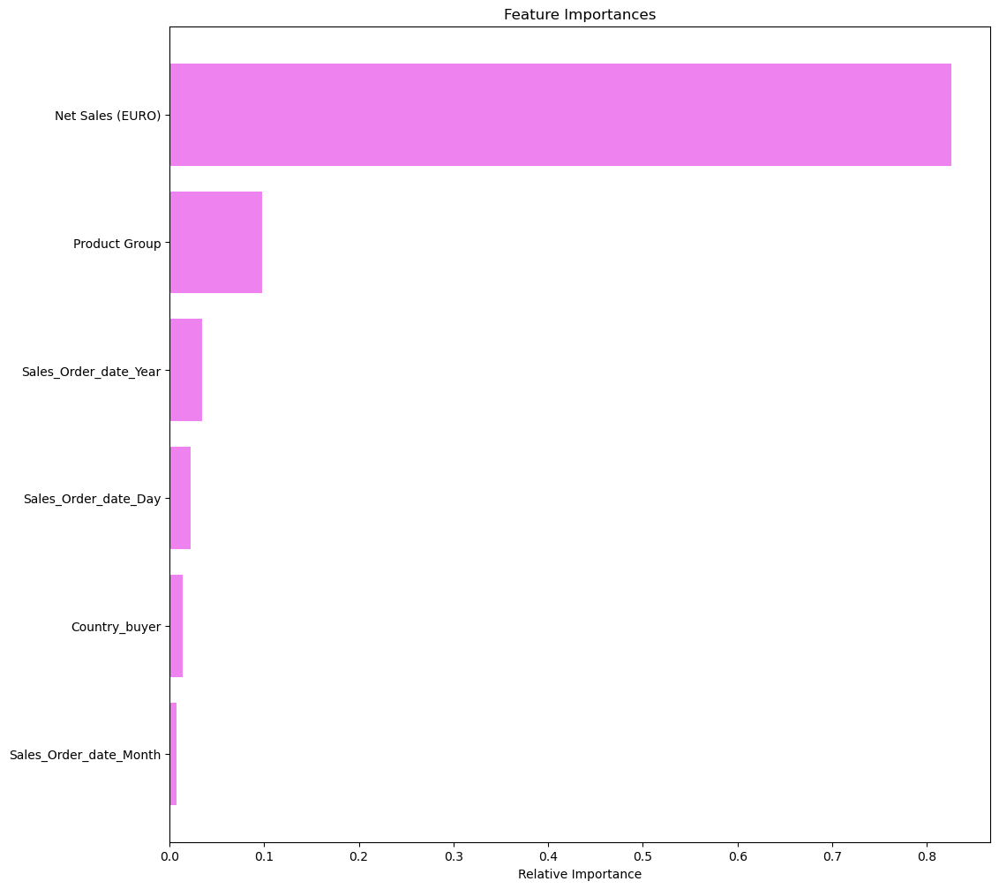

In [161]:
feature_names = X_train.columns
importances = rf_tuned.feature_importances_
indices = np.argsort(importances)

plt.figure(figsize=(12,12))
plt.title('Feature Importances')
plt.barh(range(len(indices)), importances[indices], color='violet', align='center')
plt.yticks(range(len(indices)), [feature_names[i] for i in indices])
plt.xlabel('Relative Importance')
plt.show()

## Boosting - Model Building and Hyperparameter Tuning

### Gradient Boosting Regressor

In [162]:
gb_estimator=GradientBoostingRegressor(random_state=1)
gb_estimator.fit(X_train,y_train)

GradientBoostingRegressor(random_state=1)

In [163]:
gb_estimator_model_train_perf = model_performance_regression(gb_estimator, X_train,y_train)
print("Training performance \n",gb_estimator_model_train_perf)

Training performance 
        RMSE       MAE  R-squared  Adj. R-squared       MAPE
0  1.618376  0.807994   0.907282        0.907239  24.077582


In [164]:
gb_estimator_model_test_perf = model_performance_regression(gb_estimator, X_test, y_test)
print("Testing performance \n",gb_estimator_model_test_perf)

Testing performance 
        RMSE       MAE  R-squared  Adj. R-squared       MAPE
0  2.748449  0.942235   0.806618         0.80641  25.027924


### Hyperparameter Tuning

In [165]:
# Choosing the type of classifier.
gb_tuned = GradientBoostingRegressor(random_state=1)

# Grid of parameters to choose from
parameters = {
            # 'n_estimators': np.arange(50,150,15),
            'n_estimators': [40,50,60],
            'learning_rate': [ 0.1, 1, 1.5],
              # 'subsample':[.001, .003, .005],
              # 'max_features':[0.9,1, 0.7],
               'max_features':[0.7,0.8],
              'max_depth':[4,6,7]
              # 'max_depth':[3,5,7,10]
              }

# Type of scoring used to compare parameter combinations
scorer = metrics.make_scorer(metrics.r2_score)

# Running the grid search
grid_obj = GridSearchCV(gb_tuned, parameters, cv=5)

# grid_obj = GridSearchCV(gb_tuned, parameters, scoring=scorer,cv=5)
grid_obj = grid_obj.fit(X_train, y_train)

# Setting the clf to the best combination of parameters
gb_tuned = grid_obj.best_estimator_

# Fitting the best algorithm to the data.
gb_tuned.fit(X_train, y_train)

GradientBoostingRegressor(max_depth=6, max_features=0.7, n_estimators=60,
                          random_state=1)

In [166]:
gb_tuned_model_train_perf = model_performance_regression(gb_tuned, X_train,y_train)
print("Training performance \n",gb_tuned_model_train_perf)

Training performance 
        RMSE       MAE  R-squared  Adj. R-squared       MAPE
0  1.163774  0.671713   0.952055        0.952033  21.096736


In [167]:
gb_tuned_model_test_perf = model_performance_regression(gb_tuned, X_test, y_test)
print("Testing performance \n",gb_tuned_model_test_perf)

Testing performance 
      RMSE       MAE  R-squared  Adj. R-squared       MAPE
0  2.4873  0.912542   0.841621        0.841451  23.036446


In [168]:
gb_tuned = grid_obj.best_estimator_
gb_tuned

GradientBoostingRegressor(max_depth=6, max_features=0.7, n_estimators=60,
                          random_state=1)

In [169]:
# importance of features in the tree building ( The importance of a feature is computed as the
#(normalized) total reduction of the criterion brought by that feature. It is also known as the Gini importance )

print(pd.DataFrame(gb_tuned.feature_importances_, columns = ["Imp"], index = X_train.columns).sort_values(by = 'Imp', ascending = False))

                             Imp
Net Sales (EURO)        0.820393
Product Group           0.095621
Sales_Order_date_Year   0.030810
Sales_Order_date_Day    0.019828
Sales_Order_date_Month  0.017054
Country_buyer           0.016295


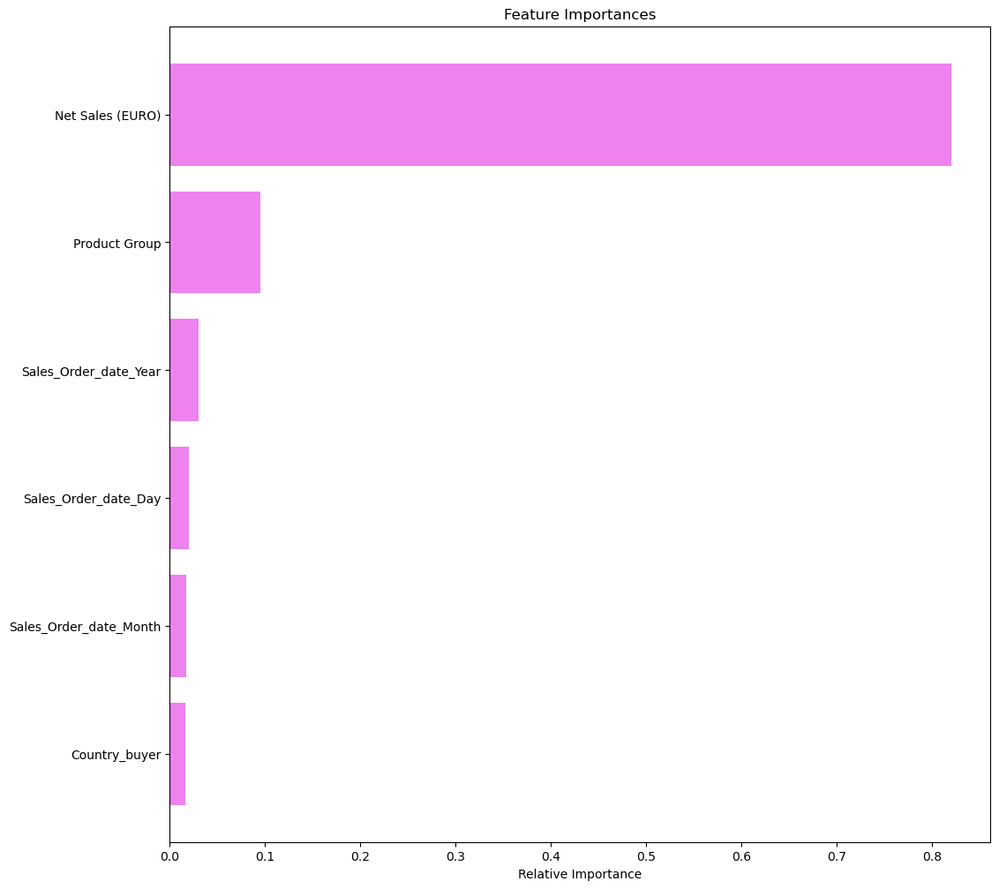

In [170]:
feature_names = X_train.columns
importances = gb_tuned.feature_importances_
indices = np.argsort(importances)

plt.figure(figsize=(12,12))
plt.title('Feature Importances')
plt.barh(range(len(indices)), importances[indices], color='violet', align='center')
plt.yticks(range(len(indices)), [feature_names[i] for i in indices])
plt.xlabel('Relative Importance')
plt.show()

### XGBoost Regressor

In [171]:
import xgboost

In [172]:
xgb_estimator=XGBRegressor(random_state=1, verbosity = 0)
xgb_estimator.fit(X_train,y_train)

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             feature_weights=None, gamma=None, grow_policy=None,
             importance_type=None, interaction_constraints=None,
             learning_rate=None, max_bin=None, max_cat_threshold=None,
             max_cat_to_onehot=None, max_delta_step=None, max_depth=None,
             max_leaves=None, min_child_weight=None, missing=nan,
             monotone_constraints=None, multi_strategy=None, n_estimators=None,
             n_jobs=None, num_parallel_tree=None, ...)

In [173]:
xgb_estimator_model_train_perf = model_performance_regression(xgb_estimator, X_train, y_train)
print("Training performance \n",xgb_estimator_model_train_perf)

Training performance 
        RMSE       MAE  R-squared  Adj. R-squared       MAPE
0  0.836162  0.527104   0.975249        0.975238  18.570587


In [174]:
xgb_estimator_model_test_perf = model_performance_regression(xgb_estimator, X_test,y_test)
print("Testing performance \n",xgb_estimator_model_test_perf)

Testing performance 
        RMSE       MAE  R-squared  Adj. R-squared       MAPE
0  2.700879  0.948194   0.813254        0.813053  23.373012


### Hyperparameter Tuning

In [175]:
# Choosing the type of classifier.
xgb_tuned = XGBRegressor(random_state=1, verbosity = 0)

# Grid of parameters to choose from
parameters = {
              'n_estimators': [50,60],
              'subsample':[0.7, 0.8,1],
              'learning_rate':[0.1,0.2,0.3],
              'gamma':[3, 4],
              'max_depth':[3,4],
              # 'reg_lambda': [0,1,10],
              'colsample_bytree':[0.8, 0.9, 1],
              'colsample_bylevel':[ 0.7, 0.8,0.9]
              }



# Type of scoring used to compare parameter combinations
scorer = metrics.make_scorer(metrics.r2_score)

# Running the grid search
grid_obj = GridSearchCV(xgb_tuned, parameters, scoring=scorer,cv=5)
grid_obj = grid_obj.fit(X_train, y_train)

# Setting the clf to the best combination of parameters
xgb_tuned = grid_obj.best_estimator_

# Fitting the best algorithm to the data.
xgb_tuned.fit(X_train, y_train)

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=0.7, colsample_bynode=None, colsample_bytree=1,
             device=None, early_stopping_rounds=None, enable_categorical=False,
             eval_metric=None, feature_types=None, feature_weights=None,
             gamma=3, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=0.2, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=4, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             multi_strategy=None, n_estimators=60, n_jobs=None,
             num_parallel_tree=None, ...)

In [176]:
xgb_tuned_model_train_perf = model_performance_regression(xgb_tuned, X_train, y_train)
print("Training performance \n",xgb_tuned_model_train_perf)

Training performance 
       RMSE       MAE  R-squared  Adj. R-squared       MAPE
0  1.53459  0.783498   0.916634        0.916595  22.878893


In [177]:
xgb_tuned_model_test_perf = model_performance_regression(xgb_tuned, X_test, y_test)
print("Testing performance \n",xgb_tuned_model_test_perf)

Testing performance 
        RMSE       MAE  R-squared  Adj. R-squared       MAPE
0  2.561053  0.928509   0.832089        0.831909  23.963199


In [178]:
# importance of features in the tree building ( The importance of a feature is computed as the
#(normalized) total reduction of the criterion brought by that feature. It is also known as the Gini importance )

print(pd.DataFrame(xgb_tuned.feature_importances_, columns = ["Imp"], index = X_train.columns).sort_values(by = 'Imp', ascending = False))

                             Imp
Net Sales (EURO)        0.658219
Product Group           0.191053
Sales_Order_date_Year   0.054973
Sales_Order_date_Day    0.033505
Sales_Order_date_Month  0.033045
Country_buyer           0.029205


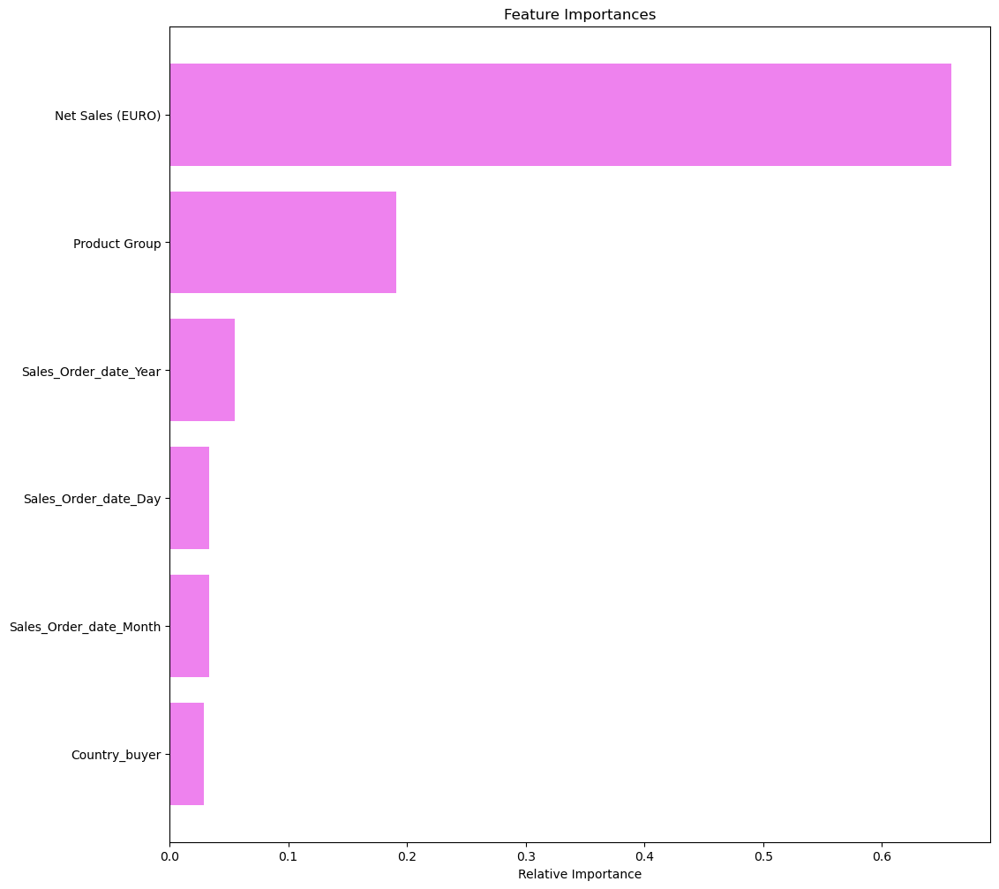

In [179]:
feature_names = X_train.columns
importances = xgb_tuned.feature_importances_
indices = np.argsort(importances)

plt.figure(figsize=(12,12))
plt.title('Feature Importances')
plt.barh(range(len(indices)), importances[indices], color='violet', align='center')
plt.yticks(range(len(indices)), [feature_names[i] for i in indices])
plt.xlabel('Relative Importance')
plt.show()

Model to be used: XGBoost with hyperparameter tuning.

In [180]:
estimators=[('Decision Tree', dtree_tuned),('Random Forest', rf_tuned),
           ('Gradient Boosting', gb_tuned)]
final_estimator=XGBRegressor(random_state=1)

In [181]:
stacking_estimator=StackingRegressor(estimators=estimators, final_estimator=final_estimator,cv=5)
stacking_estimator.fit(X_train,y_train)

StackingRegressor(cv=5,
                  estimators=[('Decision Tree',
                               DecisionTreeRegressor(max_depth=6,
                                                     min_impurity_decrease=0.001,
                                                     random_state=1)),
                              ('Random Forest',
                               RandomForestRegressor(max_depth=8,
                                                     n_estimators=10,
                                                     random_state=1)),
                              ('Gradient Boosting',
                               GradientBoostingRegressor(max_depth=6,
                                                         max_features=0.7,
                                                         n_estimators=60,
                                                         random_state=1))],
                  final_estimator=XGBRegressor...
                                               feature_weights=None, gamma=None,
                                               grow_policy=None,
                                               importance_type=None,
                                               interaction_constraints=None,
                                               learning_rate=None, max_bin=None,
                                               max_cat_threshold=None,
                                               max_cat_to_onehot=None,
                                               max_delta_step=None,
                                               max_depth=None, max_leaves=None,
                                               min_child_weight=None,
                                               missing=nan,
                                               monotone_constraints=None,
                                               multi_strategy=None,
                                               n_estimators=None, n_jobs=None,
                                               num_parallel_tree=None, ...))

In [182]:
stacking_estimator_model_train_perf = model_performance_regression(stacking_estimator, X_train, y_train)
print("Training performance \n",stacking_estimator_model_train_perf)

Training performance 
        RMSE       MAE  R-squared  Adj. R-squared       MAPE
0  2.229032  0.789953   0.824111         0.82403  19.990674


In [183]:
stacking_estimator_model_test_perf = model_performance_regression(stacking_estimator, X_test, y_test)
print("Testing performance \n",stacking_estimator_model_test_perf)

Testing performance 
        RMSE      MAE  R-squared  Adj. R-squared       MAPE
0  3.104512  0.95653   0.753267        0.753002  21.930474


Comparing all model

In [184]:
# training performance comparison

models_train_comp_df = pd.concat(
    [dtree_model_train_perf.T, dtree_tuned_model_train_perf.T, rf_estimator_model_train_perf.T,rf_tuned_model_train_perf.T,
    gb_estimator_model_train_perf.T,gb_tuned_model_train_perf.T,
    xgb_estimator_model_train_perf.T,xgb_tuned_model_train_perf.T,stacking_estimator_model_train_perf.T],
    axis=1,
)

models_train_comp_df.columns = [
    "Decision Tree",
    "Decision Tree Tuned",
    "Random Forest Estimator",
    "Random Forest Tuned",
    "Gradient Boost Estimator",
    "Gradient Boost Tuned",
    "XGB",
    "XGB Tuned",
    "Stacking Classifier"
]

print("Training performance comparison:")
models_train_comp_df

Training performance comparison:


,Decision Tree,Decision Tree Tuned,Random Forest Estimator,Random Forest Tuned,Gradient Boost Estimator,Gradient Boost Tuned,XGB,XGB Tuned,Stacking Classifier
RMSE,0.023159,1.671086,0.822519,1.452131,1.618376,1.163774,0.836162,1.534590,2.229032
MAE,0.000460,0.848312,0.317057,0.734602,0.807994,0.671713,0.527104,0.783498,0.789953
R-squared,0.999981,0.901144,0.976050,0.925352,0.907282,0.952055,0.975249,0.916634,0.824111
Adj. R-squared,0.999981,0.901098,0.976039,0.925318,0.907239,0.952033,0.975238,0.916595,0.824030
MAPE,0.030330,24.150599,7.925637,21.060402,24.077582,21.096736,18.570587,22.878893,19.990674


In [185]:
# Testing performance comparison

models_test_comp_df = pd.concat(
    [dtree_model_test_perf.T, dtree_tuned_model_test_perf.T, rf_estimator_model_test_perf.T,rf_tuned_model_test_perf.T,
    gb_estimator_model_test_perf.T,gb_tuned_model_test_perf.T,
    xgb_estimator_model_test_perf.T,xgb_tuned_model_test_perf.T,stacking_estimator_model_test_perf.T],
    axis=1,
)

models_test_comp_df.columns = [
    "Decision Tree",
    "Decision Tree Tuned",
    "Random Forest Estimator",
    "Random Forest Tuned",
    "Gradient Boost Estimator",
    "Gradient Boost Tuned",
    "XGB",
    "XGB Tuned",
    "Stacking Classifier"
]

print("Testing performance comparison:")
models_test_comp_df

Testing performance comparison:


,Decision Tree,Decision Tree Tuned,Random Forest Estimator,Random Forest Tuned,Gradient Boost Estimator,Gradient Boost Tuned,XGB,XGB Tuned,Stacking Classifier
RMSE,3.072535,3.166455,2.653678,2.910911,2.748449,2.487300,2.700879,2.561053,3.104512
MAE,1.126207,1.017920,0.909012,0.943978,0.942235,0.912542,0.948194,0.928509,0.956530
R-squared,0.758323,0.743322,0.819724,0.783080,0.806618,0.841621,0.813254,0.832089,0.753267
Adj. R-squared,0.758064,0.743047,0.819530,0.782847,0.806410,0.841451,0.813053,0.831909,0.753002
MAPE,24.610992,24.872212,21.476797,22.814033,25.027924,23.036446,23.373012,23.963199,21.930474


In [369]:
#checking random forest regressor model performance with the help of cross validation
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.metrics import r2_score, mean_squared_error
import numpy as np

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

model = RandomForestRegressor(
    n_estimators=200,
    max_depth=10,
    min_samples_split=5,
    min_samples_leaf=3,
    random_state=42,
    n_jobs=-1
)

model.fit(X_train, y_train)

y_train_pred = model.predict(X_train)
y_test_pred = model.predict(X_test)

train_r2 = r2_score(y_train, y_train_pred)
test_r2 = r2_score(y_test, y_test_pred)

cv_scores = cross_val_score(model, X, y, cv=5, scoring='r2')

print(f"Train R²: {train_r2:.4f}")
print(f"Test R²: {test_r2:.4f}")
print(f"Cross-Validated R² (avg): {cv_scores.mean():.4f}")
print(f"RMSE (Test): {np.sqrt(mean_squared_error(y_test, y_test_pred)):.2f}")


Train R²: 0.9028
Test R²: 0.8874
Cross-Validated R² (avg): 0.8038
RMSE (Test): 1.78


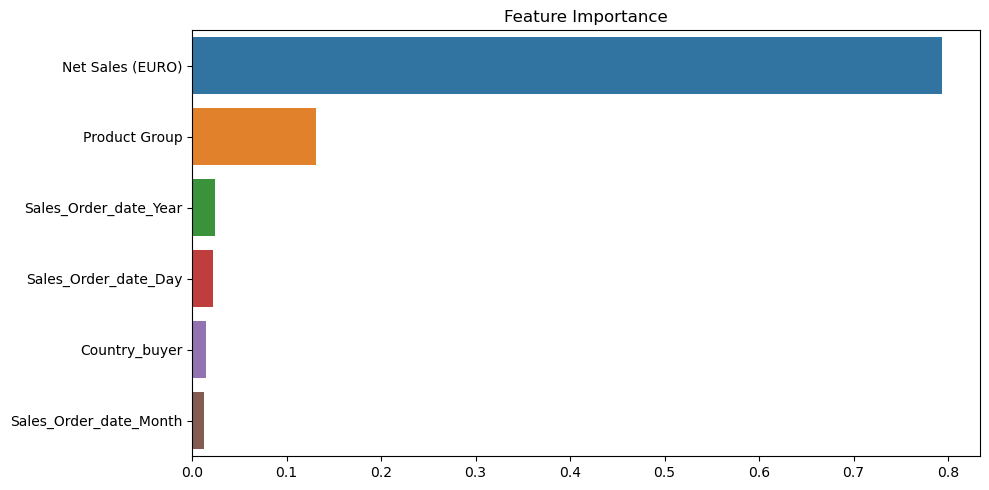

In [370]:
import matplotlib.pyplot as plt
import seaborn as sns

feat_imp = pd.Series(model.feature_importances_, index=X.columns).sort_values(ascending=False)
plt.figure(figsize=(10, 5))
sns.barplot(x=feat_imp.values, y=feat_imp.index)
plt.title('Feature Importance')
plt.tight_layout()
plt.show()


Prediction for Product = 1153

In [371]:
future_data_product1 = pd.DataFrame({
    'Net Sales (EURO)': [1033.78, 3174.56, 2074.20, 2001.43, 7436.80, 1782.25, 2082.25, 3826.80, 4100.60, 3220.90, 1982.25, 1390.90],
    'Product Group': [1153, 1153, 1153, 1153, 1153, 1153, 1153, 1153, 1153, 1153, 1153, 1153],
    'Country_buyer' : [15353,   770,   254,   566,   734,   799,   112,    73,    21, 5,    43,     7],
    'Sales_Order_date_Year': [2025, 2025, 2025, 2025, 2025, 2025, 2025, 2025, 2025, 2025, 2025, 2025],
    'Sales_Order_date_Month': [1, 2, 3, 4, 5, 6, 7,8, 9,10, 11, 12],
    'Sales_Order_date_Day': [31, 28, 31, 30, 31,30,31,31,30,31,30,31],
})
future_data_product1

,Net Sales (EURO),Product Group,Country_buyer,Sales_Order_date_Year,Sales_Order_date_Month,Sales_Order_date_Day
0,1033.78,1153,15353,2025,1,31
1,3174.56,1153,770,2025,2,28
2,2074.20,1153,254,2025,3,31
3,2001.43,1153,566,2025,4,30
4,7436.80,1153,734,2025,5,31
5,1782.25,1153,799,2025,6,30
6,2082.25,1153,112,2025,7,31
7,3826.80,1153,73,2025,8,31
8,4100.60,1153,21,2025,9,30
9,3220.90,1153,5,2025,10,31


In [372]:
next_month_pred = model.predict(future_data_product1)
next_month_pred

array([91.70629816, 91.70629816, 91.70629816, 91.70629816, 91.70629816,
       91.70629816, 91.70629816, 91.70629816, 91.70629816, 91.70629816,
       91.70629816, 91.70629816])

In [373]:
future_data_product1 ['Predicted_Sales_Volumn'] = next_month_pred

In [374]:
for index, row in future_data_product1.iterrows():
  print(f"Month: {row['Sales_Order_date_Month']}, Year:{row['Sales_Order_date_Year']}, Predicted Sales Volumn:{row['Predicted_Sales_Volumn']:.2f}")

Month: 1.0, Year:2025.0, Predicted Sales Volumn:91.71
Month: 2.0, Year:2025.0, Predicted Sales Volumn:91.71
Month: 3.0, Year:2025.0, Predicted Sales Volumn:91.71
Month: 4.0, Year:2025.0, Predicted Sales Volumn:91.71
Month: 5.0, Year:2025.0, Predicted Sales Volumn:91.71
Month: 6.0, Year:2025.0, Predicted Sales Volumn:91.71
Month: 7.0, Year:2025.0, Predicted Sales Volumn:91.71
Month: 8.0, Year:2025.0, Predicted Sales Volumn:91.71
Month: 9.0, Year:2025.0, Predicted Sales Volumn:91.71
Month: 10.0, Year:2025.0, Predicted Sales Volumn:91.71
Month: 11.0, Year:2025.0, Predicted Sales Volumn:91.71
Month: 12.0, Year:2025.0, Predicted Sales Volumn:91.71


In [375]:
original_data = copy_data[['Sales_Order_date_Month','Sales Volume (Unit)']]
original_data.head()

,Sales_Order_date_Month,Sales Volume (Unit)
1478,2,2
1477,2,2
157,4,9
1886,5,6
1117,6,12


In [376]:
future_data= future_data_product1[['Sales_Order_date_Month','Predicted_Sales_Volumn']]
future_data.head()

,Sales_Order_date_Month,Predicted_Sales_Volumn
0,1,91.706298
1,2,91.706298
2,3,91.706298
3,4,91.706298
4,5,91.706298


In [377]:
comp_data = pd.merge(original_data, future_data, on= 'Sales_Order_date_Month', how= 'inner')
comp_data

,Sales_Order_date_Month,Sales Volume (Unit),Predicted_Sales_Volumn
0,2,2,91.706298
1,2,2,91.706298
2,2,8,91.706298
3,2,6,91.706298
4,2,2,91.706298
...,...,...,...
18840,3,2,91.706298
18841,3,6,91.706298
18842,3,1,91.706298
18843,3,10,91.706298


<Axes: xlabel='Sales Volume (Unit)', ylabel='Count'>

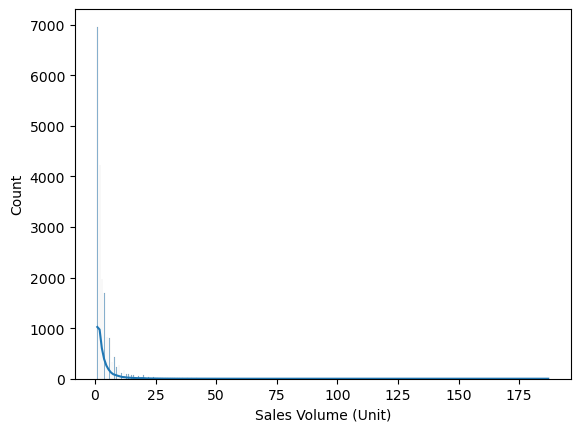

In [196]:
sns.histplot(data=copy_data, x='Sales Volume (Unit)', kde=True)

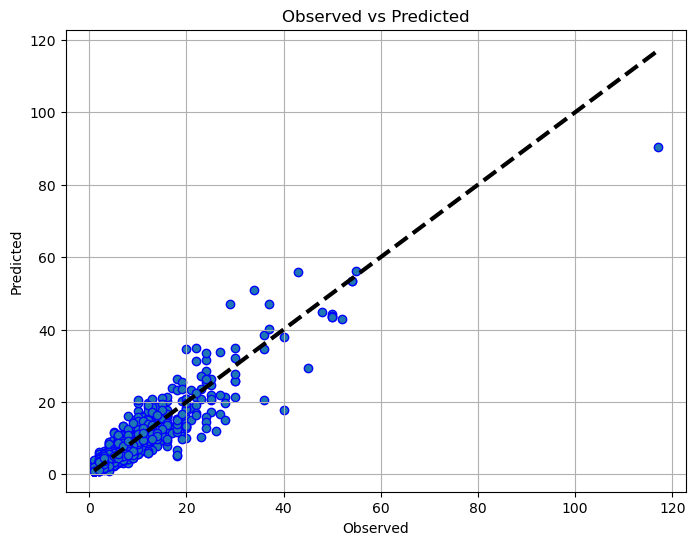

In [197]:
# So plot observed and predicted values of the test data for the best model i.e. model (rf regressor)
fig, ax = plt.subplots(figsize=(8, 6))
y_pred=model.predict(X_test)
ax.scatter(y_test, y_pred, edgecolors=(0, 0, 1))
ax.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=3)
ax.set_xlabel('Observed')
ax.set_ylabel('Predicted')
ax.set_title("Observed vs Predicted")
plt.grid()
plt.show()

Prediction for Product = 1157

In [198]:

future_data_product2 = pd.DataFrame({
    'Net Sales (EURO)': [1149.78, 3151.56, 3084.20, 2598.43, 1726.80,3282.25,	1382.25, 1986.80, 9300.60, 1420.90, 2182.25, 3420.90],
    'Product Group': [1157, 1157, 1157, 1157, 1157, 1157, 1157, 1157, 1157, 1157, 1157, 1157],
     'Country_buyer' : [15353,   770,   254,   566,   734,   799,   112,    73,    21, 5,    43,     7],
    'Sales_Order_date_Year': [2025, 2025, 2025, 2025, 2025, 2025, 2025, 2025, 2025, 2025, 2025, 2025],
    'Sales_Order_date_Month': [1, 2, 3, 4, 5, 6, 7,8, 9,10, 11, 12],
    'Sales_Order_date_Day': [31, 28, 31, 30, 31,30,31,31,30,31,30,31],
})
future_data_product2

,Net Sales (EURO),Product Group,Country_buyer,Sales_Order_date_Year,Sales_Order_date_Month,Sales_Order_date_Day
0,1149.78,1157,15353,2025,1,31
1,3151.56,1157,770,2025,2,28
2,3084.20,1157,254,2025,3,31
3,2598.43,1157,566,2025,4,30
4,1726.80,1157,734,2025,5,31
5,3282.25,1157,799,2025,6,30
6,1382.25,1157,112,2025,7,31
7,1986.80,1157,73,2025,8,31
8,9300.60,1157,21,2025,9,30
9,1420.90,1157,5,2025,10,31


In [199]:
next_month_pred2 = model.predict(future_data_product2)
next_month_pred2

array([91.70629816, 91.70629816, 91.70629816, 91.70629816, 91.70629816,
       91.70629816, 91.70629816, 91.70629816, 91.70629816, 91.70629816,
       91.70629816, 91.70629816])

In [200]:
future_data_product2 ['Predicted_Sales_Volumne'] = next_month_pred2

In [201]:
for index, row in future_data_product2.iterrows():
  print(f"Month: {row['Sales_Order_date_Month']}, Year:{row['Sales_Order_date_Year']}, Predicted Sales Volumne:{row['Predicted_Sales_Volumne']:.2f}")

Month: 1.0, Year:2025.0, Predicted Sales Volumne:91.71
Month: 2.0, Year:2025.0, Predicted Sales Volumne:91.71
Month: 3.0, Year:2025.0, Predicted Sales Volumne:91.71
Month: 4.0, Year:2025.0, Predicted Sales Volumne:91.71
Month: 5.0, Year:2025.0, Predicted Sales Volumne:91.71
Month: 6.0, Year:2025.0, Predicted Sales Volumne:91.71
Month: 7.0, Year:2025.0, Predicted Sales Volumne:91.71
Month: 8.0, Year:2025.0, Predicted Sales Volumne:91.71
Month: 9.0, Year:2025.0, Predicted Sales Volumne:91.71
Month: 10.0, Year:2025.0, Predicted Sales Volumne:91.71
Month: 11.0, Year:2025.0, Predicted Sales Volumne:91.71
Month: 12.0, Year:2025.0, Predicted Sales Volumne:91.71


Prediction for Product = 1154

In [203]:

future_data_product3 = pd.DataFrame({
    'Net Sales (EURO)': [941.78, 271.56, 984.20, 491.43, 526.80,882.25,	182.25, 926.80, 6300.60, 160.90, 292.25, 420.90],
    'Product Group': [1154, 1154, 1154, 1154, 1154, 1154, 1154, 1154, 1154, 1154, 1154, 1154],
    'Country_buyer' : [15353,   770,   254,   566,   734,   799,   112,    73,    21, 5,    43,     7],
    'Sales_Order_date_Year': [2025, 2025, 2025, 2025, 2025, 2025, 2025, 2025, 2025, 2025, 2025, 2025],
    'Sales_Order_date_Month': [1, 2, 3, 4, 5, 6, 7,8, 9,10, 11, 12],
    'Sales_Order_date_Day': [31, 28, 31, 30, 31,30,31,31,30,31,30,31],
})
future_data_product3

,Net Sales (EURO),Product Group,Country_buyer,Sales_Order_date_Year,Sales_Order_date_Month,Sales_Order_date_Day
0,941.78,1154,15353,2025,1,31
1,271.56,1154,770,2025,2,28
2,984.20,1154,254,2025,3,31
3,491.43,1154,566,2025,4,30
4,526.80,1154,734,2025,5,31
5,882.25,1154,799,2025,6,30
6,182.25,1154,112,2025,7,31
7,926.80,1154,73,2025,8,31
8,6300.60,1154,21,2025,9,30
9,160.90,1154,5,2025,10,31


In [204]:
next_month_pred3 = model.predict(future_data_product3)
next_month_pred3

array([91.70629816, 91.70629816, 91.70629816, 91.70629816, 91.70629816,
       91.70629816, 91.70629816, 91.70629816, 91.70629816, 91.70629816,
       91.70629816, 91.70629816])

In [205]:
future_data_product3 ['Predicted_Sales_Volumne'] = next_month_pred3

In [206]:
for index, row in future_data_product3.iterrows():
  print(f"Month: {row['Sales_Order_date_Month']}, Year:{row['Sales_Order_date_Year']}, Predicted Sales Volumne:{row['Predicted_Sales_Volumne']:.2f}")

Month: 1.0, Year:2025.0, Predicted Sales Volumne:91.71
Month: 2.0, Year:2025.0, Predicted Sales Volumne:91.71
Month: 3.0, Year:2025.0, Predicted Sales Volumne:91.71
Month: 4.0, Year:2025.0, Predicted Sales Volumne:91.71
Month: 5.0, Year:2025.0, Predicted Sales Volumne:91.71
Month: 6.0, Year:2025.0, Predicted Sales Volumne:91.71
Month: 7.0, Year:2025.0, Predicted Sales Volumne:91.71
Month: 8.0, Year:2025.0, Predicted Sales Volumne:91.71
Month: 9.0, Year:2025.0, Predicted Sales Volumne:91.71
Month: 10.0, Year:2025.0, Predicted Sales Volumne:91.71
Month: 11.0, Year:2025.0, Predicted Sales Volumne:91.71
Month: 12.0, Year:2025.0, Predicted Sales Volumne:91.71


In [6]:
data.columns

Index(['Sales Order date', 'Date of creation of customer order in SAP',
       'Sales Volume (Unit)', 'Net Sales (EURO)', 'Invoice Date',
       'Sales document number', 'Product Group', 'Product Name',
       'Costumer Number', 'Sold to Costumer', 'City_buyer', 'Country_buyer',
       'Ship to Party', 'City_delivery', 'Country_delivery'],
      dtype='object')

In [19]:
copy_data.columns

Index(['Sales Order date', 'Date of creation of customer order in SAP',
       'Sales Volume (Unit)', 'Net Sales (EURO)', 'Invoice Date',
       'Sales document number', 'Product Group', 'Product Name',
       'Costumer Number', 'Sold to Costumer', 'City_buyer', 'Country_buyer',
       'Ship to Party', 'City_delivery', 'Country_delivery'],
      dtype='object')

In [21]:
# Time series for each products , 

# Time Series

In [26]:
data1 = copy_data[copy_data['Product Name'] == 'Lufterhitzer TOP'][['Sales Order date', 'Sales Volume (Unit)']]
data1 #for the first product

,Sales Order date,Sales Volume (Unit)
0,2019-11-13,6
1,2019-11-19,8
2,2019-11-27,4
3,2019-11-28,3
4,2019-12-05,1
...,...,...
18831,2024-12-06,1
18832,2024-12-06,2
18841,2024-12-10,5
18842,2024-12-10,1


In [28]:
data2 = copy_data[copy_data['Product Name'] == 'Lufterhitzer TIP'][['Sales Order date', 'Sales Volume (Unit)']]
data2 #For the secon product 

,Sales Order date,Sales Volume (Unit)
7,2019-12-12,1
8,2019-12-12,1
9,2019-12-12,2
10,2019-12-12,5
13,2019-12-17,1
...,...,...
18824,2024-12-09,2
18834,2024-12-10,3
18836,2024-12-11,2
18837,2024-12-12,1


In [30]:
data3 = copy_data[copy_data['Product Name'] == 'Ultra'][['Sales Order date', 'Sales Volume (Unit)']]
data3 # for the third product 

,Sales Order date,Sales Volume (Unit)
6,2019-12-06,3
27,2019-12-10,5
30,2019-12-11,3
31,2019-12-12,3
32,2019-12-12,1
...,...,...
18833,2024-12-06,1
18835,2024-12-11,1
18838,2024-11-04,1
18839,2024-11-25,5


In [114]:
data1['Sales Order date'] = pd.to_datetime(data1['Sales Order date'], errors = 'coerce') 
# by using errors = 'coerce' we ensure that even if there are any problematic date strings in the data frame column the 
# conversion process will continue with out halting due to errors. Instread it will mark those problematic entries as 
# missing values (Nat (Not a time) - this representes missing or undefined values) allowing us to identify and handle them 
# appropriately. 

In [115]:
data1.isnull().sum()

Sales Order date       0
Sales Volume (Unit)    0
dtype: int64

In [116]:
data1.sort_values(by=['Sales Order date'], inplace=True, ascending=True)

In [117]:
data1

,Sales Order date,Sales Volume (Unit)
1477,2019-02-02,2
157,2019-04-25,9
1886,2019-05-21,6
1117,2019-06-02,12
1538,2019-06-03,7
...,...,...
18825,2024-12-09,1
18795,2024-12-09,2
18813,2024-12-09,1
18841,2024-12-10,5


In [118]:
data1['Sales Order date'] = data1['Sales Order date'].dt.strftime('%Y-%m-%d')

In [119]:
data1.reset_index(inplace = True)

In [120]:
# Plot the train and test data sets
train_size = int(len(data1) * 0.8)
train_data, test_data = data1[:train_size], data1[train_size:]

<Axes: >

Error in callback <function _draw_all_if_interactive at 0x000002009364F4C0> (for post_execute):



KeyboardInterrupt



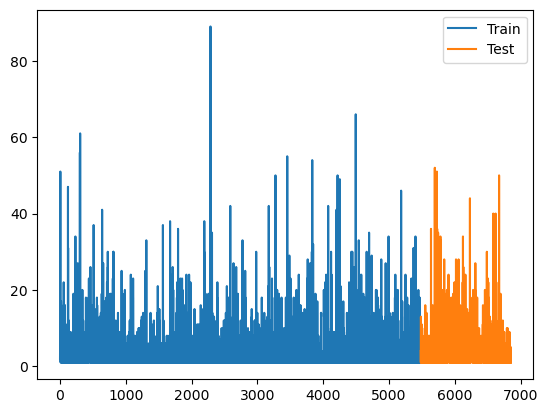

In [121]:
train_data['Sales Volume (Unit)'].plot(legend=True,label='Train')
test_data['Sales Volume (Unit)'].plot(legend=True,label='Test')

In [123]:
# using additive model:
import statsmodels.api as sm

decompose = sm.tsa.seasonal_decompose(data1['Sales Volume (Unit)'], model = 'additive', period = 12)

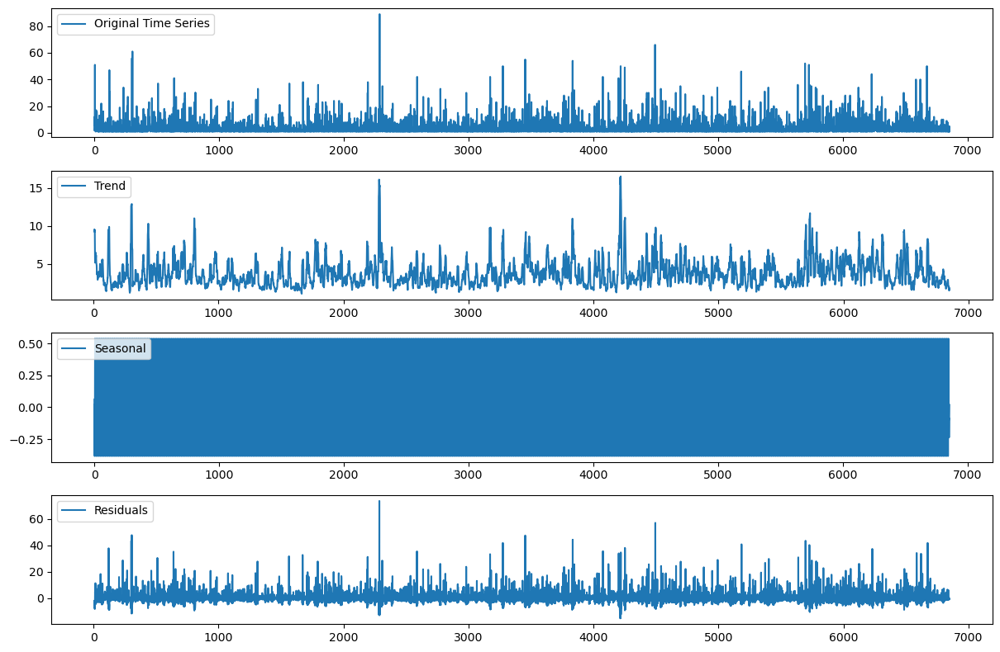

In [124]:
plt.figure(figsize=(12, 8))
plt.subplot(411)
plt.plot(data1['Sales Volume (Unit)'], label='Original Time Series')
plt.legend(loc='upper left')

plt.subplot(412)
plt.plot(decompose.trend, label='Trend')
plt.legend(loc='upper left')

plt.subplot(413)
plt.plot(decompose.seasonal, label='Seasonal')
plt.legend(loc='upper left')

plt.subplot(414)
plt.plot(decompose.resid, label='Residuals')
plt.legend(loc='upper left')

plt.tight_layout()
plt.show()

In [134]:
# checking stationarity
from statsmodels.tsa.stattools import adfuller
import statsmodels.api as sm

In [135]:
# Checking the stationarity for data with help of ADF test (Augmented Dickey Fuller Test)
def test_stationarity(df):
    dftest = adfuller(train_data['Sales Volume (Unit)'], autolag = "AIC")
    dfoutput = pd.DataFrame(dftest[0:4], 
                            index=['Test Statistic','p-value','Lags Used','Number of Observations'])
    for key,value in dftest[4].items(): dfoutput['Critical Value (%s)'%key] = value
    print(dfoutput)
    print('AIC:',dftest)
#p< 0.05 (5%) then we can infer that the test data is stationary

In [136]:
test_stationarity(train_data['Sales Volume (Unit)'])

                                  0  Critical Value (1%)  Critical Value (5%)  \
Test Statistic           -25.067213            -3.431545            -2.862068   
p-value                    0.000000            -3.431545            -2.862068   
Lags Used                  6.000000            -3.431545            -2.862068   
Number of Observations  5477.000000            -3.431545            -2.862068   

                        Critical Value (10%)  
Test Statistic                     -2.567051  
p-value                            -2.567051  
Lags Used                          -2.567051  
Number of Observations             -2.567051  
AIC: (-25.067213319867648, 0.0, 6, 5477, {'1%': -3.4315445166084517, '5%': -2.8620678572915317, '10%': -2.5670509773365}, 33677.81002408956)


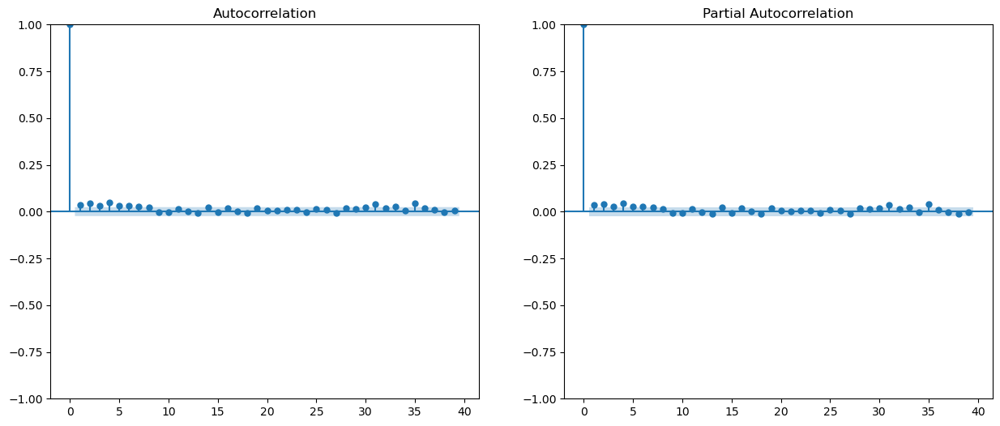

In [139]:
# Applying acf (autocorrelation function) and pacf (partial autocorrelation function)
fig = plt.figure(figsize = (15,6))
ax1 = fig.add_subplot(121)
fig = sm.graphics.tsa.plot_acf(data1['Sales Volume (Unit)'].values, ax = ax1)

ax2 = fig.add_subplot(122)
fig = sm.graphics.tsa.plot_pacf(data1['Sales Volume (Unit)'].values, ax = ax2)

<Axes: xlabel='Sales Order date'>

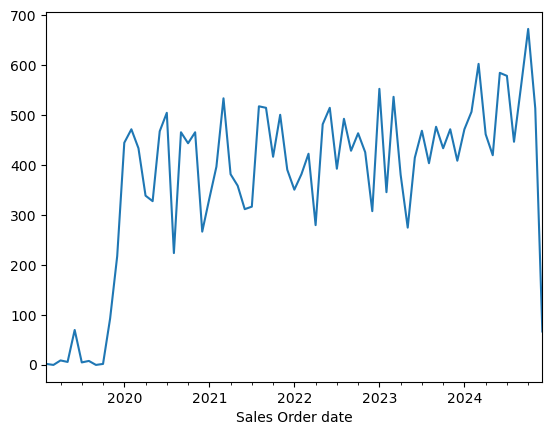

In [413]:
monthly_sales.plot(label='Actual Sales')
#clear seasonality of data

MSE: 9172.5724937318
RMSE: 95.77354798550485

 Combined Sales Volume (2020–2025):
            Actual  Fitted_ARIMA  Forecast_2025
2020-01-31   445.0      0.000000            NaN
2020-02-29   472.0    441.984155            NaN
2020-03-31   434.0    459.010988            NaN
2020-04-30   339.0    437.910223            NaN
2020-05-31   328.0    420.013427            NaN
...            ...           ...            ...
2025-08-31     NaN           NaN     444.358112
2025-09-30     NaN           NaN     494.917235
2025-10-31     NaN           NaN     460.967550
2025-11-30     NaN           NaN     496.801805
2025-12-31     NaN           NaN     454.062905

[72 rows x 3 columns]


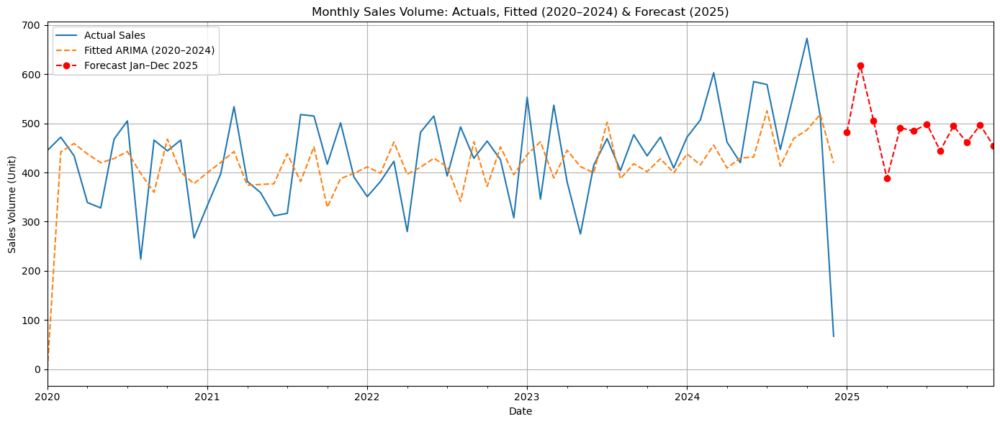

In [430]:
from statsmodels.tsa.arima.model import ARIMA
from sklearn.metrics import mean_squared_error

data1 = copy_data[copy_data['Product Name'] == 'Lufterhitzer TOP'][['Sales Order date', 'Sales Volume (Unit)']]
data1['Sales Order date'] = pd.to_datetime(data1['Sales Order date'])
data1 = data1.set_index('Sales Order date')

monthly_sales = data1['Sales Volume (Unit)'].resample('M').sum() #aggregation to monthly sales vol data

monthly_sales_filtered = monthly_sales['2020':'2024']

model = ARIMA(monthly_sales_filtered, order=(3, 1, 2))
arma = model.fit()

pred_arma = arma.fittedvalues

mse = mean_squared_error(monthly_sales_filtered[1:], pred_arma[1:])
rms = np.sqrt(mse)
print('MSE:', mse)
print('RMSE:', rms)

forecast_steps = 12
start_forecast_date = pd.to_datetime('2025-01-31')
future_dates = pd.date_range(start=start_forecast_date, periods=forecast_steps, freq='M')
forecast_values = arma.forecast(steps=forecast_steps)
forecast_series = pd.Series(forecast_values.values, index=future_dates)

df_combined = pd.DataFrame({
    'Actual': monthly_sales_filtered, #data
    'Fitted_ARIMA': pred_arma #model
})

df_forecast = pd.DataFrame({'Forecast_2025': forecast_series})
df_all = pd.concat([df_combined, df_forecast], axis=0)

print("\n Combined Sales Volume (2020–2025):")
print(df_all)

df_all.to_csv("monthly_sales_forecast_2020_2025.csv") #after running this line you will get the downloaded data for actuals, model results and future predictions in your Home Page
#From there you need to download it and check results.

plt.figure(figsize=(14, 6))
monthly_sales_filtered.plot(label='Actual Sales')
pred_arma.plot(label='Fitted ARIMA (2020–2024)', style='--')
forecast_series.plot(label='Forecast Jan–Dec 2025', linestyle='--', marker='o', color='red')

plt.title("Monthly Sales Volume: Actuals, Fitted (2020–2024) & Forecast (2025)")
plt.xlabel("Date")
plt.ylabel("Sales Volume (Unit)")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


In [423]:
#  Check the residuals for ARMA model-Model Validation Step

from pandas import DataFrame
residuals = DataFrame(arma.resid)
residuals

,0
Sales Order date,
2020-01-31,445.000000
2020-02-29,30.015845
2020-03-31,-25.010988
2020-04-30,-98.910223
2020-05-31,-92.013427
2020-06-30,39.461489
2020-07-31,62.258451
2020-08-31,-174.037684
2020-09-30,106.162555


<Axes: ylabel='Density'>

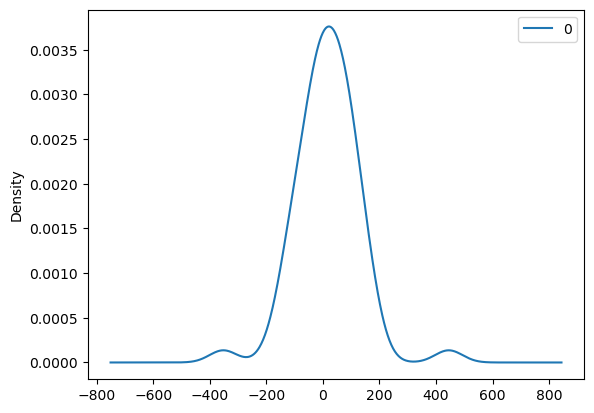

In [424]:
residuals.plot(kind = 'kde')

In [425]:
residuals.describe() #summary statistics of residuals from time series model

,0
count,60.000000
mean,16.496341
std,110.689597
min,-352.524098
25%,-35.015429
50%,15.954820
75%,86.359447
max,445.000000


In [426]:
# Durbin Watson test with arma.resid values
sm.stats.durbin_watson(residuals.values)

array([1.53693691])

In [427]:
# Durbin watson output value is well wthin the acceptable range which is 1.5 to 2.5

In [428]:
# Ljung box test 
from statsmodels.stats.diagnostic import acorr_ljungbox

In [431]:
# model is predicted using past 10 historical data
acorr_ljungbox(residuals, lags = 10)

,lb_stat,lb_pvalue
1,0.003106,0.955554
2,0.193801,0.907646
3,0.506012,0.917569
4,1.498912,0.826834
5,1.846566,0.869942
6,2.100828,0.910196
7,2.181297,0.949128
8,2.464582,0.963362
9,2.833641,0.970527
10,2.842956,0.984882


In [32]:
data2['Sales Order date'] = pd.to_datetime(data2['Sales Order date'], errors = 'coerce') 
# by using errors = 'coerce' we ensure that even if there are any problematic date strings in the data frame column the 
# conversion process will continue with out halting due to errors. Instread it will mark those problematic entries as 
# missing values (Nat (Not a time) - this representes missing or undefined values) allowing us to identify and handle them 
# appropriately. 

In [34]:
data2.isnull().sum()

Sales Order date       0
Sales Volume (Unit)    0
dtype: int64

In [36]:
data2

,Sales Order date,Sales Volume (Unit)
7,2019-12-12,1
8,2019-12-12,1
9,2019-12-12,2
10,2019-12-12,5
13,2019-12-17,1
...,...,...
18824,2024-12-09,2
18834,2024-12-10,3
18836,2024-12-11,2
18837,2024-12-12,1


In [38]:
data2['Sales Order date'] = data2['Sales Order date'].dt.strftime('%Y-%m-%d')

In [40]:
data2.reset_index(inplace = True)

In [42]:
# Plot the train and test data sets
train_size = int(len(data2) * 0.8)
train_data, test_data = data2[:train_size], data2[train_size:]

<Axes: >

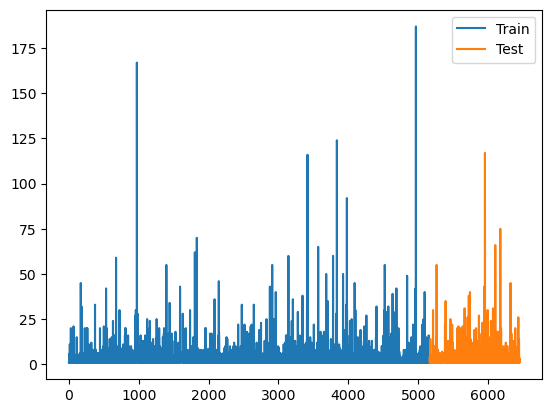

In [44]:
train_data['Sales Volume (Unit)'].plot(legend=True,label='Train')
test_data['Sales Volume (Unit)'].plot(legend=True,label='Test')

In [46]:
# using additive model:
import statsmodels.api as sm

decompose = sm.tsa.seasonal_decompose(data2['Sales Volume (Unit)'], model = 'additive', period = 12)

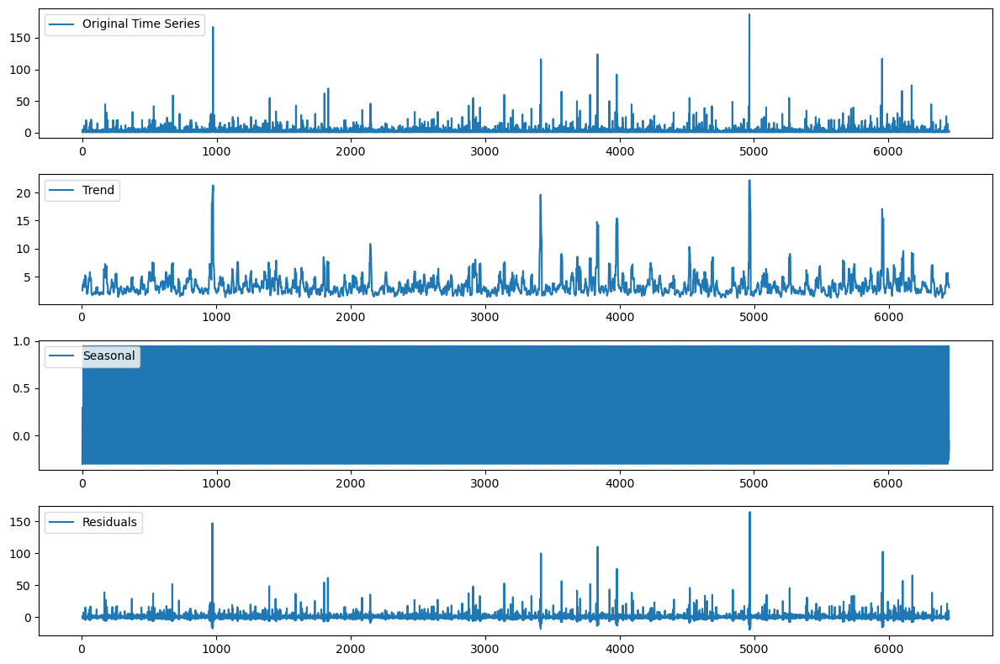

In [48]:

plt.figure(figsize=(12, 8))
plt.subplot(411)
plt.plot(data2['Sales Volume (Unit)'], label='Original Time Series')
plt.legend(loc='upper left')

plt.subplot(412)
plt.plot(decompose.trend, label='Trend')
plt.legend(loc='upper left')

plt.subplot(413)
plt.plot(decompose.seasonal, label='Seasonal')
plt.legend(loc='upper left')

plt.subplot(414)
plt.plot(decompose.resid, label='Residuals')
plt.legend(loc='upper left')

plt.tight_layout()
plt.show()

In [50]:
# checking stationarity
from statsmodels.tsa.stattools import adfuller
import statsmodels.api as sm

In [52]:
# Checking the stationarity for data with help of ADF test (Augmented Dickey Fuller Test)
def test_stationarity(df):
    dftest = adfuller(train_data['Sales Volume (Unit)'], autolag = "AIC")
    dfoutput = pd.DataFrame(dftest[0:4], 
                            index=['Test Statistic','p-value','Lags Used','Number of Observations'])
    for key,value in dftest[4].items(): dfoutput['Critical Value (%s)'%key] = value
    print(dfoutput)
    print('AIC:',dftest)
#p< 0.05 (5%) then we can infer that the test data is stationary

In [54]:
test_stationarity(train_data['Sales Volume (Unit)'])

                                  0  Critical Value (1%)  Critical Value (5%)  \
Test Statistic           -29.821427            -3.431618              -2.8621   
p-value                    0.000000            -3.431618              -2.8621   
Lags Used                  4.000000            -3.431618              -2.8621   
Number of Observations  5159.000000            -3.431618              -2.8621   

                        Critical Value (10%)  
Test Statistic                     -2.567068  
p-value                            -2.567068  
Lags Used                          -2.567068  
Number of Observations             -2.567068  
AIC: (-29.821426961138286, 0.0, 4, 5159, {'1%': -3.4316181831199515, '5%': -2.8621004036065294, '10%': -2.5670683028659362}, 33985.854707369435)


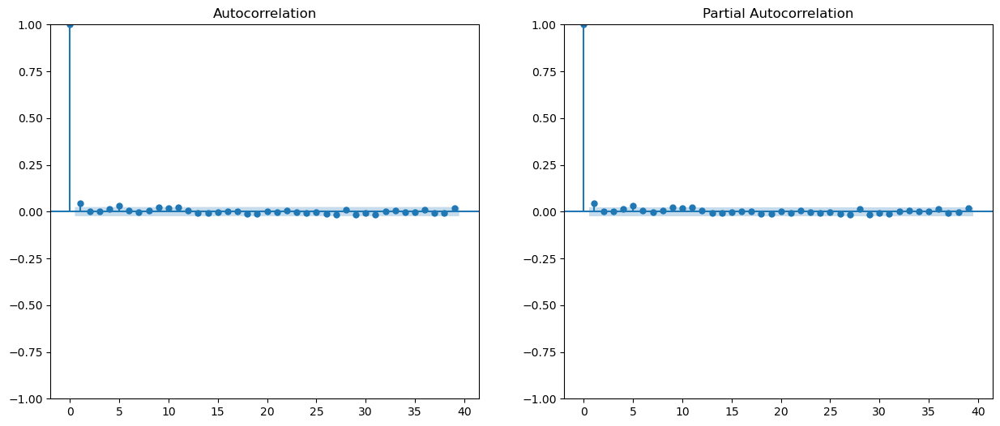

In [56]:
# Applying acf (autocorrelation function) and pacf (partial autocorrelation function)
fig = plt.figure(figsize = (15,6))
ax1 = fig.add_subplot(121)
fig = sm.graphics.tsa.plot_acf(data2['Sales Volume (Unit)'].values, ax = ax1)

ax2 = fig.add_subplot(122)
fig = sm.graphics.tsa.plot_pacf(data2['Sales Volume (Unit)'].values, ax = ax2)

<Axes: xlabel='Sales Order date'>

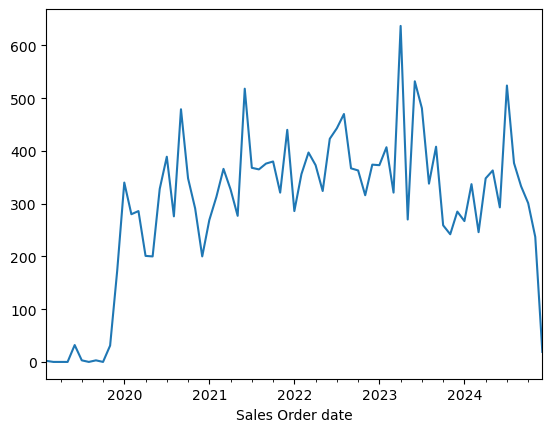

In [119]:
monthly_sales.plot(label='Actual Sales')
#clear seasonality of data

MSE: 17264.565799528773
RMSE: 131.39469471606824

 Combined Sales Volume (2020–2025):
            Actual  Fitted_ARIMA  Forecast_2025
2020-01-31   671.0      0.000000            NaN
2020-02-29   339.0    663.309890            NaN
2020-03-31   367.0    496.980139            NaN
2020-04-30   239.0    343.487481            NaN
2020-05-31   301.0    382.476341            NaN
...            ...           ...            ...
2025-08-31     NaN           NaN     250.546011
2025-09-30     NaN           NaN     274.691422
2025-10-31     NaN           NaN     254.945860
2025-11-30     NaN           NaN     272.126484
2025-12-31     NaN           NaN     257.747314

[72 rows x 3 columns]


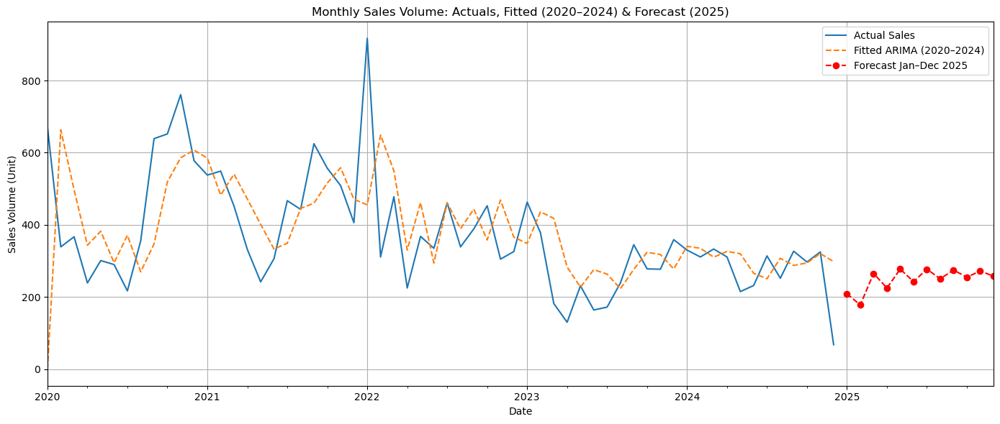

In [60]:
from statsmodels.tsa.arima.model import ARIMA
from sklearn.metrics import mean_squared_error

data2 = copy_data[copy_data['Product Name'] == 'Lufterhitzer TIP'][['Sales Order date', 'Sales Volume (Unit)']]
data2['Sales Order date'] = pd.to_datetime(data2['Sales Order date'])
data2 = data2.set_index('Sales Order date')

monthly_sales = data2['Sales Volume (Unit)'].resample('M').sum() #aggregation to monthly sales vol data

monthly_sales_filtered = monthly_sales['2020':'2024']

model = ARIMA(monthly_sales_filtered, order=(3, 1, 2))
arma = model.fit()

pred_arma = arma.fittedvalues

mse = mean_squared_error(monthly_sales_filtered[1:], pred_arma[1:])
rms = np.sqrt(mse)
print('MSE:', mse)
print('RMSE:', rms)

forecast_steps = 12
start_forecast_date = pd.to_datetime('2025-01-31')
future_dates = pd.date_range(start=start_forecast_date, periods=forecast_steps, freq='M')
forecast_values = arma.forecast(steps=forecast_steps)
forecast_series = pd.Series(forecast_values.values, index=future_dates)

df_combined = pd.DataFrame({
    'Actual': monthly_sales_filtered, #data
    'Fitted_ARIMA': pred_arma #model
})

df_forecast = pd.DataFrame({'Forecast_2025': forecast_series})
df_all = pd.concat([df_combined, df_forecast], axis=0)

print("\n Combined Sales Volume (2020–2025):")
print(df_all)

df_all.to_csv("monthly_sales_forecast_2020_2025.csv") #after running this line you will get the downloaded data for actuals, model results and future predictions in your Home Page
#From there you need to download it and check results.

plt.figure(figsize=(14, 6))
monthly_sales_filtered.plot(label='Actual Sales')
pred_arma.plot(label='Fitted ARIMA (2020–2024)', style='--')
forecast_series.plot(label='Forecast Jan–Dec 2025', linestyle='--', marker='o', color='red')

plt.title("Monthly Sales Volume: Actuals, Fitted (2020–2024) & Forecast (2025)")
plt.xlabel("Date")
plt.ylabel("Sales Volume (Unit)")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


In [62]:
#  Check the residuals for ARMA model-Model Validation Step

from pandas import DataFrame
residuals = DataFrame(arma.resid)
residuals

,0
Sales Order date,
2020-01-31,671.000000
2020-02-29,-324.309890
2020-03-31,-129.980139
2020-04-30,-104.487481
2020-05-31,-81.476341
2020-06-30,-4.928439
2020-07-31,-154.136063
2020-08-31,86.130021
2020-09-30,291.965357


<Axes: ylabel='Density'>

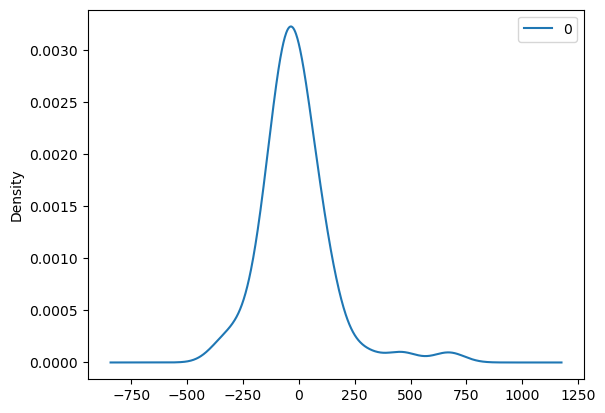

In [64]:
residuals.plot(kind = 'kde')

In [66]:
residuals.describe() #summary statistics of residuals from time series model

,0
count,60.000000
mean,-12.930907
std,157.244163
min,-337.815217
25%,-92.014877
50%,-31.447510
75%,40.891600
max,671.000000


In [68]:
# Durbin Watson test with arma.resid values
sm.stats.durbin_watson(residuals.values)

array([1.88853153])

In [70]:
# Ljung box test 
from statsmodels.stats.diagnostic import acorr_ljungbox

In [72]:
# model is predicted using past 10 historical data
acorr_ljungbox(residuals, lags = 10)

,lb_stat,lb_pvalue
1,1.020994,0.312283
2,1.183929,0.553239
3,1.185420,0.756503
4,1.253388,0.869233
5,1.898453,0.863010
6,3.569394,0.734715
7,3.937040,0.787000
8,3.947030,0.861871
9,4.153946,0.900991
10,5.288108,0.871120


In [74]:
# for product 3

In [76]:
data3['Sales Order date'] = pd.to_datetime(data3['Sales Order date'], errors = 'coerce') 
# by using errors = 'coerce' we ensure that even if there are any problematic date strings in the data frame column the 
# conversion process will continue with out halting due to errors. Instread it will mark those problematic entries as 
# missing values (Nat (Not a time) - this representes missing or undefined values) allowing us to identify and handle them 
# appropriately. 

In [78]:
data3.isnull().sum()

Sales Order date       0
Sales Volume (Unit)    0
dtype: int64

In [80]:
data3

,Sales Order date,Sales Volume (Unit)
6,2019-12-06,3
27,2019-12-10,5
30,2019-12-11,3
31,2019-12-12,3
32,2019-12-12,1
...,...,...
18833,2024-12-06,1
18835,2024-12-11,1
18838,2024-11-04,1
18839,2024-11-25,5


In [82]:
data3['Sales Order date'] = data3['Sales Order date'].dt.strftime('%Y-%m-%d')

In [84]:
data3.reset_index(inplace = True)

In [86]:
# Plot the train and test data sets
train_size = int(len(data3) * 0.8)
train_data, test_data = data3[:train_size], data3[train_size:]

<Axes: >

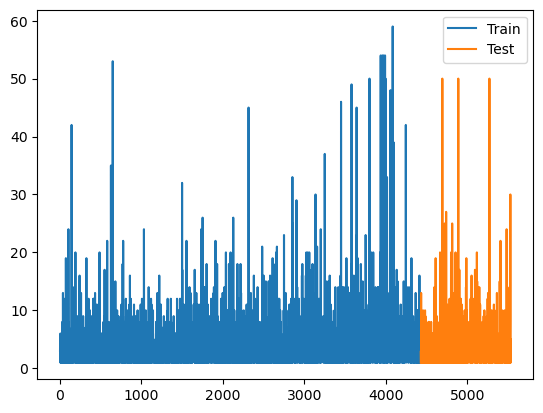

In [88]:
train_data['Sales Volume (Unit)'].plot(legend=True,label='Train')
test_data['Sales Volume (Unit)'].plot(legend=True,label='Test')

In [90]:
# using additive model:
import statsmodels.api as sm

decompose = sm.tsa.seasonal_decompose(data3['Sales Volume (Unit)'], model = 'additive', period = 12)

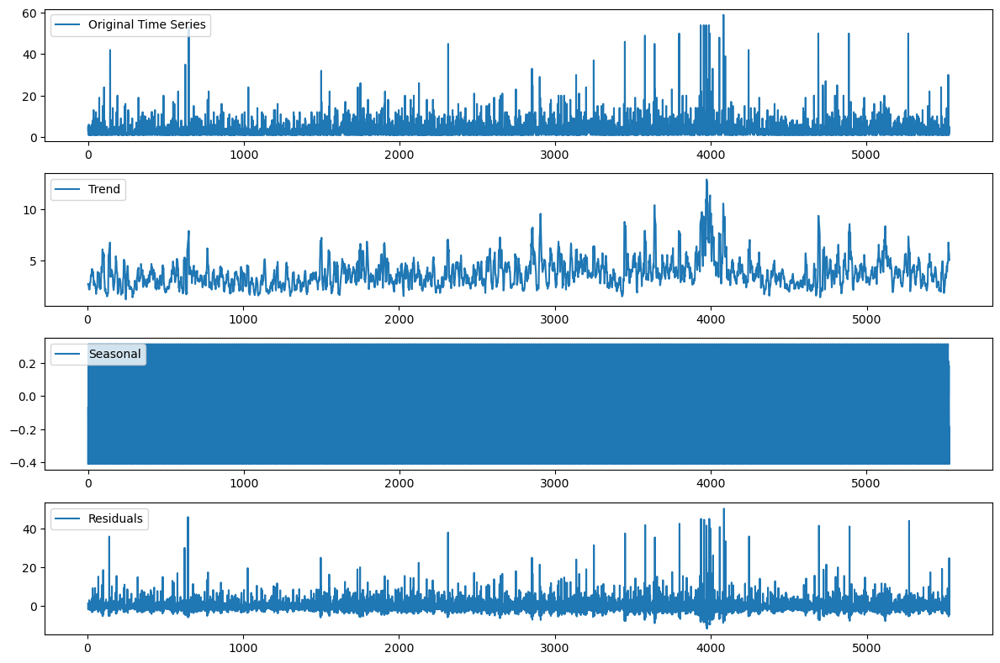

In [92]:

plt.figure(figsize=(12, 8))
plt.subplot(411)
plt.plot(data3['Sales Volume (Unit)'], label='Original Time Series')
plt.legend(loc='upper left')

plt.subplot(412)
plt.plot(decompose.trend, label='Trend')
plt.legend(loc='upper left')

plt.subplot(413)
plt.plot(decompose.seasonal, label='Seasonal')
plt.legend(loc='upper left')

plt.subplot(414)
plt.plot(decompose.resid, label='Residuals')
plt.legend(loc='upper left')

plt.tight_layout()
plt.show()

In [94]:
# checking stationarity
from statsmodels.tsa.stattools import adfuller
import statsmodels.api as sm

In [96]:
# Checking the stationarity for data with help of ADF test (Augmented Dickey Fuller Test)
def test_stationarity(df):
    dftest = adfuller(train_data['Sales Volume (Unit)'], autolag = "AIC")
    dfoutput = pd.DataFrame(dftest[0:4], 
                            index=['Test Statistic','p-value','Lags Used','Number of Observations'])
    for key,value in dftest[4].items(): dfoutput['Critical Value (%s)'%key] = value
    print(dfoutput)
    print('AIC:',dftest)
#p< 0.05 (5%) then we can infer that the test data is stationary

In [98]:
test_stationarity(train_data['Sales Volume (Unit)'])

                                   0  Critical Value (1%)  \
Test Statistic         -9.717437e+00            -3.431836   
p-value                 9.744658e-17            -3.431836   
Lags Used               2.300000e+01            -3.431836   
Number of Observations  4.404000e+03            -3.431836   

                        Critical Value (5%)  Critical Value (10%)  
Test Statistic                    -2.862197             -2.567119  
p-value                           -2.862197             -2.567119  
Lags Used                         -2.862197             -2.567119  
Number of Observations            -2.862197             -2.567119  
AIC: (-9.717437184649368, 9.744658425026861e-17, 23, 4404, {'1%': -3.4318357210786696, '5%': -2.8621965085066203, '10%': -2.567119463630619}, 25794.240156724452)


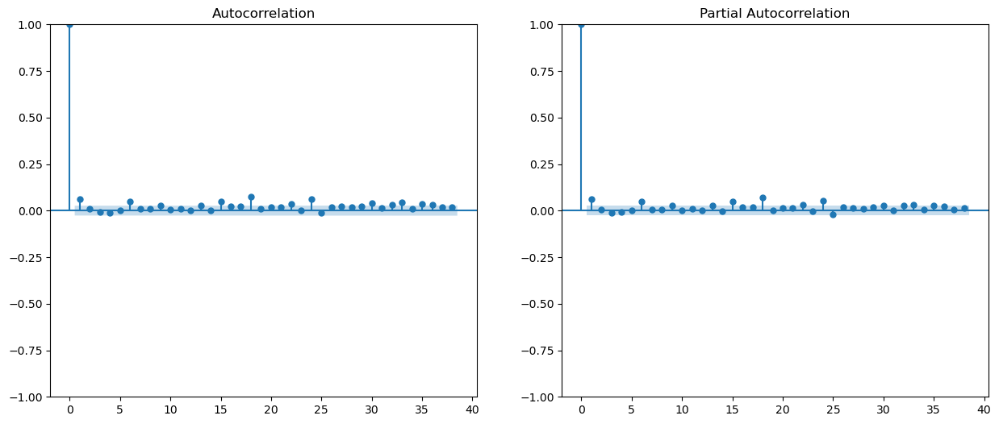

In [100]:
# Applying acf (autocorrelation function) and pacf (partial autocorrelation function)
fig = plt.figure(figsize = (15,6))
ax1 = fig.add_subplot(121)
fig = sm.graphics.tsa.plot_acf(data3['Sales Volume (Unit)'].values, ax = ax1)

ax2 = fig.add_subplot(122)
fig = sm.graphics.tsa.plot_pacf(data3['Sales Volume (Unit)'].values, ax = ax2)

<Axes: xlabel='Sales Order date'>

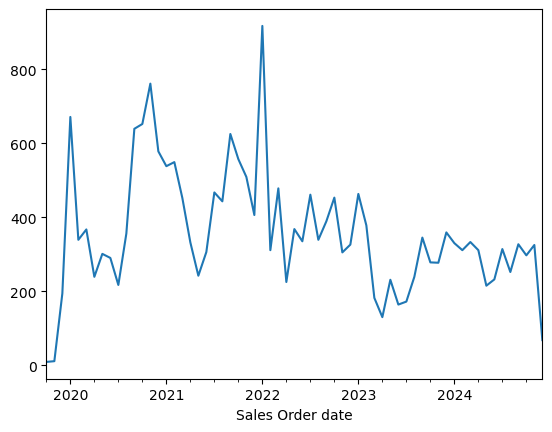

In [102]:
monthly_sales.plot(label='Actual Sales')
#clear seasonality of data

MSE: 8452.26816583062
RMSE: 91.9362179221585

 Combined Sales Volume (2020–2025):
            Actual  Fitted_ARIMA  Forecast_2025
2020-01-31   340.0      0.000000            NaN
2020-02-29   280.0    337.234591            NaN
2020-03-31   286.0    313.519667            NaN
2020-04-30   201.0    296.983798            NaN
2020-05-31   200.0    265.018412            NaN
...            ...           ...            ...
2025-08-31     NaN           NaN     312.533979
2025-09-30     NaN           NaN     318.153592
2025-10-31     NaN           NaN     321.155480
2025-11-30     NaN           NaN     324.676632
2025-12-31     NaN           NaN     326.583123

[72 rows x 3 columns]


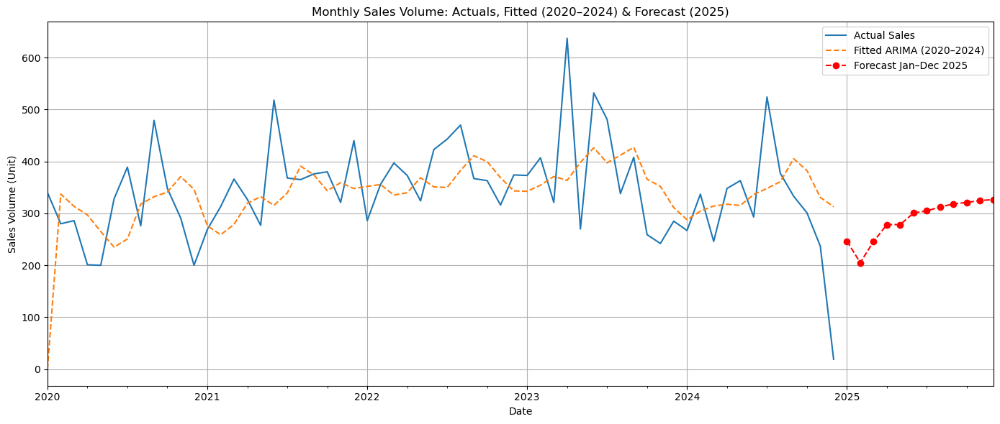

In [104]:
from statsmodels.tsa.arima.model import ARIMA
from sklearn.metrics import mean_squared_error

data3 = copy_data[copy_data['Product Name'] == 'Ultra'][['Sales Order date', 'Sales Volume (Unit)']]
data3['Sales Order date'] = pd.to_datetime(data3['Sales Order date'])
data3 = data3.set_index('Sales Order date')

monthly_sales = data3['Sales Volume (Unit)'].resample('M').sum() #aggregation to monthly sales vol data

monthly_sales_filtered = monthly_sales['2020':'2024']

model = ARIMA(monthly_sales_filtered, order=(3, 1, 2))
arma = model.fit()

pred_arma = arma.fittedvalues

mse = mean_squared_error(monthly_sales_filtered[1:], pred_arma[1:])
rms = np.sqrt(mse)
print('MSE:', mse)
print('RMSE:', rms)

forecast_steps = 12
start_forecast_date = pd.to_datetime('2025-01-31')
future_dates = pd.date_range(start=start_forecast_date, periods=forecast_steps, freq='M')
forecast_values = arma.forecast(steps=forecast_steps)
forecast_series = pd.Series(forecast_values.values, index=future_dates)

df_combined = pd.DataFrame({
    'Actual': monthly_sales_filtered, #data
    'Fitted_ARIMA': pred_arma #model
})

df_forecast = pd.DataFrame({'Forecast_2025': forecast_series})
df_all = pd.concat([df_combined, df_forecast], axis=0)

print("\n Combined Sales Volume (2020–2025):")
print(df_all)

df_all.to_csv("monthly_sales_forecast_2020_2025.csv") #after running this line you will get the downloaded data for actuals, model results and future predictions in your Home Page
#From there you need to download it and check results.

plt.figure(figsize=(14, 6))
monthly_sales_filtered.plot(label='Actual Sales')
pred_arma.plot(label='Fitted ARIMA (2020–2024)', style='--')
forecast_series.plot(label='Forecast Jan–Dec 2025', linestyle='--', marker='o', color='red')

plt.title("Monthly Sales Volume: Actuals, Fitted (2020–2024) & Forecast (2025)")
plt.xlabel("Date")
plt.ylabel("Sales Volume (Unit)")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


In [106]:
#  Check the residuals for ARMA model-Model Validation Step

from pandas import DataFrame
residuals = DataFrame(arma.resid)
residuals

,0
Sales Order date,
2020-01-31,340.000000
2020-02-29,-57.234591
2020-03-31,-27.519667
2020-04-30,-95.983798
2020-05-31,-65.018412
2020-06-30,93.078352
2020-07-31,138.384015
2020-08-31,-41.730662
2020-09-30,146.867861


<Axes: ylabel='Density'>

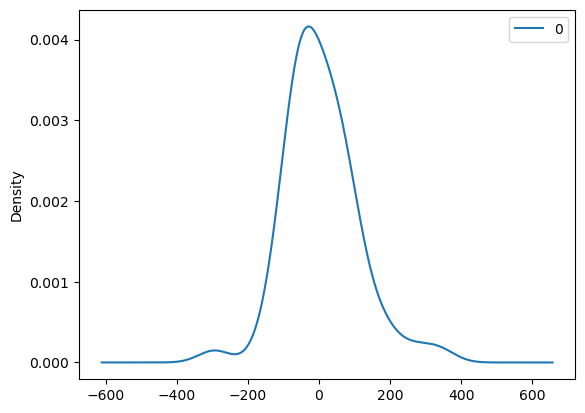

In [108]:
residuals.plot(kind = 'kde')

In [110]:
residuals.describe() #summary statistics of residuals from time series model

,0
count,60.000000
mean,6.545735
std,101.823462
min,-293.818084
25%,-55.699357
50%,-3.396290
75%,56.078513
max,340.000000


In [112]:
# Durbin Watson test with arma.resid values
sm.stats.durbin_watson(residuals.values)

array([1.71886278])

In [114]:
# Ljung box test 
from statsmodels.stats.diagnostic import acorr_ljungbox

In [116]:
# model is predicted using past 10 historical data
acorr_ljungbox(residuals, lags = 10)

,lb_stat,lb_pvalue
1,0.048278,0.826087
2,0.142336,0.931306
3,0.185781,0.979851
4,1.651223,0.799558
5,2.591723,0.762622
6,2.730726,0.841805
7,4.432818,0.728791
8,5.464672,0.706951
9,5.940863,0.745822
10,5.942307,0.820087


In [121]:
data11 = copy_data[copy_data['Product Name'] == 'Lufterhitzer TOP'][['Sales Order date', 'Net Sales (EURO)']]
data11 #for the first product vs sales in EURO 

,Sales Order date,Net Sales (EURO)
0,2019-11-13,9319.61
1,2019-11-19,9432.25
2,2019-11-27,4202.38
3,2019-11-28,2250.26
4,2019-12-05,1525.12
...,...,...
18831,2024-12-06,1552.66
18832,2024-12-06,1561.13
18841,2024-12-10,6450.89
18842,2024-12-10,1933.30


In [123]:
data12 = copy_data[copy_data['Product Name'] == 'Lufterhitzer TIP'][['Sales Order date', 'Net Sales (EURO)']]
data12 #For the secon product vs sales in Euro

,Sales Order date,Net Sales (EURO)
7,2019-12-12,547.00
8,2019-12-12,895.44
9,2019-12-12,1037.40
10,2019-12-12,2206.18
13,2019-12-17,601.09
...,...,...
18824,2024-12-09,2856.97
18834,2024-12-10,3841.87
18836,2024-12-11,1834.00
18837,2024-12-12,1219.52


In [125]:
data13 = copy_data[copy_data['Product Name'] == 'Ultra'][['Sales Order date', 'Net Sales (EURO)']]
data13 # for the third product 

,Sales Order date,Net Sales (EURO)
6,2019-12-06,3537.09
27,2019-12-10,10722.83
30,2019-12-11,2980.80
31,2019-12-12,2890.29
32,2019-12-12,641.27
...,...,...
18833,2024-12-06,1484.55
18835,2024-12-11,1680.78
18838,2024-11-04,4176.08
18839,2024-11-25,9121.98


In [127]:
data11['Sales Order date'] = pd.to_datetime(data11['Sales Order date'], errors = 'coerce') 
# by using errors = 'coerce' we ensure that even if there are any problematic date strings in the data frame column the 
# conversion process will continue with out halting due to errors. Instread it will mark those problematic entries as 
# missing values (Nat (Not a time) - this representes missing or undefined values) allowing us to identify and handle them 
# appropriately. 

In [129]:
data11.isnull().sum()

Sales Order date    0
Net Sales (EURO)    0
dtype: int64

In [131]:
data11

,Sales Order date,Net Sales (EURO)
0,2019-11-13,9319.61
1,2019-11-19,9432.25
2,2019-11-27,4202.38
3,2019-11-28,2250.26
4,2019-12-05,1525.12
...,...,...
18831,2024-12-06,1552.66
18832,2024-12-06,1561.13
18841,2024-12-10,6450.89
18842,2024-12-10,1933.30


In [133]:
data11['Sales Order date'] = data11['Sales Order date'].dt.strftime('%Y-%m-%d')

In [135]:
data11.reset_index(inplace = True)

In [137]:
# Plot the train and test data sets
train_size = int(len(data11) * 0.8)
train_data, test_data = data11[:train_size], data11[train_size:]

<Axes: >

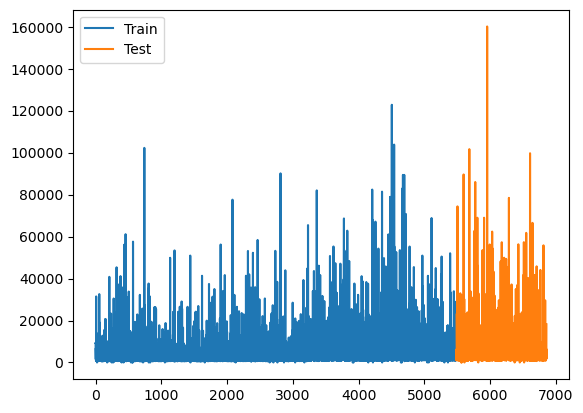

In [141]:
train_data['Net Sales (EURO)'].plot(legend=True,label='Train')
test_data['Net Sales (EURO)'].plot(legend=True,label='Test')

In [145]:
# using additive model:
import statsmodels.api as sm

decompose = sm.tsa.seasonal_decompose(data11['Net Sales (EURO)'], model = 'additive', period = 12)

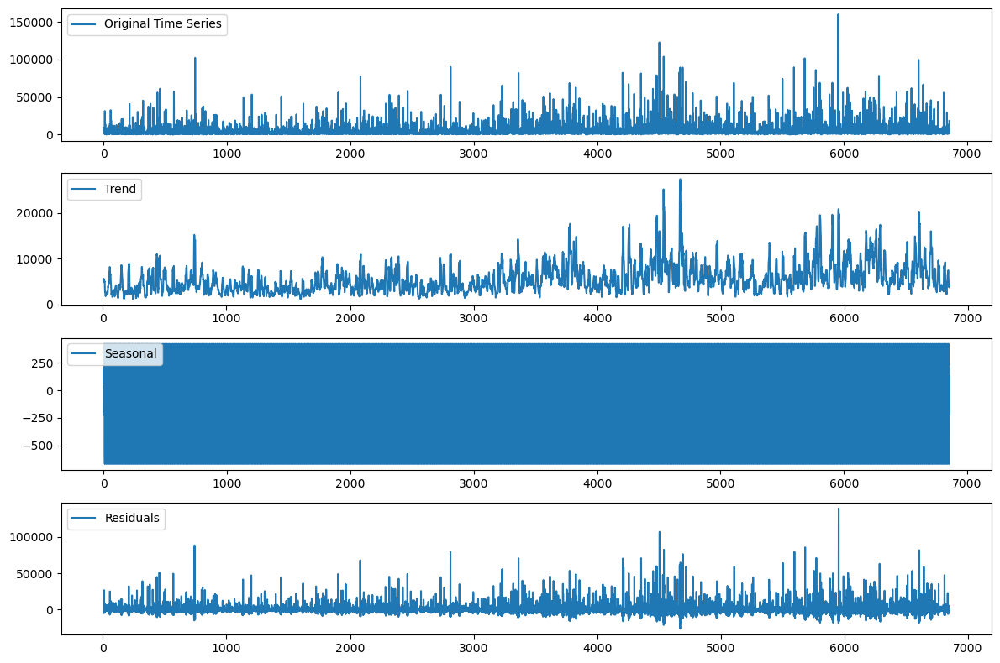

In [147]:
plt.figure(figsize=(12, 8))
plt.subplot(411)
plt.plot(data11['Net Sales (EURO)'], label='Original Time Series')
plt.legend(loc='upper left')

plt.subplot(412)
plt.plot(decompose.trend, label='Trend')
plt.legend(loc='upper left')

plt.subplot(413)
plt.plot(decompose.seasonal, label='Seasonal')
plt.legend(loc='upper left')

plt.subplot(414)
plt.plot(decompose.resid, label='Residuals')
plt.legend(loc='upper left')

plt.tight_layout()
plt.show()

In [149]:
# checking stationarity
from statsmodels.tsa.stattools import adfuller
import statsmodels.api as sm

In [151]:
# Checking the stationarity for data with help of ADF test (Augmented Dickey Fuller Test)
def test_stationarity(df):
    dftest = adfuller(train_data['Net Sales (EURO)'], autolag = "AIC")
    dfoutput = pd.DataFrame(dftest[0:4], 
                            index=['Test Statistic','p-value','Lags Used','Number of Observations'])
    for key,value in dftest[4].items(): dfoutput['Critical Value (%s)'%key] = value
    print(dfoutput)
    print('AIC:',dftest)
#p< 0.05 (5%) then we can infer that the test data is stationary

In [153]:
test_stationarity(train_data['Net Sales (EURO)'])

                                   0  Critical Value (1%)  \
Test Statistic         -9.282032e+00             -3.43155   
p-value                 1.243680e-15             -3.43155   
Lags Used               3.000000e+01             -3.43155   
Number of Observations  5.453000e+03             -3.43155   

                        Critical Value (5%)  Critical Value (10%)  
Test Statistic                     -2.86207             -2.567052  
p-value                            -2.86207             -2.567052  
Lags Used                          -2.86207             -2.567052  
Number of Observations             -2.86207             -2.567052  
AIC: (-9.28203198705972, 1.243679833862859e-15, 30, 5453, {'1%': -3.4315497764490854, '5%': -2.86207018114797, '10%': -2.5670522144011163}, 114281.98255945485)


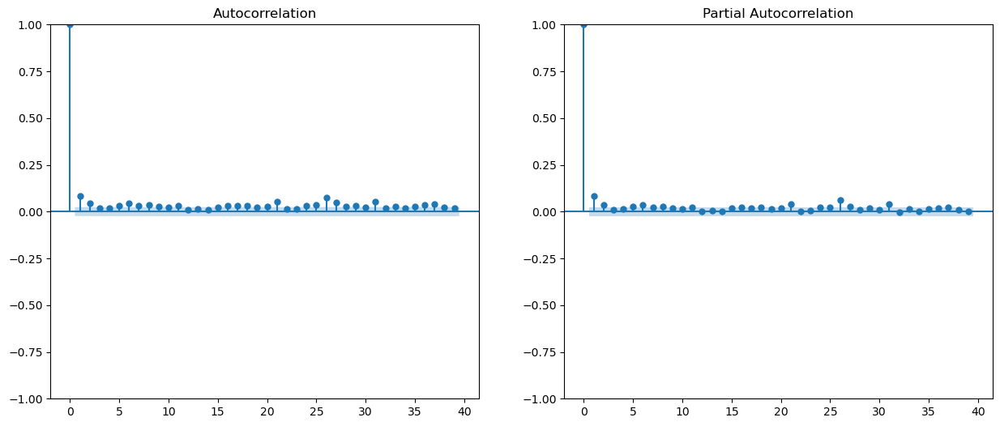

In [157]:
# Applying acf (autocorrelation function) and pacf (partial autocorrelation function)
fig = plt.figure(figsize = (15,6))
ax1 = fig.add_subplot(121)
fig = sm.graphics.tsa.plot_acf(data11['Net Sales (EURO)'].values, ax = ax1)

ax2 = fig.add_subplot(122)
fig = sm.graphics.tsa.plot_pacf(data11['Net Sales (EURO)'].values, ax = ax2)

<Axes: xlabel='Sales Order date'>

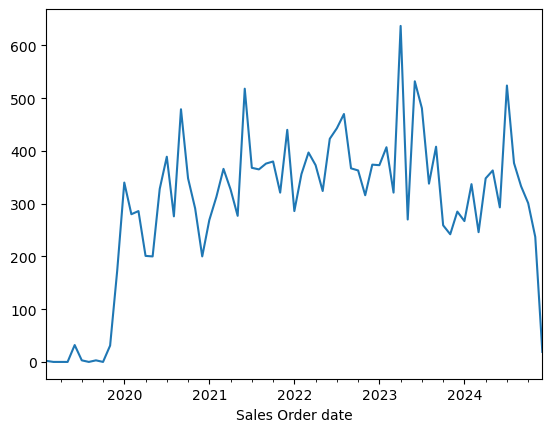

In [159]:
monthly_sales.plot(label='Actual Sales')
#clear seasonality of data

MSE: 31336220581.340702
RMSE: 177020.3959473052

 Net Sales (EURO) (2020–2025):
               Actual   Fitted_ARIMA  Forecast_2025
2020-01-31  522168.69       0.000000            NaN
2020-02-29  530985.77  336170.443869            NaN
2020-03-31  463954.01  267862.685914            NaN
2020-04-30  377806.48  305155.191932            NaN
2020-05-31  364017.05  431321.552281            NaN
...               ...            ...            ...
2025-08-31        NaN            NaN  725778.619877
2025-09-30        NaN            NaN  827494.974430
2025-10-31        NaN            NaN  751185.833596
2025-11-30        NaN            NaN  811695.612284
2025-12-31        NaN            NaN  741586.873427

[72 rows x 3 columns]


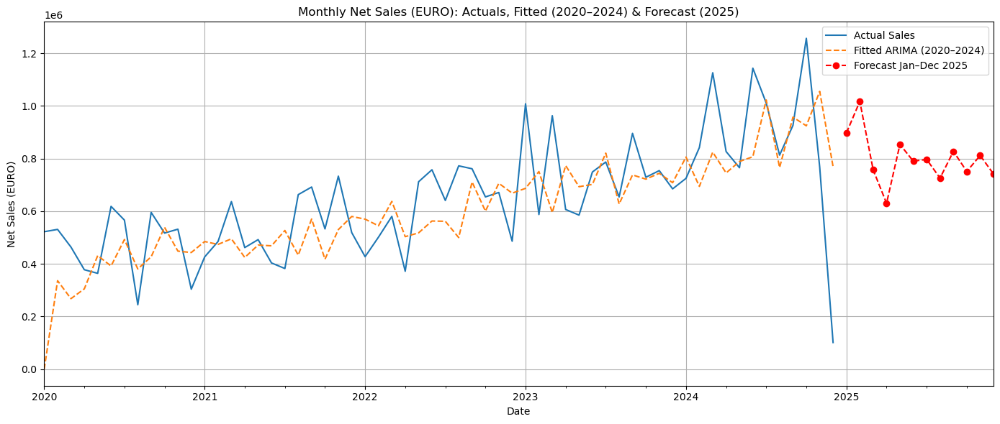

In [161]:
from statsmodels.tsa.arima.model import ARIMA
from sklearn.metrics import mean_squared_error

data11 = copy_data[copy_data['Product Name'] == 'Lufterhitzer TOP'][['Sales Order date', 'Net Sales (EURO)']]
data11['Sales Order date'] = pd.to_datetime(data11['Sales Order date'])
data11 = data11.set_index('Sales Order date')

monthly_sales = data11['Net Sales (EURO)'].resample('M').sum() #aggregation to monthly sales vol data

monthly_sales_filtered = monthly_sales['2020':'2024']

model = ARIMA(monthly_sales_filtered, order=(3, 1, 2))
arma = model.fit()

pred_arma = arma.fittedvalues

mse = mean_squared_error(monthly_sales_filtered[1:], pred_arma[1:])
rms = np.sqrt(mse)
print('MSE:', mse)
print('RMSE:', rms)

forecast_steps = 12
start_forecast_date = pd.to_datetime('2025-01-31')
future_dates = pd.date_range(start=start_forecast_date, periods=forecast_steps, freq='M')
forecast_values = arma.forecast(steps=forecast_steps)
forecast_series = pd.Series(forecast_values.values, index=future_dates)

df_combined = pd.DataFrame({
    'Actual': monthly_sales_filtered, #data
    'Fitted_ARIMA': pred_arma #model
})

df_forecast = pd.DataFrame({'Forecast_2025': forecast_series})
df_all = pd.concat([df_combined, df_forecast], axis=0)

print("\n Net Sales (EURO) (2020–2025):")
print(df_all)

df_all.to_csv("monthly_sales_forecast_2020_2025.csv") #after running this line you will get the downloaded data for actuals, model results and future predictions in your Home Page
#From there you need to download it and check results.

plt.figure(figsize=(14, 6))
monthly_sales_filtered.plot(label='Actual Sales')
pred_arma.plot(label='Fitted ARIMA (2020–2024)', style='--')
forecast_series.plot(label='Forecast Jan–Dec 2025', linestyle='--', marker='o', color='red')

plt.title("Monthly Net Sales (EURO): Actuals, Fitted (2020–2024) & Forecast (2025)")
plt.xlabel("Date")
plt.ylabel("Net Sales (EURO)")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


In [163]:
#  Check the residuals for ARMA model-Model Validation Step

from pandas import DataFrame
residuals = DataFrame(arma.resid)
residuals

,0
Sales Order date,
2020-01-31,522168.690000
2020-02-29,194815.326131
2020-03-31,196091.324086
2020-04-30,72651.288068
2020-05-31,-67304.502281
2020-06-30,226499.576973
2020-07-31,73710.602176
2020-08-31,-136021.711949
2020-09-30,168568.723483


<Axes: ylabel='Density'>

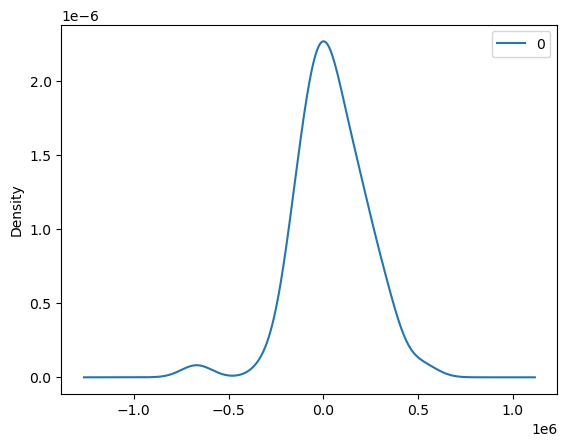

In [165]:
residuals.plot(kind = 'kde')

In [167]:
residuals.describe() #summary statistics of residuals from time series model

,0
count,60.000000
mean,42723.964979
std,184665.383325
min,-668134.119518
25%,-59189.738715
50%,32105.376889
75%,160627.361346
max,522168.690000


In [169]:
# Durbin Watson test with arma.resid values
sm.stats.durbin_watson(residuals.values)

array([1.51884185])

In [171]:
# Ljung box test 
from statsmodels.stats.diagnostic import acorr_ljungbox

In [173]:
# model is predicted using past 10 historical data
acorr_ljungbox(residuals, lags = 10)

,lb_stat,lb_pvalue
1,0.017245,0.895522
2,0.049675,0.975468
3,0.049877,0.997081
4,0.753149,0.944616
5,0.779871,0.978299
6,1.479783,0.960826
7,1.604970,0.978452
8,1.607673,0.990772
9,2.615743,0.977607
10,3.048423,0.980261


In [175]:
data12['Sales Order date'] = pd.to_datetime(data12['Sales Order date'], errors = 'coerce') 
# by using errors = 'coerce' we ensure that even if there are any problematic date strings in the data frame column the 
# conversion process will continue with out halting due to errors. Instread it will mark those problematic entries as 
# missing values (Nat (Not a time) - this representes missing or undefined values) allowing us to identify and handle them 
# appropriately. 

In [177]:
data12.isnull().sum()

Sales Order date    0
Net Sales (EURO)    0
dtype: int64

In [179]:
data12

,Sales Order date,Net Sales (EURO)
7,2019-12-12,547.00
8,2019-12-12,895.44
9,2019-12-12,1037.40
10,2019-12-12,2206.18
13,2019-12-17,601.09
...,...,...
18824,2024-12-09,2856.97
18834,2024-12-10,3841.87
18836,2024-12-11,1834.00
18837,2024-12-12,1219.52


In [181]:
data12['Sales Order date'] = data12['Sales Order date'].dt.strftime('%Y-%m-%d')

In [183]:
data12.reset_index(inplace = True)

In [185]:
# Plot the train and test data sets
train_size = int(len(data12) * 0.8)
train_data, test_data = data12[:train_size], data12[train_size:]

<Axes: >

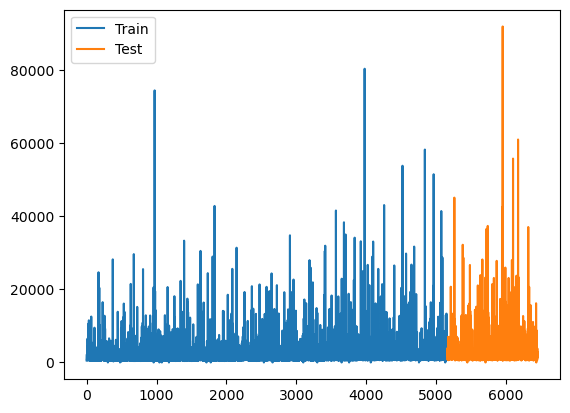

In [187]:
train_data['Net Sales (EURO)'].plot(legend=True,label='Train')
test_data['Net Sales (EURO)'].plot(legend=True,label='Test')

In [189]:
# using additive model:
import statsmodels.api as sm

decompose = sm.tsa.seasonal_decompose(data12['Net Sales (EURO)'], model = 'additive', period = 12)

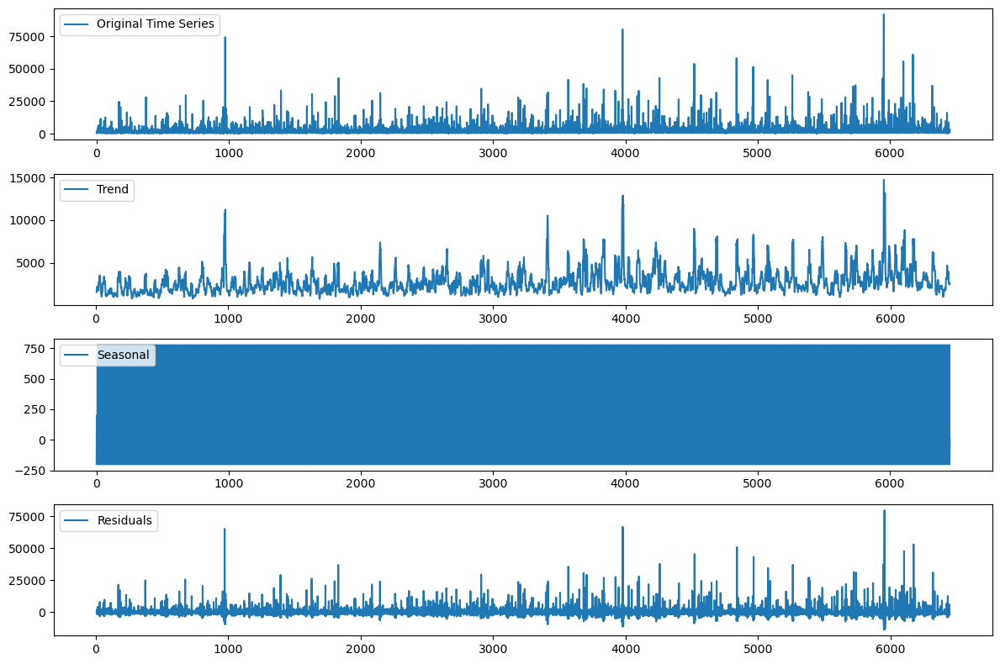

In [191]:
plt.figure(figsize=(12, 8))
plt.subplot(411)
plt.plot(data12['Net Sales (EURO)'], label='Original Time Series')
plt.legend(loc='upper left')

plt.subplot(412)
plt.plot(decompose.trend, label='Trend')
plt.legend(loc='upper left')

plt.subplot(413)
plt.plot(decompose.seasonal, label='Seasonal')
plt.legend(loc='upper left')

plt.subplot(414)
plt.plot(decompose.resid, label='Residuals')
plt.legend(loc='upper left')

plt.tight_layout()
plt.show()

In [193]:
# checking stationarity
from statsmodels.tsa.stattools import adfuller
import statsmodels.api as sm

In [195]:
# Checking the stationarity for data with help of ADF test (Augmented Dickey Fuller Test)
def test_stationarity(df):
    dftest = adfuller(train_data['Net Sales (EURO)'], autolag = "AIC")
    dfoutput = pd.DataFrame(dftest[0:4], 
                            index=['Test Statistic','p-value','Lags Used','Number of Observations'])
    for key,value in dftest[4].items(): dfoutput['Critical Value (%s)'%key] = value
    print(dfoutput)
    print('AIC:',dftest)
#p< 0.05 (5%) then we can infer that the test data is stationary

In [197]:
test_stationarity(train_data['Net Sales (EURO)'])

                                  0  Critical Value (1%)  Critical Value (5%)  \
Test Statistic           -19.354945             -3.43162            -2.862101   
p-value                    0.000000             -3.43162            -2.862101   
Lags Used                 10.000000             -3.43162            -2.862101   
Number of Observations  5153.000000             -3.43162            -2.862101   

                        Critical Value (10%)  
Test Statistic                     -2.567069  
p-value                            -2.567069  
Lags Used                          -2.567069  
Number of Observations             -2.567069  
AIC: (-19.35494485774354, 0.0, 10, 5153, {'1%': -3.4316196604912346, '5%': -2.862101056309954, '10%': -2.5670686503239564}, 100292.55760601803)


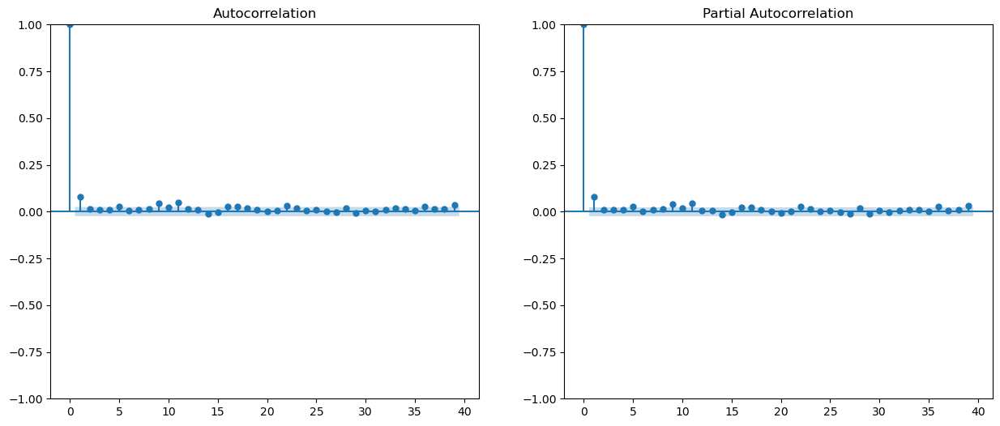

In [199]:
# Applying acf (autocorrelation function) and pacf (partial autocorrelation function)
fig = plt.figure(figsize = (15,6))
ax1 = fig.add_subplot(121)
fig = sm.graphics.tsa.plot_acf(data12['Net Sales (EURO)'].values, ax = ax1)

ax2 = fig.add_subplot(122)
fig = sm.graphics.tsa.plot_pacf(data12['Net Sales (EURO)'].values, ax = ax2)

<Axes: xlabel='Sales Order date'>

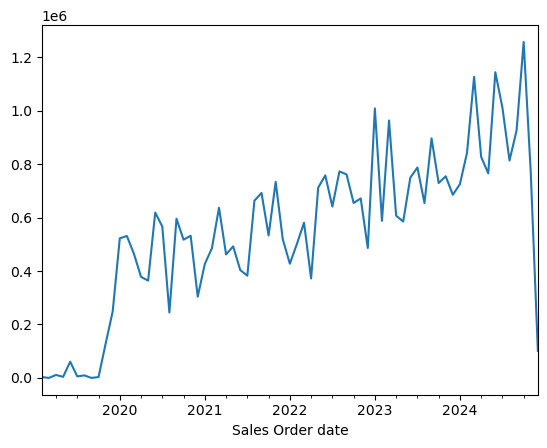

In [201]:
monthly_sales.plot(label='Actual Sales')
#clear seasonality of data

MSE: 7088718431.297661
RMSE: 84194.52732391613

 Net Sales (EURO) (2020–2025):
               Actual   Fitted_ARIMA  Forecast_2025
2020-01-31  408629.38       0.000000            NaN
2020-02-29  209850.78  261353.280607            NaN
2020-03-31  205630.16  278542.454643            NaN
2020-04-30  154451.59  153089.782895            NaN
2020-05-31  193935.10  184652.053425            NaN
...               ...            ...            ...
2025-08-31        NaN            NaN  262191.094774
2025-09-30        NaN            NaN  270569.319607
2025-10-31        NaN            NaN  270343.123256
2025-11-30        NaN            NaN  274766.917287
2025-12-31        NaN            NaN  274687.344028

[72 rows x 3 columns]


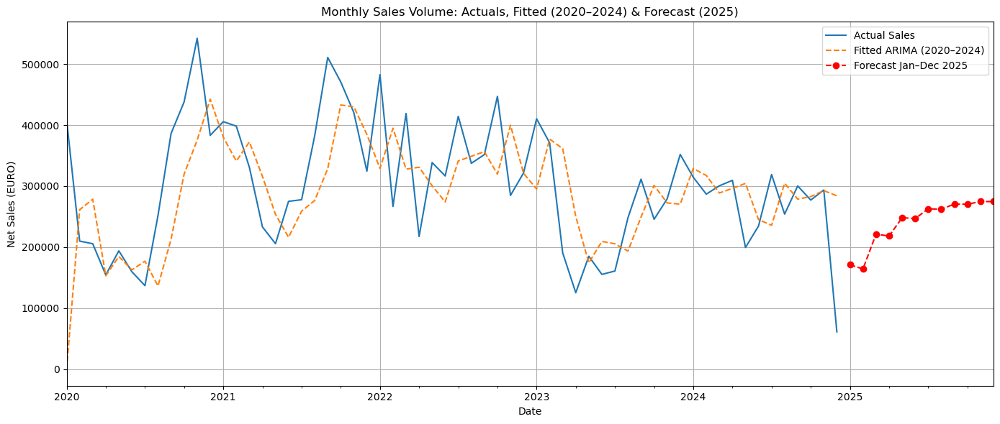

In [203]:
from statsmodels.tsa.arima.model import ARIMA
from sklearn.metrics import mean_squared_error

data12 = copy_data[copy_data['Product Name'] == 'Lufterhitzer TIP'][['Sales Order date', 'Net Sales (EURO)']]
data12['Sales Order date'] = pd.to_datetime(data12['Sales Order date'])
data12 = data12.set_index('Sales Order date')

monthly_sales = data12['Net Sales (EURO)'].resample('M').sum() #aggregation to monthly sales vol data

monthly_sales_filtered = monthly_sales['2020':'2024']

model = ARIMA(monthly_sales_filtered, order=(3, 1, 2))
arma = model.fit()

pred_arma = arma.fittedvalues

mse = mean_squared_error(monthly_sales_filtered[1:], pred_arma[1:])
rms = np.sqrt(mse)
print('MSE:', mse)
print('RMSE:', rms)

forecast_steps = 12
start_forecast_date = pd.to_datetime('2025-01-31')
future_dates = pd.date_range(start=start_forecast_date, periods=forecast_steps, freq='M')
forecast_values = arma.forecast(steps=forecast_steps)
forecast_series = pd.Series(forecast_values.values, index=future_dates)

df_combined = pd.DataFrame({
    'Actual': monthly_sales_filtered, #data
    'Fitted_ARIMA': pred_arma #model
})

df_forecast = pd.DataFrame({'Forecast_2025': forecast_series})
df_all = pd.concat([df_combined, df_forecast], axis=0)

print("\n Net Sales (EURO) (2020–2025):")
print(df_all)

df_all.to_csv("monthly_sales_forecast_2020_2025.csv") #after running this line you will get the downloaded data for actuals, model results and future predictions in your Home Page
#From there you need to download it and check results.

plt.figure(figsize=(14, 6))
monthly_sales_filtered.plot(label='Actual Sales')
pred_arma.plot(label='Fitted ARIMA (2020–2024)', style='--')
forecast_series.plot(label='Forecast Jan–Dec 2025', linestyle='--', marker='o', color='red')

plt.title("Monthly Sales Volume: Actuals, Fitted (2020–2024) & Forecast (2025)")
plt.xlabel("Date")
plt.ylabel("Net Sales (EURO)")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


In [205]:
#  Check the residuals for ARMA model-Model Validation Step

from pandas import DataFrame
residuals = DataFrame(arma.resid)
residuals

,0
Sales Order date,
2020-01-31,408629.380000
2020-02-29,-51502.500607
2020-03-31,-72912.294643
2020-04-30,1361.807105
2020-05-31,9283.046575
2020-06-30,-3026.714536
2020-07-31,-40100.949493
2020-08-31,115566.738692
2020-09-30,173383.405531


<Axes: ylabel='Density'>

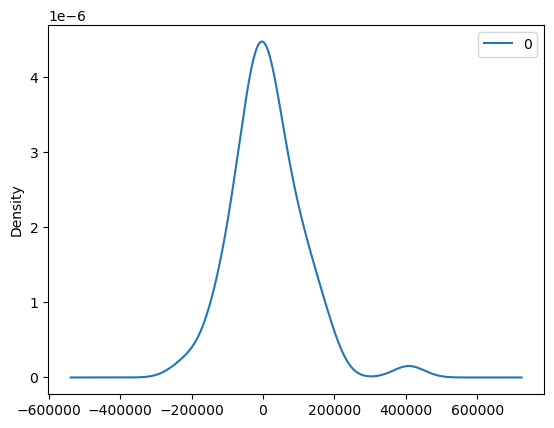

In [207]:
residuals.plot(kind = 'kde')

In [209]:
residuals.describe() #summary statistics of residuals from time series model

,0
count,60.000000
mean,12167.309779
std,98834.714962
min,-222897.537620
25%,-48710.826780
50%,1181.777239
75%,59652.761685
max,408629.380000


In [211]:
# Durbin Watson test with arma.resid values
sm.stats.durbin_watson(residuals.values)

array([1.61072197])

In [213]:
# Ljung box test 
from statsmodels.stats.diagnostic import acorr_ljungbox

In [215]:
# model is predicted using past 10 historical data
acorr_ljungbox(residuals, lags = 10)

,lb_stat,lb_pvalue
1,0.000272,0.986850
2,0.117508,0.942939
3,0.129503,0.988076
4,0.648111,0.957570
5,3.302385,0.653477
6,5.405590,0.492940
7,7.619462,0.367341
8,7.749073,0.458357
9,7.946246,0.539572
10,11.389514,0.327987


In [217]:
data13['Sales Order date'] = pd.to_datetime(data13['Sales Order date'], errors = 'coerce') 
# by using errors = 'coerce' we ensure that even if there are any problematic date strings in the data frame column the 
# conversion process will continue with out halting due to errors. Instread it will mark those problematic entries as 
# missing values (Nat (Not a time) - this representes missing or undefined values) allowing us to identify and handle them 
# appropriately. 

In [219]:
data13.isnull().sum()

Sales Order date    0
Net Sales (EURO)    0
dtype: int64

In [221]:
data13

,Sales Order date,Net Sales (EURO)
6,2019-12-06,3537.09
27,2019-12-10,10722.83
30,2019-12-11,2980.80
31,2019-12-12,2890.29
32,2019-12-12,641.27
...,...,...
18833,2024-12-06,1484.55
18835,2024-12-11,1680.78
18838,2024-11-04,4176.08
18839,2024-11-25,9121.98


In [223]:
data13['Sales Order date'] = data13['Sales Order date'].dt.strftime('%Y-%m-%d')

In [225]:
data13.reset_index(inplace = True)

In [227]:
# Plot the train and test data sets
train_size = int(len(data13) * 0.8)
train_data, test_data = data13[:train_size], data13[train_size:]

<Axes: >

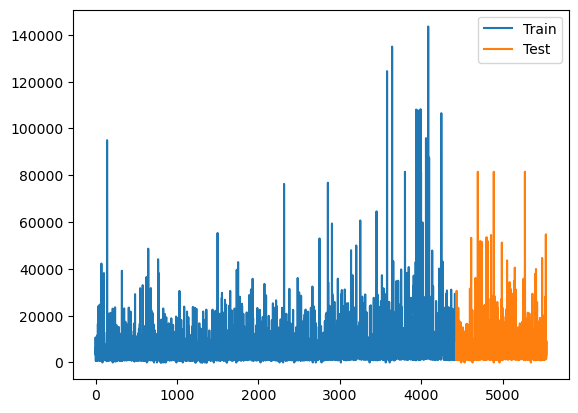

In [230]:
train_data['Net Sales (EURO)'].plot(legend=True,label='Train')
test_data['Net Sales (EURO)'].plot(legend=True,label='Test')

In [232]:
# using additive model:
import statsmodels.api as sm

decompose = sm.tsa.seasonal_decompose(data13['Net Sales (EURO)'], model = 'additive', period = 12)

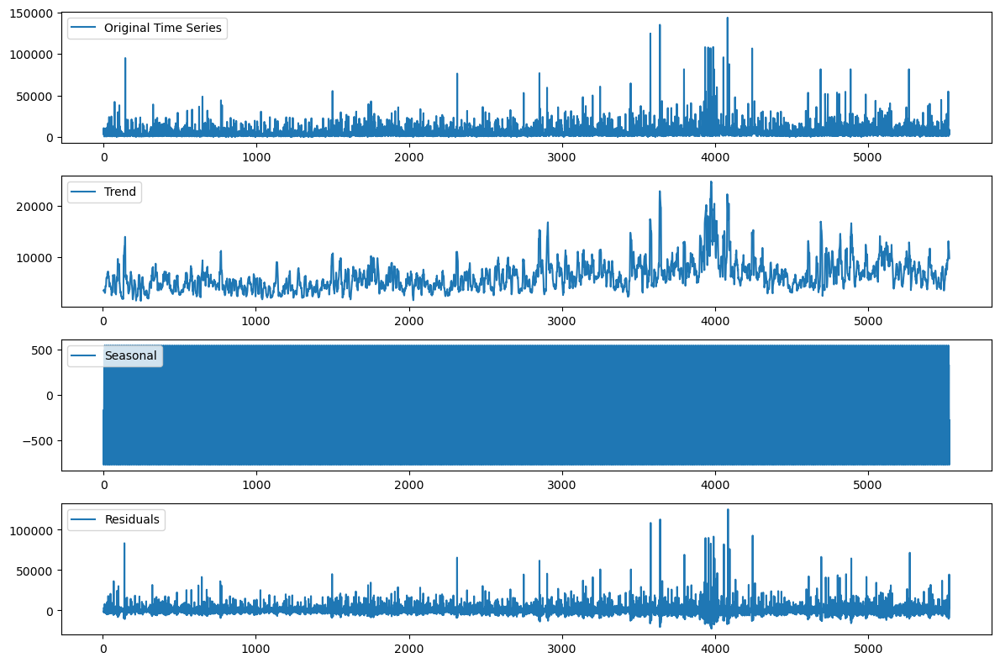

In [234]:
plt.figure(figsize=(12, 8))
plt.subplot(411)
plt.plot(data13['Net Sales (EURO)'], label='Original Time Series')
plt.legend(loc='upper left')

plt.subplot(412)
plt.plot(decompose.trend, label='Trend')
plt.legend(loc='upper left')

plt.subplot(413)
plt.plot(decompose.seasonal, label='Seasonal')
plt.legend(loc='upper left')

plt.subplot(414)
plt.plot(decompose.resid, label='Residuals')
plt.legend(loc='upper left')

plt.tight_layout()
plt.show()

In [236]:
# checking stationarity
from statsmodels.tsa.stattools import adfuller
import statsmodels.api as sm

In [238]:
# Checking the stationarity for data with help of ADF test (Augmented Dickey Fuller Test)
def test_stationarity(df):
    dftest = adfuller(train_data['Net Sales (EURO)'], autolag = "AIC")
    dfoutput = pd.DataFrame(dftest[0:4], 
                            index=['Test Statistic','p-value','Lags Used','Number of Observations'])
    for key,value in dftest[4].items(): dfoutput['Critical Value (%s)'%key] = value
    print(dfoutput)
    print('AIC:',dftest)
#p< 0.05 (5%) then we can infer that the test data is stationary

In [240]:
test_stationarity(train_data['Net Sales (EURO)'])

                                   0  Critical Value (1%)  \
Test Statistic         -8.044432e+00            -3.431837   
p-value                 1.810472e-12            -3.431837   
Lags Used               2.600000e+01            -3.431837   
Number of Observations  4.401000e+03            -3.431837   

                        Critical Value (5%)  Critical Value (10%)  
Test Statistic                    -2.862197              -2.56712  
p-value                           -2.862197              -2.56712  
Lags Used                         -2.862197              -2.56712  
Number of Observations            -2.862197              -2.56712  
AIC: (-8.044432030063886, 1.810472182852741e-12, 26, 4401, {'1%': -3.4318367344317724, '5%': -2.8621969561738974, '10%': -2.5671197019459284}, 92245.53160520918)


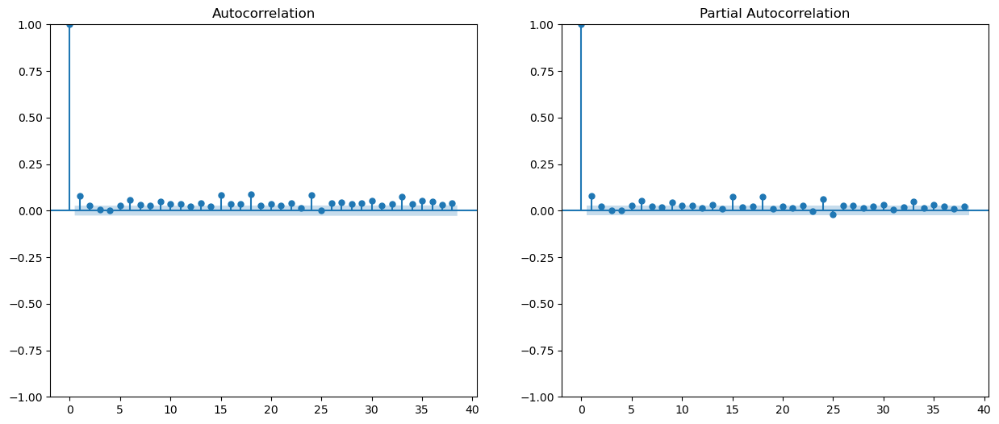

In [242]:
# Applying acf (autocorrelation function) and pacf (partial autocorrelation function)
fig = plt.figure(figsize = (15,6))
ax1 = fig.add_subplot(121)
fig = sm.graphics.tsa.plot_acf(data13['Net Sales (EURO)'].values, ax = ax1)

ax2 = fig.add_subplot(122)
fig = sm.graphics.tsa.plot_pacf(data13['Net Sales (EURO)'].values, ax = ax2)

<Axes: xlabel='Sales Order date'>

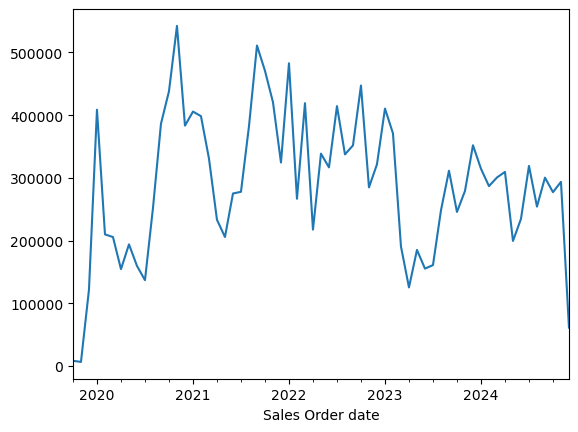

In [244]:
monthly_sales.plot(label='Actual Sales')
#clear seasonality of data

MSE: 26567130791.92544
RMSE: 162994.2661320497

 Net Sales (EURO) (2020–2025):
               Actual   Fitted_ARIMA  Forecast_2025
2020-01-31  528586.17       0.000000            NaN
2020-02-29  364822.85  219193.640208            NaN
2020-03-31  475066.05  399721.143182            NaN
2020-04-30  320406.67  505026.605967            NaN
2020-05-31  316626.74  393944.968249            NaN
...               ...            ...            ...
2025-08-31        NaN            NaN  219730.630510
2025-09-30        NaN            NaN  156219.555512
2025-10-31        NaN            NaN  236810.945416
2025-11-30        NaN            NaN  229190.833661
2025-12-31        NaN            NaN  166738.203786

[72 rows x 3 columns]


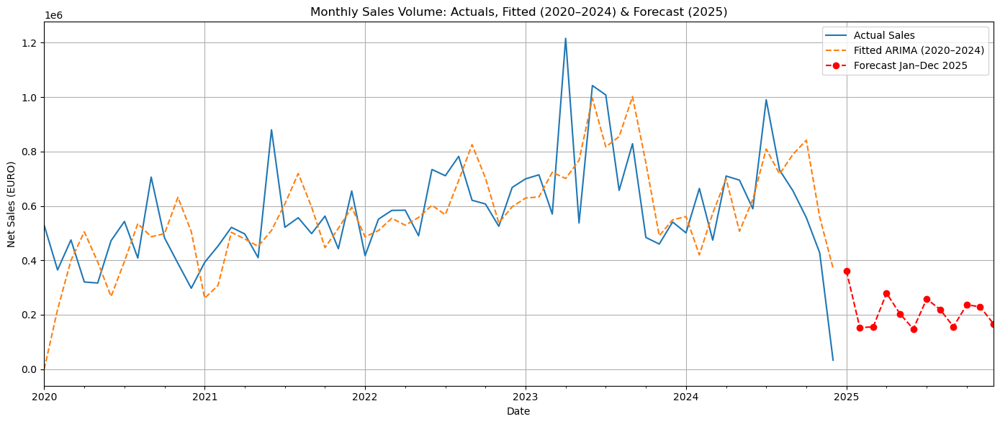

In [246]:
from statsmodels.tsa.arima.model import ARIMA
from sklearn.metrics import mean_squared_error

data13 = copy_data[copy_data['Product Name'] == 'Ultra'][['Sales Order date', 'Net Sales (EURO)']]
data13['Sales Order date'] = pd.to_datetime(data13['Sales Order date'])
data13 = data13.set_index('Sales Order date')

monthly_sales = data13['Net Sales (EURO)'].resample('M').sum() #aggregation to monthly sales vol data

monthly_sales_filtered = monthly_sales['2020':'2024']

model = ARIMA(monthly_sales_filtered, order=(3, 1, 2))
arma = model.fit()

pred_arma = arma.fittedvalues

mse = mean_squared_error(monthly_sales_filtered[1:], pred_arma[1:])
rms = np.sqrt(mse)
print('MSE:', mse)
print('RMSE:', rms)

forecast_steps = 12
start_forecast_date = pd.to_datetime('2025-01-31')
future_dates = pd.date_range(start=start_forecast_date, periods=forecast_steps, freq='M')
forecast_values = arma.forecast(steps=forecast_steps)
forecast_series = pd.Series(forecast_values.values, index=future_dates)

df_combined = pd.DataFrame({
    'Actual': monthly_sales_filtered, #data
    'Fitted_ARIMA': pred_arma #model
})

df_forecast = pd.DataFrame({'Forecast_2025': forecast_series})
df_all = pd.concat([df_combined, df_forecast], axis=0)

print("\n Net Sales (EURO) (2020–2025):")
print(df_all)

df_all.to_csv("monthly_sales_forecast_2020_2025.csv") #after running this line you will get the downloaded data for actuals, model results and future predictions in your Home Page
#From there you need to download it and check results.

plt.figure(figsize=(14, 6))
monthly_sales_filtered.plot(label='Actual Sales')
pred_arma.plot(label='Fitted ARIMA (2020–2024)', style='--')
forecast_series.plot(label='Forecast Jan–Dec 2025', linestyle='--', marker='o', color='red')

plt.title("Monthly Sales Volume: Actuals, Fitted (2020–2024) & Forecast (2025)")
plt.xlabel("Date")
plt.ylabel("Net Sales (EURO)")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


In [248]:
#  Check the residuals for ARMA model-Model Validation Step

from pandas import DataFrame
residuals = DataFrame(arma.resid)
residuals

,0
Sales Order date,
2020-01-31,528586.170000
2020-02-29,145629.209792
2020-03-31,75344.906818
2020-04-30,-184619.935967
2020-05-31,-77318.228249
2020-06-30,205117.403183
2020-07-31,147215.448998
2020-08-31,-126428.338216
2020-09-30,219424.211081


<Axes: ylabel='Density'>

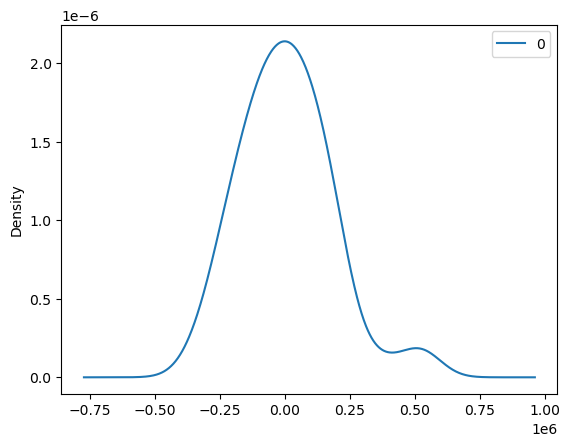

In [250]:
residuals.plot(kind = 'kde')

In [252]:
residuals.describe() #summary statistics of residuals from time series model

,0
count,60.000000
mean,6173.131137
std,176816.365670
min,-338090.136881
25%,-105794.308382
50%,1176.012351
75%,119841.606165
max,528586.170000


In [254]:
# Durbin Watson test with arma.resid values
sm.stats.durbin_watson(residuals.values)

array([1.78985578])

In [256]:
# Ljung box test 
from statsmodels.stats.diagnostic import acorr_ljungbox

In [258]:
# model is predicted using past 10 historical data
acorr_ljungbox(residuals, lags = 10)

,lb_stat,lb_pvalue
1,0.000289,0.986438
2,0.024556,0.987797
3,0.154296,0.984607
4,0.377117,0.984307
5,0.439519,0.994171
6,1.065737,0.982997
7,2.161357,0.950372
8,2.830096,0.944563
9,3.074309,0.961276
10,3.383585,0.970904
